 <h2 style="text-align: center;"> Optimizing The Business Processes of Retail and E-Commerce Platforms with Data Analytics and Machine Learning </h2>

# DAB402 - Capstone Project
# Group No : 7
# Section : 004

## Member Details:

### 1. Kushal Patel (0746803)
### 2. Viraj Modi (0748396)
### 3. Vishakha Parab (0754312)

<p style="font-size: 25px;">Main objective of this document is to explore our dataset that we have selected for our project.We will do basic exploration of our data by identifying various things such as like finding number of observation and features, datatype of each feature and convert them if necessary,removing special and unwnated symbols like ('$',',','%') etc. Apart from this we will explore numerical and categorical features to get more insight about data.</p>

<p style= "font-size: 30px;">Data Description:</p>

<p style="font-size:18px;">The dataset we have selected for our project is from "Strategy Titan" company. It is sales data of a organization where each record is an order placed by customer from December 2015 to January 2020. They have made this dataset open for public so that you can make use of your analytical and machine learnig skills to provide solutions for business and finance industry which will eventually help organizations to build various strategy and make decisions for organization.The dataset can be downloaded from <a herf="https://www.strategytitan.com/blog/titanized-real-world-dataset-to-develop-your-analytics-muscle">here.</a></p>

<p style= "font-size: 30px;">Brief Data Description:</p>

- <b>Profit Ratio:</b> The profit (in %) earned on the total sales.
- <b>Category:</b> Category in which the product lies for example Furniture,Office Supplies,Parts, and Technology.
- <b>City:</b> City (in USA) from where the customer has bought the product.
- <b>Country/Region:</b> Country from where the customer has bought the product.
- <b>Customer Name:</b> Name of the customer.
- <b>Discount:</b> Any discount (in %) provided to the customer.
- <b>Order Date:</b> Date on which the order has been placed.
- <b>Order ID:</b> Unique ID for the specific order.
- <b>Postal Code:</b> Postal code where the customer has placed the order.
- <b>Manufacturer:</b> Company which is manufacturing the product.
- <b>Product Name:</b> Name of the Product.
- <b>Profit:</b> Profit (in %) form the total sales.
- <b>Quantity:</b> Quantity in the order.
- <b>Region:</b> Region from where customer is located for example south,north,east,and west.
- <b>Sales:</b> Total amount of money spent by the customer.
- <b>Segment:</b> Which segment the customer lies for example consumer,corporate, and home office.
- <b>Ship Date:</b> Date of shipping.
- <b>Ship Mode:</b> What is the mode of shipping for example Standard Class,First Class,Second Class,Same Day,Drop Ship. 
- <b>State:</b> From which state the order is?.
- <b>Sub-Category:</b> Subcategory under the category of the product.
- <b>Freight Bill:</b> Money required for deliver the product form manufacturer to customer.
- <b>Freight Recovery:</b> The amount of freight recovered (in %).
- <b>Freight Gain/Loss</b>: Amount of money gained or lost on each freight bill.
- <b>Channel:</b> Medium of shopping for example Reatil, Distribution, E-commerece.

In [1]:
# Importing Required Library

import pandas as pd # for data manipluation
import numpy as np  # for data calculations and statistical measurement
import matplotlib.pyplot as plt #for ineractive visualization charts
import seaborn as sns #for ineractive visualization charts
color = sns.color_palette() #for accessing colors to assign charts

from mlxtend.frequent_patterns import fpgrowth # for doing association rule mining on data
from mlxtend.frequent_patterns import association_rules # For creating different association rules

%matplotlib inline 
import warnings
warnings.filterwarnings("ignore")

In [2]:
#from google.colab import files
#uploaded = files.upload()

In [3]:
# Reading the dataset and stroing into variable

titan_sales = pd.read_excel('titanized_sales___profit_data.xlsx',sheet_name='Titanized Sales Data')

In [4]:
#import io

# df = io.BytesIO(uploaded.get('titanized_sales___profit_data_viraj.xlsx'))

In [5]:
# titan_sales = pd.read_excel(df, 'Titanized Sales Data')

In [6]:
# Looking at first inital records of data

pd.set_option('display.max_columns', None) # To show all columns in the print
titan_sales.head(5)

,Profit Ratio,Category,City,Country/Region,Customer Name,Discount,Order Date,Order ID,Postal Code,Manufacturer,Product Name,Profit,Quantity,Region,Sales,Segment,Ship Date,Ship Mode,State,Sub-Category,Freight Bill ($),Freight Recovery ($),Freight Gain/Loss ($),Channel
0,0.16,Furniture,Henderson,United States,Claire Gute,0.00,2018-11-08,CA-2018-152156,42420,Bush,Bush Somerset Collection Bookcase,42.0,2,South,262,Consumer,2018-11-11,Second Class,Kentucky,Bookcases,65.50,0.87,-8.52,Retail
1,0.30,Furniture,Henderson,United States,Claire Gute,0.00,2018-11-08,CA-2018-152156,42420,Hon,"Hon Deluxe Fabric Upholstered Stacking Chairs,...",220.0,3,South,732,Consumer,2018-11-11,Second Class,Kentucky,Chairs,183.00,0.53,-86.01,Retail
2,0.47,Office Supplies,Los Angeles,United States,Darrin Van Huff,0.00,2018-06-12,CA-2018-138688,90036,Universal,Self-Adhesive Address Labels for Typewriters b...,7.0,2,West,15,Corporate,2018-06-16,Second Class,California,Labels,3.75,0.92,-0.30,Retail
3,-0.40,Furniture,Fort Lauderdale,United States,Sean O'Donnell,0.45,2017-10-11,US-2017-108966,33311,Bretford,Bretford CR4500 Series Slim Rectangular Table,-383.0,5,South,958,Consumer,2017-10-18,Standard Class,Florida,Tables,95.80,0.68,-30.66,Retail
4,0.11,Office Supplies,Fort Lauderdale,United States,Sean O'Donnell,0.20,2017-10-11,US-2017-108966,33311,Eldon,Eldon Fold 'N Roll Cart System,3.0,2,South,22,Consumer,2017-10-18,Standard Class,Florida,Storage,2.20,1.04,0.09,Retail


In [7]:
# looking at shape of data
titan_sales.shape

(159904, 24)

In [8]:
# looking datatype of all features
titan_sales.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 159904 entries, 0 to 159903
Data columns (total 24 columns):
 #   Column                 Non-Null Count   Dtype         
---  ------                 --------------   -----         
 0   Profit Ratio           159902 non-null  float64       
 1   Category               159904 non-null  object        
 2   City                   159904 non-null  object        
 3   Country/Region         159904 non-null  object        
 4   Customer Name          159904 non-null  object        
 5   Discount               159904 non-null  float64       
 6   Order Date             159904 non-null  datetime64[ns]
 7   Order ID               159904 non-null  object        
 8   Postal Code            159904 non-null  int64         
 9   Manufacturer           159904 non-null  object        
 10  Product Name           159904 non-null  object        
 11  Profit                 159903 non-null  float64       
 12  Quantity               159904 non-null  int6

In [9]:
# Looking at five point summary for all numerical features
titan_sales.describe()

,Profit Ratio,Discount,Postal Code,Profit,Quantity,Sales,Freight Bill ($),Freight Recovery ($),Freight Gain/Loss ($)
count,159902.000000,159904.000000,159904.000000,1.599030e+05,159904.000000,1.599040e+05,159904.000000,159904.000000,159904.000000
mean,0.248487,0.087570,56206.780956,6.894831e+02,42.715880,3.192707e+03,254.988762,0.921723,-11.635848
std,0.286819,0.088028,31654.977449,7.995852e+03,97.147635,1.881898e+04,1306.060124,0.241597,571.046234
min,-4.860000,0.000000,1002.000000,-8.870400e+05,1.000000,0.000000e+00,0.000000,0.300000,-195840.000000
25%,0.180000,0.030000,25703.000000,1.700000e+01,6.000000,8.800000e+01,10.000000,0.740000,-8.720000
50%,0.270000,0.070000,60540.000000,7.700000e+01,12.000000,3.400000e+02,37.800000,0.950000,-0.850000
75%,0.380000,0.130000,85705.000000,3.760000e+02,21.000000,1.480000e+03,157.300000,1.080000,2.080000
max,1.230000,0.800000,99362.000000,1.176000e+06,1200.000000,1.960000e+06,288000.000000,1.500000,21888.000000


<p style="font-size:30px;">Few Observations</p>

After basic exploration of dataset we can notice few observation such as:

- There are total 24 features and 1,59,904 observations in the dataset.
- Each feature is having the proper datatype according to their observations.
- Some of the numerical columns such as Profit Ratio, Profit, and Frieght Gain/Loss have negative values which shows that these are the losses for the organization.
- All numerical features have total <b>1,59,904</b> observations but <b>Profit Ratio</b> have <b>1,59,902</b> observations and <b>Profit</b> have <b>1,59,903</b> observations which suggest that there are null values in this columns that needs to be addresed.



<p style="font-size:30px;">Finding & Handling Null Values</p>

In [10]:
# finding null/garbage value

print('Count of Nulls in each feature:\n',titan_sales.isnull().sum())

Count of Nulls in each feature:
 Profit Ratio             2
Category                 0
City                     0
Country/Region           0
Customer Name            0
Discount                 0
Order Date               0
Order ID                 0
Postal Code              0
Manufacturer             0
Product Name             0
Profit                   1
Quantity                 0
Region                   0
Sales                    0
Segment                  0
Ship Date                0
Ship Mode                0
State                    0
Sub-Category             0
Freight Bill ($)         0
Freight Recovery ($)     0
Freight Gain/Loss ($)    0
Channel                  0
dtype: int64


In [11]:
#Checking rows with null values
null_values = titan_sales[titan_sales.isna().any(axis=1)]

null_values

,Profit Ratio,Category,City,Country/Region,Customer Name,Discount,Order Date,Order ID,Postal Code,Manufacturer,Product Name,Profit,Quantity,Region,Sales,Segment,Ship Date,Ship Mode,State,Sub-Category,Freight Bill ($),Freight Recovery ($),Freight Gain/Loss ($),Channel
14095,NaN,Parts,Houston,United States,Zuschuss Carroll,0.2,2019-06-19,US-2019-102288,77095,Hoover,Hoover Replacement Belt for Commercial Guardsm...,-2.0,2,Central,0,Consumer,2019-06-23,Standard Class,Texas,Replacement Kits,0.0,0.38,0.0,Retail
154011,NaN,Parts,Houston,United States,Zuschuss Carroll,0.2,2019-06-22,14096,77095,Hoover,Hoover Replacement Belt for Commercial Guardsm...,NaN,160,Central,0,Consumer,2019-06-26,Standard Class,Texas,Replacement Kits,0.0,0.38,0.0,Retail


In [12]:
#Checking rows where Sales is 0 or we can say that no sales
zero_sales = titan_sales[titan_sales['Sales']==0]

zero_sales

,Profit Ratio,Category,City,Country/Region,Customer Name,Discount,Order Date,Order ID,Postal Code,Manufacturer,Product Name,Profit,Quantity,Region,Sales,Segment,Ship Date,Ship Mode,State,Sub-Category,Freight Bill ($),Freight Recovery ($),Freight Gain/Loss ($),Channel
4101,-2.50,Office Supplies,Houston,United States,Zuschuss Carroll,0.80,2019-06-19,US-2019-102288,77095,Hoover,Hoover Replacement Belt for Commercial Guardsm...,-1.0,1,Central,0,Consumer,2019-06-23,Standard Class,Texas,Appliances,0.0,1.14,0.0,Retail
14095,NaN,Parts,Houston,United States,Zuschuss Carroll,0.20,2019-06-19,US-2019-102288,77095,Hoover,Hoover Replacement Belt for Commercial Guardsm...,-2.0,2,Central,0,Consumer,2019-06-23,Standard Class,Texas,Replacement Kits,0.0,0.38,0.0,Retail
24089,0.06,Office Supplies,San Francisco,United States,Retail Titan,0.14,2019-06-22,RT-2019-102298,94130,Hoover,Hoover Replacement Belt for Commercial Guardsm...,0.0,3,West,0,Consumer,2019-06-26,Standard Class,California,Appliances,0.0,0.71,0.0,Retail
34083,0.16,Parts,San Francisco,United States,Retail Titan,0.14,2019-06-22,RT-2019-102298,94130,Hoover,Hoover Replacement Belt for Commercial Guardsm...,0.0,6,West,0,Consumer,2019-06-26,Standard Class,California,Replacement Kits,0.0,0.71,0.0,Retail
44077,0.12,Office Supplies,Tucson,United States,Regional Titan,0.06,2019-06-16,RE-2019-102303,85705,Hoover,Hoover Replacement Belt for Commercial Guardsm...,0.0,5,West,0,Consumer,2019-06-20,Standard Class,Arizona,Appliances,0.0,0.80,0.0,Retail
54071,0.22,Parts,Tucson,United States,Regional Titan,0.08,2019-06-16,RE-2019-102303,85705,Hoover,Hoover Replacement Belt for Commercial Guardsm...,0.0,10,West,0,Consumer,2019-06-20,Standard Class,Arizona,Replacement Kits,0.0,0.98,0.0,Retail
64065,0.14,Office Supplies,Bronx,United States,Outlet Titan,0.13,2019-06-08,OT-2019-102308,10453,Hoover,Hoover Replacement Belt for Commercial Guardsm...,0.0,4,East,0,Consumer,2019-06-12,Standard Class,New York,Appliances,0.0,1.07,0.0,Retail
74059,0.24,Parts,Bronx,United States,Outlet Titan,0.10,2019-06-08,OT-2019-102308,10453,Hoover,Hoover Replacement Belt for Commercial Guardsm...,0.0,8,East,0,Consumer,2019-06-12,Standard Class,New York,Replacement Kits,0.0,0.83,0.0,Retail
84053,0.28,Office Supplies,Las Vegas,United States,E-Commerce Titan,0.07,2019-06-25,ET-2019-102313,89107,Hoover,Hoover Replacement Belt for Commercial Guardsm...,0.0,3,West,0,Consumer,2019-06-29,Drop Ship,Nevada,Appliances,0.0,1.02,0.0,E-Commerce
94047,0.38,Parts,Las Vegas,United States,E-Commerce Titan,0.03,2019-06-25,ET-2019-102313,89107,Hoover,Hoover Replacement Belt for Commercial Guardsm...,0.0,6,West,0,Consumer,2019-06-29,Drop Ship,Nevada,Replacement Kits,0.0,0.98,0.0,E-Commerce


In [13]:
#Droping the rows where Sales is 0
titan_sales = titan_sales[titan_sales.Sales != 0]
titan_sales.shape

(159888, 24)

<b><p>As we know that their are various features which are dependent on the sales feature and they are like profit, profit ratio, freight bill and many more. We can see the outputs from our above 2 cells where the 1st cell shows us that their are 2 rows with the null values and the other cell shows the rows with sales value as 0 and we can also see that the 2 rows which are having null values have 0 as sales value.</p></b> 

    
<b><p>Sales values as 0 shows that there is no sales, if there is any sale than there should be some money involved in the sales hence by observing the sales column and other dependent columns we can say that this rows are garbage values so we will drop those rows.</p></b>


In [14]:
# Cross checking null values in Profit Ratio and Profit 

print('Count of Null in Profit Ratio:\n',titan_sales['Profit Ratio'].isna().sum())

print('Count of Null in Profit:\n',titan_sales['Profit'].isna().sum())


Count of Null in Profit Ratio:
 0
Count of Null in Profit:
 0


In [15]:
# Checking if there is any Sales value as 0
print('Count of "0" value in Sales column is \n',(titan_sales.Sales == 0).sum())

Count of "0" value in Sales column is 
 0


<p style="font-size:30px;">Data Wrangling</p>

In our dataset we don't have unique customer ID and Product ID which are very important features in our analysis. So, we decided to generate this features by our own using EXCEL. Below are steps we followed for generating this features.

1. We created two new sheets in our Excel File named as Customer ID and Product ID respectively.
2. We have copy paste the total 799 unique Cutomer Name in 'Customer ID' sheet and total 1919 unique Product Name in 'Product ID' sheet.
3. Mannually we generated unique Id for both Customer Name and Product Name such as like 'P00001' for Product Name and 'C00001' for Customer Name. 



After creating two different sheet with Unique Customer ID and Product ID below using python Data wrangling Join technique we are joing this two new sheets with our main data. By doing so we will have our two new features added to main data which are very important for our further analysis.

In [16]:
# Reading Custmer ID sheet and storing into a new variable
Customer_ID = pd.read_excel('titanized_sales___profit_data.xlsx',sheet_name='Customer ID')

In [17]:
# Reading Product ID sheet and storing into a new variable
Product_ID = pd.read_excel('titanized_sales___profit_data.xlsx',sheet_name='Product ID')

In [18]:
# Doing inner join between Main data and Customer ID 

titan_sales = pd.merge(titan_sales,  
                      Customer_ID,  
                      on ='Customer Name',  
                      how ='inner') 
titan_sales.head() 

,Profit Ratio,Category,City,Country/Region,Customer Name,Discount,Order Date,Order ID,Postal Code,Manufacturer,Product Name,Profit,Quantity,Region,Sales,Segment,Ship Date,Ship Mode,State,Sub-Category,Freight Bill ($),Freight Recovery ($),Freight Gain/Loss ($),Channel,Customer ID
0,0.16,Furniture,Henderson,United States,Claire Gute,0.0,2018-11-08,CA-2018-152156,42420,Bush,Bush Somerset Collection Bookcase,42.0,2,South,262,Consumer,2018-11-11,Second Class,Kentucky,Bookcases,65.5,0.87,-8.52,Retail,C00167
1,0.30,Furniture,Henderson,United States,Claire Gute,0.0,2018-11-08,CA-2018-152156,42420,Hon,"Hon Deluxe Fabric Upholstered Stacking Chairs,...",220.0,3,South,732,Consumer,2018-11-11,Second Class,Kentucky,Chairs,183.0,0.53,-86.01,Retail,C00167
2,0.10,Office Supplies,Houston,United States,Claire Gute,0.2,2019-01-26,CA-2019-164098,77070,Other,"SimpliFile Personal File, Black Granite, 15w x...",2.0,2,Central,18,Consumer,2019-01-27,First Class,Texas,Storage,7.2,0.70,-2.16,Retail,C00167
3,-0.73,Furniture,Dallas,United States,Claire Gute,0.6,2017-10-15,US-2017-123918,75217,C-Line,C-Line Cubicle Keepers Polyproplyene Holder w/...,-95.0,6,Central,131,Consumer,2017-10-15,Same Day,Texas,Furnishings,78.6,0.75,-19.65,Retail,C00167
4,0.35,Office Supplies,Dallas,United States,Claire Gute,0.2,2017-10-15,US-2017-123918,75217,Xerox,Xerox 1986,2.0,1,Central,5,Consumer,2017-10-15,Same Day,Texas,Paper,3.0,1.12,0.36,Retail,C00167


In [19]:
# Doing inner join between Main Data and Product ID 

titan_sales = pd.merge(titan_sales,  
                      Product_ID,  
                      on ='Product Name',  
                      how ='inner') 
titan_sales.head()

,Profit Ratio,Category,City,Country/Region,Customer Name,Discount,Order Date,Order ID,Postal Code,Manufacturer,Product Name,Profit,Quantity,Region,Sales,Segment,Ship Date,Ship Mode,State,Sub-Category,Freight Bill ($),Freight Recovery ($),Freight Gain/Loss ($),Channel,Customer ID,Product ID
0,0.16,Furniture,Henderson,United States,Claire Gute,0.00,2018-11-08,CA-2018-152156,42420,Bush,Bush Somerset Collection Bookcase,42.0,2,South,262,Consumer,2018-11-11,Second Class,Kentucky,Bookcases,65.50,0.87,-8.52,Retail,C00167,P00402
1,0.18,Furniture,Henderson,United States,Claire Gute,0.00,2018-11-11,1,42420,Bush,Bush Somerset Collection Bookcase,2829.6,120,South,15720,Consumer,2018-11-14,Second Class,Kentucky,Bookcases,3930.00,0.87,-511.20,Retail,C00167,P00402
2,-0.05,Furniture,Coral Springs,United States,Arthur Gainer,0.20,2019-05-01,CA-2019-110198,33065,Bush,Bush Somerset Collection Bookcase,-16.0,3,South,314,Consumer,2019-05-02,First Class,Florida,Bookcases,125.60,0.87,-16.33,Retail,C00060,P00402
3,-0.06,Parts,Coral Springs,United States,Arthur Gainer,0.05,2019-05-01,CA-2019-110198,33065,Bush,Bush Somerset Collection Bookcase,-27.0,4,South,440,Consumer,2019-05-02,First Class,Florida,Enhancement Parts,175.84,0.58,-73.85,Retail,C00060,P00402
4,-0.03,Furniture,Coral Springs,United States,Arthur Gainer,0.20,2019-05-04,9335,33065,Bush,Bush Somerset Collection Bookcase,-753.6,240,South,25120,Consumer,2019-05-05,First Class,Florida,Bookcases,125.60,0.87,-16.33,Retail,C00060,P00402


**From the above output we can see that two new new features Product ID and Customer ID is added to our dataset.**

In [20]:
# checking the datatype of new features

print('Data Type Of Customer ID:',titan_sales['Customer ID'].dtype)
print('\nData Type Of Product ID:',titan_sales['Product ID'].dtype)

Data Type Of Customer ID: object

Data Type Of Product ID: object


**Since both the features are having correct data type we don't need to handle them and can move ahead with our analysis.**

<p style="font-size:30px;">Market Basket Analysis</p>

In [21]:
# creating a new varible for market basket analysis

mba_titan_sales = titan_sales[['Order Date','Order ID','Product Name','Product ID','Quantity']]

mba_titan_sales.head()

,Order Date,Order ID,Product Name,Product ID,Quantity
0,2018-11-08,CA-2018-152156,Bush Somerset Collection Bookcase,P00402,2
1,2018-11-11,1,Bush Somerset Collection Bookcase,P00402,120
2,2019-05-01,CA-2019-110198,Bush Somerset Collection Bookcase,P00402,3
3,2019-05-01,CA-2019-110198,Bush Somerset Collection Bookcase,P00402,4
4,2019-05-04,9335,Bush Somerset Collection Bookcase,P00402,240


In [22]:
# finding Total number of Unique products with their Total frequency in data

pd.set_option('display.max_rows',None)
pd.set_option('display.width', 500)

uni_pro = mba_titan_sales.groupby(['Product ID','Product Name']).size().reset_index(name ='Total Frequency')

print(uni_pro)

     Product ID                                       Product Name  Total Frequency
0        P00001  "While you Were Out" Message Book, One Form pe...               48
1        P00002            #10- 4 1/8" x 9 1/2" Recycled Envelopes              160
2        P00003       #10- 4 1/8" x 9 1/2" Security-Tint Envelopes              120
3        P00004           #10 Gummed Flap White Envelopes, 100/Box               56
4        P00005                      #10 Self-Seal White Envelopes               64
5        P00006         #10 White Business Envelopes,4 1/8 x 9 1/2              112
6        P00007  #10-4 1/8" x 9 1/2" Premium Diagonal Seam Enve...               24
7        P00008                 #6 3/4 Gummed Flap White Envelopes               64
8        P00009  1.7 Cubic Foot Compact "Cube" Office Refrigera...               88
9        P00010  1/4 Fold Party Design Invitations & White Enve...               32
10       P00011                           12 Colored Short Pencils          

**From the output we can see that there are total 1919 unique products in our data set.** 

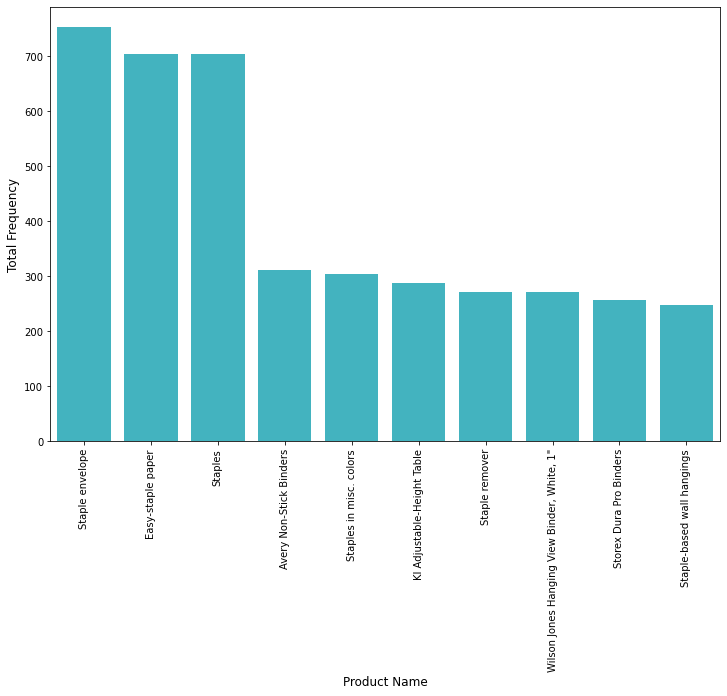

In [23]:
# finding top 10 products with high number of frequency

Top_10_pro = mba_titan_sales['Product Name'].value_counts().head(10)
plt.figure(figsize=(12,8))
sns.barplot(Top_10_pro.index, Top_10_pro.values, alpha=0.9, color=color[9])
plt.ylabel('Total Frequency', fontsize=12)
plt.xlabel('Product Name', fontsize=12)
plt.xticks(rotation='vertical')
plt.show()

**From the above plot we can see that highest number of total frequency Product is 'Staple Envelope' product.**

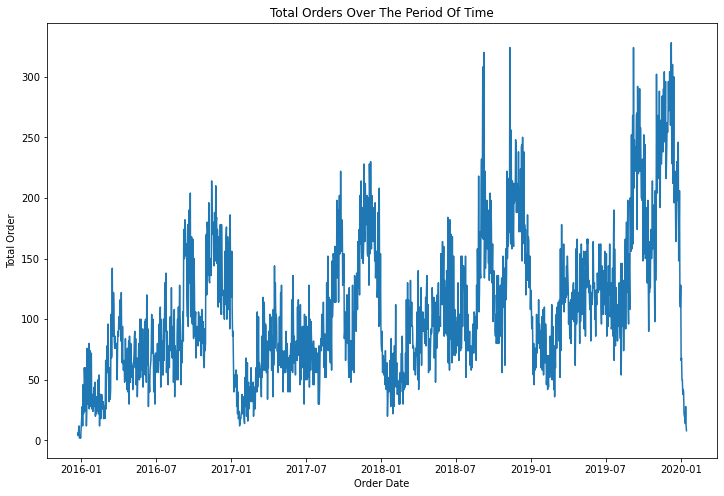

In [24]:
# Finding total number of orders frequency over the period of time

import datetime as dt

tot_daily_ord =  mba_titan_sales['Order Date'].groupby(mba_titan_sales['Order Date'].dt.date).agg('count').reset_index(name ='Total Order')

plt.figure(figsize=(12,8))
plt.plot(tot_daily_ord['Order Date'], tot_daily_ord['Total Order'])
plt.title('Total Orders Over The Period Of Time')
plt.xlabel('Order Date')
plt.ylabel('Total Order')
plt.show()

**From the above plot we can see that over the period of time total number of order placed by customer is very fluctuating. we can see the highet spike during the end of year 2018 and same for the end of year 2019. Lowest trend at starting of the year 2016 and end of year 2019.**

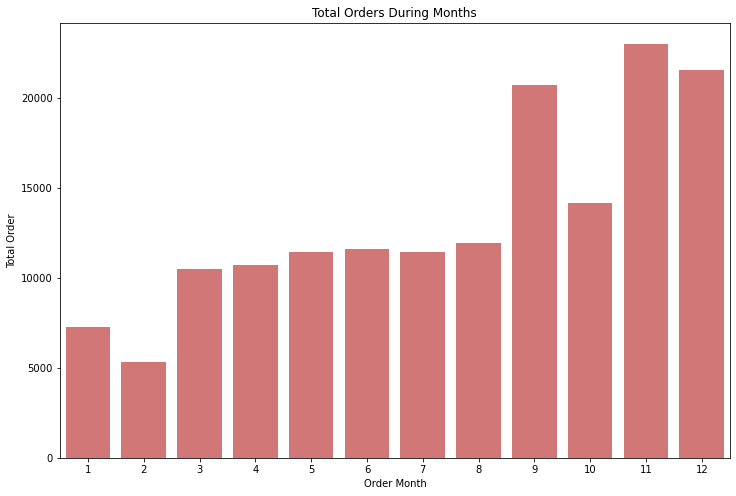

In [25]:
# Finding total number of orders Monthly

tot_month_ord =  mba_titan_sales['Order Date'].groupby(mba_titan_sales['Order Date'].dt.month).agg('count').reset_index(name ='Total Order')


plt.figure(figsize=(12,8))
sns.barplot(tot_month_ord['Order Date'], tot_month_ord['Total Order'],alpha=0.7, color=color[3])
plt.title('Total Orders During Months')
plt.xlabel('Order Month')
plt.ylabel('Total Order')
plt.show()

**From the above plot we can see that over the four years total number of orders for each month is different.But their are patterns in data like from month 5(may) to month 8(aug) total number of orders are nearly same.Highest number of orders are placed during the month of novemer and second highest is in month of december.Lowest number of orders placed is in month of february.**

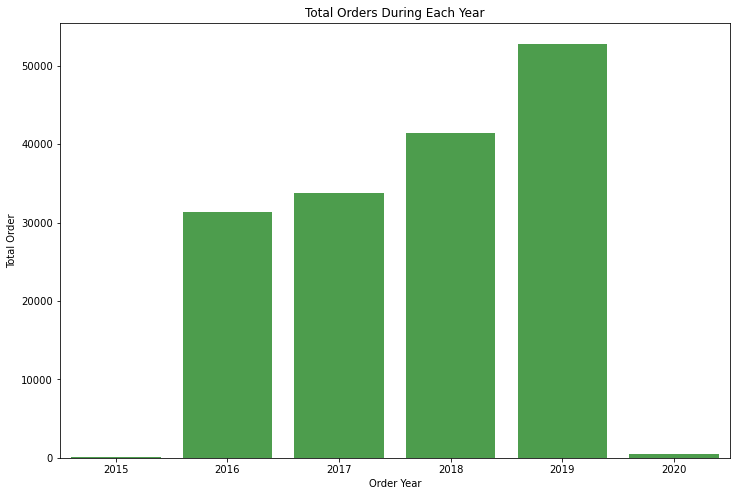

In [26]:
# Finding total number of orders Yearly

tot_year_ord =  mba_titan_sales['Order Date'].groupby(mba_titan_sales['Order Date'].dt.year).agg('count').reset_index(name ='Total Order')


plt.figure(figsize=(12,8))
sns.barplot(tot_year_ord['Order Date'], tot_year_ord['Total Order'],alpha=0.9, color=color[2])
plt.title('Total Orders During Each Year')
plt.xlabel('Order Year')
plt.ylabel('Total Order')
plt.show()

**From the above bar plot we can see over the four years that highset number of order placed is during year 2019 and lowest number of orders is placed in year 2015.Apart from that we can see that from year 2016 to year 2019 total number of orders were increasing each year.**

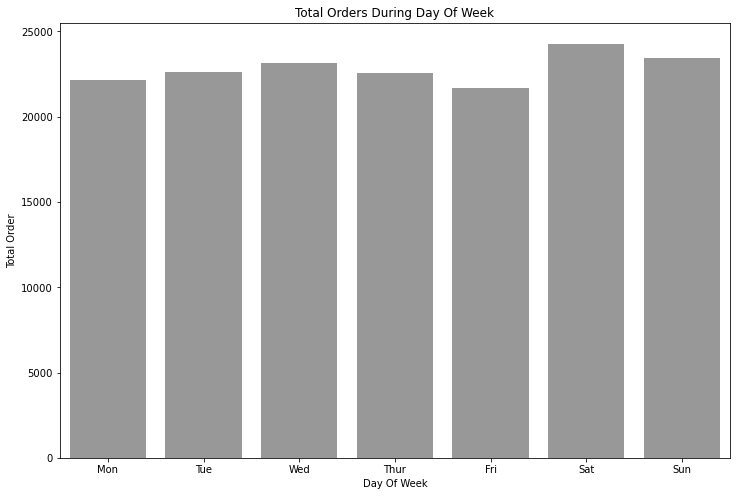

In [27]:
# Finding total number of orders weekly

tot_week_day_ord =  mba_titan_sales['Order Date'].groupby(mba_titan_sales['Order Date'].dt.weekday).agg('count').reset_index(name ='Total Order')

week = ['Mon','Tue','Wed','Thur','Fri','Sat','Sun']

plt.figure(figsize=(12,8))
sns.barplot(week, tot_week_day_ord['Total Order'],alpha=0.8, color=color[7])
plt.title('Total Orders During Day Of Week')
plt.xlabel('Day Of Week')
plt.ylabel('Total Order')
plt.show()

**From the above plot we can see that over the four years number of orders during each day of week is nearly same but highest number of orders is placed on Saturday.**

<p style="font-size:25px;">Converting Data</p>

For doing market basket analysis we need to transform our data by applying **one-hot encode** on it. Reason for doing it is because orders can have more than one number of products and in our data the two different product from same order is on different rows. So, for creating basket of products we need to consolidate all products of same order into one row or into one baket. It will also show the count of each product in that particular order so that we get to know in how much quantity that product was placed. 

In [28]:
# Converting columns for market basket analysis

basket_all = (mba_titan_sales.groupby(['Order ID', 'Product Name'])['Quantity'].sum().unstack().reset_index().fillna(0).set_index('Order ID'))

basket_all.head(5)

Product Name  "While you Were Out" Message Book, One Form per Page  #10 Gummed Flap White Envelopes, 100/Box  #10 Self-Seal White Envelopes  #10 White Business Envelopes,4 1/8 x 9 1/2  #10- 4 1/8" x 9 1/2" Recycled Envelopes  #10- 4 1/8" x 9 1/2" Security-Tint Envelopes  #10-4 1/8" x 9 1/2" Premium Diagonal Seam Envelopes  #6 3/4 Gummed Flap White Envelopes  1.7 Cubic Foot Compact "Cube" Office Refrigerators  \
Order ID                                                                                                                                                                                                                                                                                                                                                                                                                      
1                                                           0.0                                          0.0                            0.0                                         0.0                                      0.0                                           0.0                                                0.0                                   0.0                                                0.0    
2                                                           0.0                                          0.0                            0.0                                         0.0                                      0.0                                           0.0                                                0.0                                   0.0                                                0.0    
3                                                           0.0                                          0.0                            0.0                                         0.0                                      0.0                                           0.0                                                0.0                                   0.0                                                0.0    
4                                                           0.0                                          0.0                            0.0                                         0.0                                      0.0                                           0.0                                                0.0                                   0.0                                                0.0    
5                                                           0.0                                          0.0                            0.0                                         0.0                                      0.0                                           0.0                                                0.0                                   0.0                                                0.0    

Product Name  1/4 Fold Party Design Invitations & White Envelopes, 24 8-1/2" X 11" Cards, 25 Env./Pack  12 Colored Short Pencils  12-1/2 Diameter Round Wall Clock  14-7/8 x 11 Blue Bar Computer Printout Paper  2300 Heavy-Duty Transfer File Systems by Perma  24 Capacity Maxi Data Binder Racks, Pearl  24-Hour Round Wall Clock  3-ring staple pack  3.6 Cubic Foot Counter Height Office Refrigerator  36X48 HARDFLOOR CHAIRMAT  3M Hangers With Command Adhesive  3M Office Air Cleaner  \
Order ID                                                                                                                                                                                                                                                                                                                                                                                                                                                                                          
1                                                           0.0                                                              0.0

**From the above output we can see their are lot of zeros in our data but we need to make sure that we convert any positive value to 1 and any value less than 0 should be set to 0.This thing will complete one-hot encoding.**

In [29]:
# Creating and Applying Fucntion for converting postive values to 1 and less than zeros to 0

def encode_units(x):
    if x <= 0:
        return 0
    if x >= 1:
        return 1

basket_sets_all = basket_all.applymap(encode_units)

In [30]:
# Applying market basket analysis on the data 

frequent_itemsets_all = fpgrowth(basket_sets_all, min_support=0.001, use_colnames=True)

In [31]:
# Creating association rules based upon applied algorithm

rules_all = association_rules(frequent_itemsets_all, metric="lift")
rules_all.head(10)

,antecedents,consequents,antecedent support,consequent support,support,confidence,lift,leverage,conviction
0,(Pierce Parts - Replacement Kit 1),(Pierce Parts - Replacement Kit 2),0.002033,0.002033,0.001017,0.500,245.928571,0.001012,1.995934
1,(Pierce Parts - Replacement Kit 2),(Pierce Parts - Replacement Kit 1),0.002033,0.002033,0.001017,0.500,245.928571,0.001012,1.995934
2,(Pierce Parts - Replacement Kit 3),(Pierce Parts - Replacement Kit 2),0.002033,0.002033,0.001017,0.500,245.928571,0.001012,1.995934
3,(Pierce Parts - Replacement Kit 2),(Pierce Parts - Replacement Kit 3),0.002033,0.002033,0.001017,0.500,245.928571,0.001012,1.995934
4,(Pierce Parts - Replacement Kit 5),(Pierce Parts - Replacement Kit 3),0.002033,0.002033,0.001017,0.500,245.928571,0.001012,1.995934
5,(Pierce Parts - Replacement Kit 3),(Pierce Parts - Replacement Kit 5),0.002033,0.002033,0.001017,0.500,245.928571,0.001012,1.995934
6,(Pierce Parts - Replacement Kit 4),(Pierce Parts - Replacement Kit 3),0.002033,0.002033,0.001271,0.625,307.410714,0.001267,2.661245
7,(Pierce Parts - Replacement Kit 3),(Pierce Parts - Replacement Kit 4),0.002033,0.002033,0.001271,0.625,307.410714,0.001267,2.661245
8,(Pierce Parts - Replacement Kit 4),(Pierce Parts - Replacement Kit 5),0.002033,0.002033,0.001271,0.625,307.410714,0.001267,2.661245
9,(Pierce Parts - Replacement Kit 5),(Pierce Parts - Replacement Kit 4),0.002033,0.002033,0.001271,0.625,307.410714,0.001267,2.661245


In [32]:
# Finding total rules generated by algorithm
len(rules_all)

60

In [33]:
# filtering rules as per given criteria

pd.set_option("display.max_colwidth", -1) # To show full column value

rules_all_filter = rules_all [ (rules_all['lift'] >= 6 ) &
                   (rules_all['confidence'] >= 0.9) ]
rules_all_filter

,antecedents,consequents,antecedent support,consequent support,support,confidence,lift,leverage,conviction
12,"(Pierce Parts - Replacement Kit 5, Pierce Parts - Replacement Kit 3)",(Pierce Parts - Replacement Kit 4),0.001017,0.002033,0.001017,1.0,491.857143,0.001014,inf
28,"(Koziuk 2250, Koziuk 3000)",(Koziuk 2500),0.001144,0.003050,0.001144,1.0,327.904762,0.001140,inf
42,"(Hoses, Water Filters)",(Replacement Element),0.001271,0.003050,0.001271,1.0,327.904762,0.001267,inf
44,"(Water Filters, Replacement Element)",(Hoses),0.001271,0.003050,0.001271,1.0,327.904762,0.001267,inf
52,"(Car Light, Hoses)",(Replacement Element),0.001017,0.003050,0.001017,1.0,327.904762,0.001013,inf


In [34]:
# Finding total rules generated by algorithm after filter
len(rules_all_filter)

5

<p style="font-size:30px;">Market Basket Analysis Category Wise</p>

In [35]:
# creating a new varible for market basket analysis category wise

mba_titan_sales_cat = titan_sales[[ 'Category','Order Date','Order ID','Product Name','Product ID','Quantity']]

mba_titan_sales_cat.head()

,Category,Order Date,Order ID,Product Name,Product ID,Quantity
0,Furniture,2018-11-08,CA-2018-152156,Bush Somerset Collection Bookcase,P00402,2
1,Furniture,2018-11-11,1,Bush Somerset Collection Bookcase,P00402,120
2,Furniture,2019-05-01,CA-2019-110198,Bush Somerset Collection Bookcase,P00402,3
3,Parts,2019-05-01,CA-2019-110198,Bush Somerset Collection Bookcase,P00402,4
4,Furniture,2019-05-04,9335,Bush Somerset Collection Bookcase,P00402,240


<p style="font-size:25px;">Furniture Category</p>

In [36]:
# filtering out Furniture category data and store into variable

mba_titan_sales_cat_fur = (mba_titan_sales_cat[mba_titan_sales_cat['Category'] == "Furniture"])

mba_titan_sales_cat_fur.head()

,Category,Order Date,Order ID,Product Name,Product ID,Quantity
0,Furniture,2018-11-08,CA-2018-152156,Bush Somerset Collection Bookcase,P00402,2
1,Furniture,2018-11-11,1,Bush Somerset Collection Bookcase,P00402,120
2,Furniture,2019-05-01,CA-2019-110198,Bush Somerset Collection Bookcase,P00402,3
4,Furniture,2019-05-04,9335,Bush Somerset Collection Bookcase,P00402,240
6,Furniture,2019-08-25,CA-2019-159793,Bush Somerset Collection Bookcase,P00402,2


In [37]:
# Looking at the shape of the data
mba_titan_sales_cat_fur.shape

(16968, 6)

In [38]:
# finding Total number of Unique products with their Total frequency in data for furniture category

pd.set_option('display.max_rows',None)
pd.set_option('display.width', 500)

uni_pro_cat_fur = mba_titan_sales_cat_fur.groupby(['Product ID','Product Name']).size().reset_index(name ='Total Frequency')

print(uni_pro_cat_fur)

    Product ID                                                                                Product Name  Total Frequency
0    P00012     12-1/2 Diameter Round Wall Clock                                                            64             
1    P00016     24-Hour Round Wall Clock                                                                    48             
2    P00018     36X48 HARDFLOOR CHAIRMAT                                                                    48             
3    P00019     3M Hangers With Command Adhesive                                                            64             
4    P00022     3M Polarizing Light Filter Sleeves                                                          32             
5    P00023     3M Polarizing Task Lamp with Clamp Arm, Light Gray                                          32             
6    P00029     6" Cubicle Wall Clock, Black                                                                32             
7    P00

**From the above output we can see that their total 380 unique products in Furniture Category.**

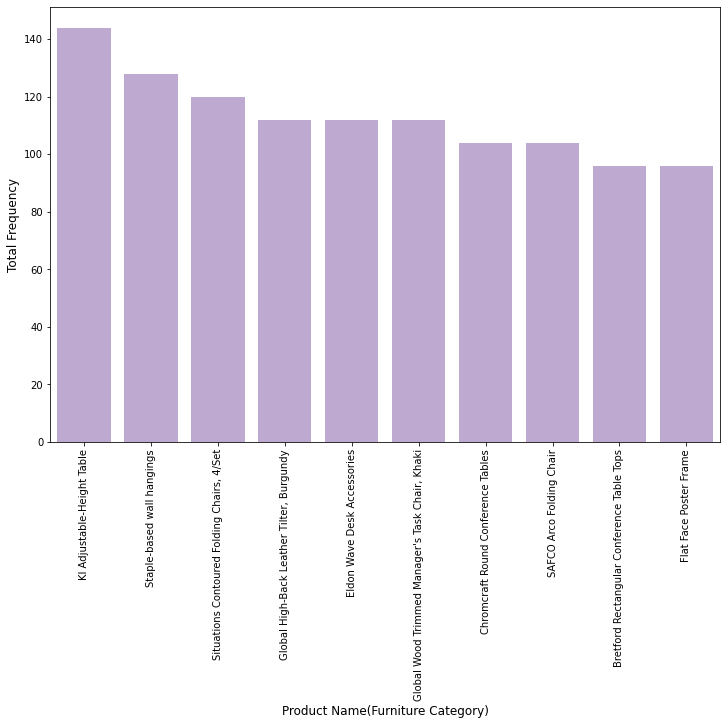

In [39]:
# finding top 10 products with high number of frequency

Top_10_pro_cat_fur = mba_titan_sales_cat_fur['Product Name'].value_counts().head(10)
plt.figure(figsize=(12,8))
sns.barplot(Top_10_pro_cat_fur.index, Top_10_pro_cat_fur.values, alpha=0.6, color=color[4])
plt.ylabel('Total Frequency', fontsize=12)
plt.xlabel('Product Name(Furniture Category)', fontsize=12)
plt.xticks(rotation='vertical')
plt.show()

**From the above plot we can see that highest number of total frequency Product for furniture category is 'KI Adjusteable-Height Table'.**

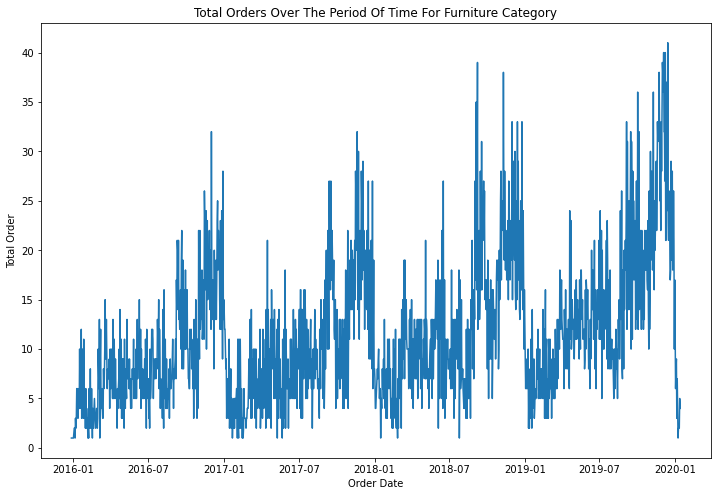

In [40]:
# Finding total number of orders frequency over the period of time

import datetime as dt

tot_daily_ord_cat_fur =  mba_titan_sales_cat_fur['Order Date'].groupby(mba_titan_sales_cat_fur['Order Date'].dt.date).agg('count').reset_index(name ='Total Order')

plt.figure(figsize=(12,8))
plt.plot(tot_daily_ord_cat_fur['Order Date'], tot_daily_ord_cat_fur['Total Order'])
plt.title('Total Orders Over The Period Of Time For Furniture Category')
plt.xlabel('Order Date')
plt.ylabel('Total Order')
plt.show()

**From the above plot we can see that over the four years daily orders for furniture category is following similar pattern every year. Every year in the starting spike of line goes down where in the end it spikes up and agian goes down before starting of new year.**

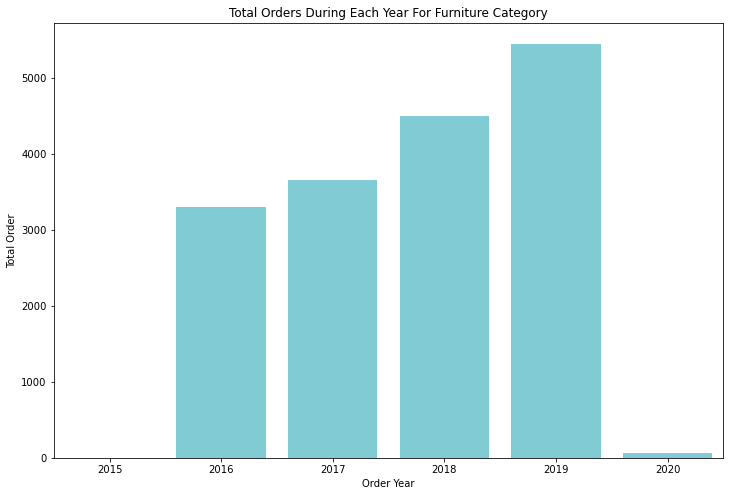

In [41]:
# Finding total number of orders Yearly for furniture category

tot_year_ord_cat_fur =  mba_titan_sales_cat_fur['Order Date'].groupby(mba_titan_sales_cat_fur['Order Date'].dt.year).agg('count').reset_index(name ='Total Order')


plt.figure(figsize=(12,8))
sns.barplot(tot_year_ord_cat_fur['Order Date'], tot_year_ord_cat_fur['Total Order'],alpha=0.6, color=color[9])
plt.title('Total Orders During Each Year For Furniture Category')
plt.xlabel('Order Year')
plt.ylabel('Total Order')
plt.show()

**From the above bar plot we can see that it has similar trend same we had in the case of over all data that highest number of order is placed in year 2019 and lowest in year 2015. From year 2016 to year 2019 it is increasing at the same rate.**

In [42]:
# Converting columns for market basket analysis for furniture category

basket_cat_fur = (mba_titan_sales_cat_fur.groupby(['Order ID', 'Product Name'])['Quantity'].sum().unstack().reset_index().fillna(0).set_index('Order ID'))

basket_cat_fur.head()

Product Name,12-1/2 Diameter Round Wall Clock,24-Hour Round Wall Clock,36X48 HARDFLOOR CHAIRMAT,3M Hangers With Command Adhesive,3M Polarizing Light Filter Sleeves,"3M Polarizing Task Lamp with Clamp Arm, Light Gray","6"" Cubicle Wall Clock, Black",9-3/4 Diameter Round Wall Clock,Acrylic Self-Standing Desk Frames,"Advantus Employee of the Month Certificate Frame, 11 x 13-1/2",Advantus Panel Wall Acrylic Frame,Advantus Panel Wall Certificate Holder - 8.5x11,Aluminum Document Frame,Anderson Hickey Conga Table Tops & Accessories,Artistic Insta-Plaque,"Atlantic Metals Mobile 2-Shelf Bookcases, Custom Colors","Atlantic Metals Mobile 3-Shelf Bookcases, Custom Colors","Atlantic Metals Mobile 4-Shelf Bookcases, Custom Colors","Atlantic Metals Mobile 5-Shelf Bookcases, Custom Colors",BPI Conference Tables,Balt Solid Wood Rectangular Table,Balt Solid Wood Round Tables,Balt Split Level Computer Training Table,"Barricks 18"" x 48"" Non-Folding Utility Table with Bottom Storage Shelf","Barricks Non-Folding Utility Table with Steel Legs, Laminate Tops",Bestar Classic Bookcase,Bevis 36 x 72 Conference Tables,Bevis 44 x 96 Conference Tables,Bevis Boat-Shaped Conference Table,"Bevis Oval Conference Table, Walnut",Bevis Rectangular Conference Tables,"Bevis Round Bullnose 29"" High Table Top",Bevis Round Conference Room Tables and Bases,Bevis Round Conference Table Top & Single Column Base,"Bevis Round Conference Table Top, X-Base",Bevis Steel Folding Chairs,"Bevis Traditional Conference Table Top, Plinth Base",BoxOffice By Design Rectangular and Half-Moon Meeting Room Tables,Brennan Barrister Bookcases,"Brennan Camden County Barrister Bookcase, Planked Cherry Finish","Brennan Camden County Collection Libraries, Planked Cherry Finish",Brennan Camden County Collection Library,Brennan Cornerstone Collection Library,"Brennan Facets Collection Library, Sky Alder Finish","Brennan Forest Hills Library with Doors, Woodland Oak Finish","Brennan Forest Hills Library, Woodland Oak Finish",Brennan Inglewood Library Bookcases,"Brennan Mission Library with Doors, Fruitwood Finish",Bretford CR4500 Series Slim Rectangular Table,Bretford CR8500 Series Meeting Room Furniture,Bretford Rectangular Conference Table Tops,Bretford “Just In Time” Height-Adjustable Multi-Task Work Tables,Bush Advantage Collection Racetrack Conference Table,Bush Advantage Collection Round Conference Table,"Bush Andora Bookcase, Maple/Graphite Gray Finish","Bush Andora Conference Table, Maple/Graphite Gray Finish","Bush Birmingham Collection Bookcase, Dark Cherry","Bush Cubix Collection Bookcases, Fully Assembled","Bush Cubix Conference Tables, Fully Assembled","Bush Heritage Pine Collection 5-Shelf Bookcase, Albany Pine Finish, *Special Order",Bush Mission Pointe Library,"Bush Saratoga Collection 5-Shelf Bookcase, Hanover Cherry, *Special Order",Bush Somerset Collection Bookcase,"Bush Westfield Collection Bookcases, Dark Cherry Finish","Bush Westfield Collection Bookcases, Dark Cherry Finish, Fully Assembled","Bush Westfield Collection Bookcases, Fully Assembled","Bush Westfield Collection Bookcases, Medium Cherry Finish",C-Line Cubicle Keepers Polyproplyene Holder With Velcro Backings,"C-Line Cubicle Keepers Polyproplyene Holder w/Velcro Back, 8-1/2x11, 25/Bx","C-Line Magnetic Cubicle Keepers, Clear Polypropylene","Career Cubicle Clock, 8 1/4"", Black","Chromcraft 48"" x 96"" Racetrack Double Pedestal Table","Chromcraft Bull-Nose Wood 48"" x 96"" Rectangular Conference Tables",Chromcraft Bull-Nose Wood Oval Conference Tables & Bases,"Chromcraft Bull-Nose Wood Round Conference Table Top, Wood Base",Chromcraft Rectangular Conference Tables,Chromcraft Round Conference Tables,Coloredge Poster Frame,"Computer Room Manger, 14""",Contemporary Borderless Frame,Contemporary Wood/Metal Frame,"Contract Clock, 14"", Brown",DAX Black Cherry Wood-Tone Poster Frame,"DAX Charcoal/Nickel-Tone Document Frame, 5 x 7",DAX Clear Channel Poster Frame,"DAX Contemporary Wood Frame with Silver Metal Mat, Deskt

In [43]:
# Applying Fucntion for conveting postive values to 1 and less than zeros to 0 On Furniture Category

basket_sets_cat_fur = basket_cat_fur.applymap(encode_units)

In [44]:
# Applying market basket analysis on the furniture data

frequent_itemsets_cat_fur = fpgrowth(basket_sets_cat_fur, min_support=0.0004, use_colnames=True)

In [45]:
# Creating association rules based upon applied algorithm

rules_cat_fur = association_rules(frequent_itemsets_cat_fur, metric="lift",min_threshold=1)
rules_cat_fur.head(10)

,antecedents,consequents,antecedent support,consequent support,support,confidence,lift,leverage,conviction
0,"(Hon Deluxe Fabric Upholstered Stacking Chairs, Rounded Back)",(Bush Somerset Collection Bookcase),0.006633,0.002211,0.000484,0.072917,32.976562,0.000469,1.076267
1,(Bush Somerset Collection Bookcase),"(Hon Deluxe Fabric Upholstered Stacking Chairs, Rounded Back)",0.002211,0.006633,0.000484,0.218750,32.976562,0.000469,1.271509
2,"(Master Caster Door Stop, Brown)",(Bretford CR4500 Series Slim Rectangular Table),0.004975,0.004422,0.000484,0.097222,21.984375,0.000462,1.102794
3,(Bretford CR4500 Series Slim Rectangular Table),"(Master Caster Door Stop, Brown)",0.004422,0.004975,0.000484,0.109375,21.984375,0.000462,1.117221
4,"(Eldon Expressions Wood and Plastic Desk Accessories, Cherry Wood)",(Chromcraft Rectangular Conference Tables),0.002764,0.004975,0.000484,0.175000,35.175000,0.000470,1.206091
5,(Chromcraft Rectangular Conference Tables),"(Eldon Expressions Wood and Plastic Desk Accessories, Cherry Wood)",0.004975,0.002764,0.000484,0.097222,35.175000,0.000470,1.104631
6,"(Lesro Sheffield Collection Coffee Table, End Table, Center Table, Corner Table)","(Eldon Expressions Wood and Plastic Desk Accessories, Cherry Wood)",0.004975,0.002764,0.000484,0.097222,35.175000,0.000470,1.104631
7,"(Eldon Expressions Wood and Plastic Desk Accessories, Cherry Wood)","(Lesro Sheffield Collection Coffee Table, End Table, Center Table, Corner Table)",0.002764,0.004975,0.000484,0.175000,35.175000,0.000470,1.206091
8,"(Global Deluxe Stacking Chair, Gray)","(DAX Two-Tone Rosewood/Black Document Frame, Desktop, 5 x 7)",0.003870,0.004422,0.000484,0.125000,28.265625,0.000467,1.137803
9,"(DAX Two-Tone Rosewood/Black Document Frame, Desktop, 5 x 7)","(Global Deluxe Stacking Chair, Gray)",0.004422,0.003870,0.000484,0.109375,28.265625,0.000467,1.118462


In [46]:
# Finding total rules generated by algorithm
len(rules_cat_fur)

1450

In [47]:
# filtering rules as per given criteria
pd.set_option("display.max_colwidth", -1) # To show full column value

rules_cat_fur_filter = rules_cat_fur [ (rules_cat_fur['lift'] >= 6) &
                   (rules_cat_fur['confidence'] >= 0.9) ]
rules_cat_fur_filter.head()

,antecedents,consequents,antecedent support,consequent support,support,confidence,lift,leverage,conviction
12,"(Global Value Steno Chair, Gray, Global Deluxe Stacking Chair, Gray)","(DAX Two-Tone Rosewood/Black Document Frame, Desktop, 5 x 7)",0.000484,0.004422,0.000484,1.0,226.125000,0.000482,inf
13,"(Global Value Steno Chair, Gray, DAX Two-Tone Rosewood/Black Document Frame, Desktop, 5 x 7)","(Global Deluxe Stacking Chair, Gray)",0.000484,0.003870,0.000484,1.0,258.428571,0.000482,inf
14,"(Global Deluxe Stacking Chair, Gray, DAX Two-Tone Rosewood/Black Document Frame, Desktop, 5 x 7)","(Global Value Steno Chair, Gray)",0.000484,0.005528,0.000484,1.0,180.900000,0.000481,inf
24,"(Riverside Palais Royal Lawyers Bookcase, Royale Cherry Finish, DMI Eclipse Executive Suite Bookcases)",(Office Star Flex Back Scooter Chair with White Frame),0.000484,0.003870,0.000484,1.0,258.428571,0.000482,inf
25,"(Riverside Palais Royal Lawyers Bookcase, Royale Cherry Finish, Office Star Flex Back Scooter Chair with White Frame)",(DMI Eclipse Executive Suite Bookcases),0.000484,0.003317,0.000484,1.0,301.500000,0.000482,inf


In [48]:
# Finding total rules generated by algorithm after filter
len(rules_cat_fur_filter)

319

<p style="font-size:25px;">Office Supplies Category</p>

In [49]:
# filtering out Office Supplies category data and store into variable

mba_titan_sales_cat_off = (mba_titan_sales_cat[mba_titan_sales_cat['Category'] == "Office Supplies"])

mba_titan_sales_cat_off.head()

,Category,Order Date,Order ID,Product Name,Product ID,Quantity
232,Office Supplies,2019-01-26,CA-2019-164098,"SimpliFile Personal File, Black Granite, 15w x 6-15/16d x 11-1/4h",P01431,2
234,Office Supplies,2019-01-29,5492,"SimpliFile Personal File, Black Granite, 15w x 6-15/16d x 11-1/4h",P01431,120
236,Office Supplies,2019-12-09,US-2019-118038,"SimpliFile Personal File, Black Granite, 15w x 6-15/16d x 11-1/4h",P01431,3
237,Office Supplies,2019-12-12,78,"SimpliFile Personal File, Black Granite, 15w x 6-15/16d x 11-1/4h",P01431,120
238,Office Supplies,2019-09-17,CA-2019-126928,"SimpliFile Personal File, Black Granite, 15w x 6-15/16d x 11-1/4h",P01431,3


In [50]:
# Looking at the shape of the data
mba_titan_sales_cat_off.shape

(48200, 6)

In [51]:
# finding Total number of Unique products with their Total frequency in data for Office Supplies category

pd.set_option('display.max_rows',None)
pd.set_option('display.width', 500)

uni_pro_cat_off = mba_titan_sales_cat_off.groupby(['Product ID','Product Name']).size().reset_index(name ='Total Frequency')

print(uni_pro_cat_off)

     Product ID                                                                                        Product Name  Total Frequency
0     P00001     "While you Were Out" Message Book, One Form per Page                                                24             
1     P00002     #10- 4 1/8" x 9 1/2" Recycled Envelopes                                                             80             
2     P00003     #10- 4 1/8" x 9 1/2" Security-Tint Envelopes                                                        64             
3     P00004     #10 Gummed Flap White Envelopes, 100/Box                                                            32             
4     P00005     #10 Self-Seal White Envelopes                                                                       32             
5     P00006     #10 White Business Envelopes,4 1/8 x 9 1/2                                                          56             
6     P00007     #10-4 1/8" x 9 1/2" Premium Diagonal Seam Envelopes 

**From the above output we can see that their total 1058 unique products in Office Supplies Category.**

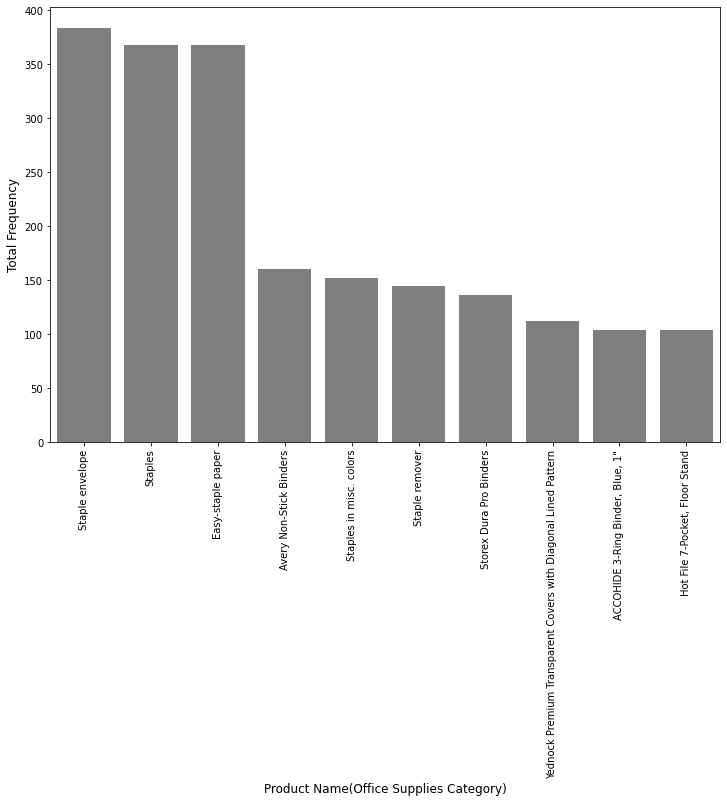

In [52]:
# finding top 10 products with high number of frequency

Top_10_pro_cat_off = mba_titan_sales_cat_off['Product Name'].value_counts().head(10)
plt.figure(figsize=(12,8))
sns.barplot(Top_10_pro_cat_off.index, Top_10_pro_cat_off.values, alpha=1.0, color=color[7])
plt.ylabel('Total Frequency', fontsize=12)
plt.xlabel('Product Name(Office Supplies Category)', fontsize=12)
plt.xticks(rotation='vertical')
plt.show()

**From the above plot we can see that highest number of total frequency Product for Office Supplies category is 'Staple Envelope'.**

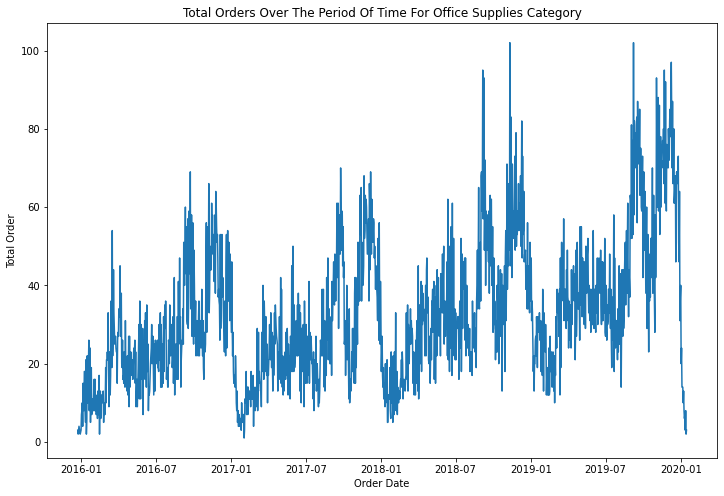

In [53]:
# Finding total number of orders frequency over the period of time

import datetime as dt

tot_daily_ord_cat_off =  mba_titan_sales_cat_off['Order Date'].groupby(mba_titan_sales_cat_off['Order Date'].dt.date).agg('count').reset_index(name ='Total Order')

plt.figure(figsize=(12,8))
plt.plot(tot_daily_ord_cat_off['Order Date'], tot_daily_ord_cat_off['Total Order'])
plt.title('Total Orders Over The Period Of Time For Office Supplies Category')
plt.xlabel('Order Date')
plt.ylabel('Total Order')
plt.show()

**From the above plot we can see that over the four years daily orders for furniture category is following similar pattern every year. Every year in the end it goes down before starting of new year. Highest number of orders spikes can be seen in the mid of year 2018 and 2019.**

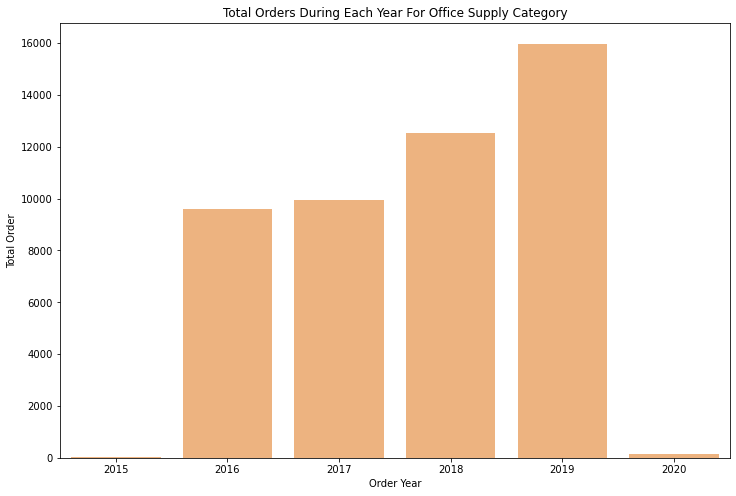

In [54]:
# Finding total number of orders Yearly for Office Supply category

tot_year_ord_cat_off =  mba_titan_sales_cat_off['Order Date'].groupby(mba_titan_sales_cat_off['Order Date'].dt.year).agg('count').reset_index(name ='Total Order')


plt.figure(figsize=(12,8))
sns.barplot(tot_year_ord_cat_off['Order Date'], tot_year_ord_cat_off['Total Order'],alpha=0.6, color=color[1])
plt.title('Total Orders During Each Year For Office Supply Category')
plt.xlabel('Order Year')
plt.ylabel('Total Order')
plt.show()

**From the above bar plot we can see that highest number of order is placed in year 2019 and lowest in year 2015. In the year 2016 and 2017 there are nearly same number of orders are placed.**

In [55]:
# Converting columns for market basket analysis for Office Supply category

basket_cat_off = (mba_titan_sales_cat_off.groupby(['Order ID', 'Product Name'])['Quantity'].sum().unstack().reset_index().fillna(0).set_index('Order ID'))

basket_cat_off.head()

Product Name,"""While you Were Out"" Message Book, One Form per Page","#10 Gummed Flap White Envelopes, 100/Box",#10 Self-Seal White Envelopes,"#10 White Business Envelopes,4 1/8 x 9 1/2","#10- 4 1/8"" x 9 1/2"" Recycled Envelopes","#10- 4 1/8"" x 9 1/2"" Security-Tint Envelopes","#10-4 1/8"" x 9 1/2"" Premium Diagonal Seam Envelopes",#6 3/4 Gummed Flap White Envelopes,"1.7 Cubic Foot Compact ""Cube"" Office Refrigerators","1/4 Fold Party Design Invitations & White Envelopes, 24 8-1/2"" X 11"" Cards, 25 Env./Pack",12 Colored Short Pencils,14-7/8 x 11 Blue Bar Computer Printout Paper,2300 Heavy-Duty Transfer File Systems by Perma,"24 Capacity Maxi Data Binder Racks, Pearl",3-ring staple pack,3.6 Cubic Foot Counter Height Office Refrigerator,3M Office Air Cleaner,3M Organizer Strips,3M Replacement Filter for Office Air Cleaner for 20' x 33' Room,4009 Highlighters,4009 Highlighters by Sanford,50 Colored Long Pencils,"ACCOHIDE 3-Ring Binder, Blue, 1""",ACCOHIDE Binder by Acco,APC 7 Outlet Network SurgeArrest Surge Protector,Acco 3-Hole Punch,Acco 6 Outlet Guardian Basic Surge Suppressor,Acco 6 Outlet Guardian Premium Plus Surge Suppressor,Acco 6 Outlet Guardian Premium Surge Suppressor,Acco 6 Outlet Guardian Standard Surge Suppressor,"Acco 7-Outlet Masterpiece Power Center, Wihtout Fax/Phone Line Protection","Acco Banker's Clasps, 5 3/4""-Long","Acco Clips to Go Binder Clips, 24 Clips in Two Sizes",Acco D-Ring Binder w/DublLock,"Acco Data Flex Cable Posts For Top & Bottom Load Binders, 6"" Capacity",Acco Economy Flexible Poly Round Ring Binder,Acco Expandable Hanging Binders,"Acco Flexible ACCOHIDE Square Ring Data Binder, Dark Blue, 11 1/2"" X 14"" 7/8""","Acco Four Pocket Poly Ring Binder with Label Holder, Smoke, 1""",Acco Glide Clips,Acco Hanging Data Binders,Acco Hot Clips Clips to Go,"Acco PRESSTEX Data Binder with Storage Hooks, Dark Blue, 14 7/8"" X 11""","Acco PRESSTEX Data Binder with Storage Hooks, Dark Blue, 9 1/2"" X 11""","Acco PRESSTEX Data Binder with Storage Hooks, Light Blue, 9 1/2"" X 11""",Acco Perma 2700 Stacking Storage Drawers,Acco Perma 3000 Stacking Storage Drawers,Acco Perma 4000 Stacking Storage Drawers,"Acco Pressboard Covers with Storage Hooks, 14 7/8"" x 11"", Dark Blue","Acco Pressboard Covers with Storage Hooks, 14 7/8"" x 11"", Executive Red","Acco Pressboard Covers with Storage Hooks, 14 7/8"" x 11"", Light Blue","Acco Pressboard Covers with Storage Hooks, 9 1/2"" x 11"", Executive Red","Acco Recycled 2"" Capacity Laser Printer Hanging Data Binders",Acco Side-Punched Conventional Columnar Pads,"Acco Six-Outlet Power Strip, 4' Cord Length",Acco Smartsocket Color-Coded Six-Outlet AC Adapter Model Surge Protectors,"Acco Smartsocket Table Surge Protector, 6 Color-Coded Adapter Outlets",Acco Suede Grain Vinyl Round Ring Binder,Acco Translucent Poly Ring Binders,Accohide Poly Flexible Ring Binders,"Acme 10"" Easy Grip Assistive Scissors",Acme Box Cutter Scissors,"Acme Design Line 8"" Stainless Steel Bent Scissors w/Champagne Handles, 3-1/8"" Cut",Acme Design Stainless Steel Bent Scissors,Acme Elite Stainless Steel Scissors,Acme Forged Steel Scissors with Black Enamel Handles,Acme Galleria Hot Forged Steel Scissors with Colored Handles,"Acme Hot Forged Carbon Steel Scissors with Nickel-Plated Handles, 3 7/8"" Cut, 8""L",Acme Kleen Earth Office Shears,Acme Kleencut Forged Steel Scissors,Acme Office Executive Series Stainless Steel Trimmers,Acme Preferred Stainless Steel Scissors,Acme Rosewood Handle Letter Opener,Acme Serrated Blade Letter Opener,Acme Softgrip Scissors,Acme Stainless Steel Office Snips,Acme Tagit Stainless Steel Antibacterial Scissors,Acme Titanium Bonded Scissors,Acme Value Line Scissors,"Adams ""While You Were Out"" Message Pads","Adams Phone Message Book, 200 Message Capacity, 8 1/16” x 11”","Adams Phone Message Book, Professional, 400 Message Capacity, 5 3/6” x 11”","Adams Telephone Message Book W/Dividers/Space For Phone Numbers, 5 1/4""X8 1/2"", 200/Messages","Adams Telephone Messag

In [56]:
# Applying Fucntion for conveting postive values to 1 and less than zeros to 0 On Office Supply Category

basket_sets_cat_off = basket_cat_off.applymap(encode_units)

In [57]:
# Applying market basket analysis on the Office Supply data

frequent_itemsets_cat_off = fpgrowth(basket_sets_cat_off, min_support=0.0002, use_colnames=True)

In [58]:
# Creating association rules based upon applied algorithm

rules_cat_off = association_rules(frequent_itemsets_cat_off, metric="lift",min_threshold=1)
rules_cat_off.head(10)

,antecedents,consequents,antecedent support,consequent support,support,confidence,lift,leverage,conviction
0,(Self-Adhesive Address Labels for Typewriters by Universal),(Yednock Imprintable Covers),0.001737,0.001985,0.000217,0.125000,62.966797,0.000214,1.140588
1,(Yednock Imprintable Covers),(Self-Adhesive Address Labels for Typewriters by Universal),0.001985,0.001737,0.000217,0.109375,62.966797,0.000214,1.120857
2,(Self-Adhesive Address Labels for Typewriters by Universal),(Rogers Deluxe File Chest),0.001737,0.001985,0.000217,0.125000,62.966797,0.000214,1.140588
3,(Rogers Deluxe File Chest),(Self-Adhesive Address Labels for Typewriters by Universal),0.001985,0.001737,0.000217,0.109375,62.966797,0.000214,1.120857
4,(Eldon Fold 'N Roll Cart System),"(Acco Pressboard Covers with Storage Hooks, 9 1/2"" x 11"", Executive Red)",0.001241,0.002233,0.000217,0.175000,78.358681,0.000214,1.209414
5,"(Acco Pressboard Covers with Storage Hooks, 9 1/2"" x 11"", Executive Red)",(Eldon Fold 'N Roll Cart System),0.002233,0.001241,0.000217,0.097222,78.358681,0.000214,1.106318
6,"(Holmes Replacement Filter for HEPA Air Cleaner, Very Large Room, HEPA Filter)",(Eldon Fold 'N Roll Cart System),0.002481,0.001241,0.000217,0.087500,70.522813,0.000214,1.094531
7,(Eldon Fold 'N Roll Cart System),"(Holmes Replacement Filter for HEPA Air Cleaner, Very Large Room, HEPA Filter)",0.001241,0.002481,0.000217,0.175000,70.522813,0.000214,1.209113
8,(Eldon Fold 'N Roll Cart System),(Wathier Bases and Tops For Staxonsteel/High-Stak Systems),0.001241,0.002481,0.000217,0.175000,70.522813,0.000214,1.209113
9,(Wathier Bases and Tops For Staxonsteel/High-Stak Systems),(Eldon Fold 'N Roll Cart System),0.002481,0.001241,0.000217,0.087500,70.522813,0.000214,1.094531


In [59]:
# Finding total rules generated by algorithm
len(rules_cat_off)

52404

In [60]:
# filtering rules as per given criteria

pd.set_option("display.max_colwidth", -1) # To show full column value

rules_cat_off_filter = rules_cat_off [ (rules_cat_off['lift'] >= 6) &
                   (rules_cat_off['confidence'] >= 0.9) ]
rules_cat_off_filter.head()

,antecedents,consequents,antecedent support,consequent support,support,confidence,lift,leverage,conviction
18,"(Holmes Replacement Filter for HEPA Air Cleaner, Very Large Room, HEPA Filter, Eldon Fold 'N Roll Cart System)","(Acco Pressboard Covers with Storage Hooks, 9 1/2"" x 11"", Executive Red)",0.000217,0.002233,0.000217,1.0,447.763889,0.000217,inf
19,"(Holmes Replacement Filter for HEPA Air Cleaner, Very Large Room, HEPA Filter, Acco Pressboard Covers with Storage Hooks, 9 1/2"" x 11"", Executive Red)",(Eldon Fold 'N Roll Cart System),0.000217,0.001241,0.000217,1.0,805.975000,0.000217,inf
20,"(Eldon Fold 'N Roll Cart System, Acco Pressboard Covers with Storage Hooks, 9 1/2"" x 11"", Executive Red)","(Holmes Replacement Filter for HEPA Air Cleaner, Very Large Room, HEPA Filter)",0.000217,0.002481,0.000217,1.0,402.987500,0.000217,inf
24,"(Holmes Replacement Filter for HEPA Air Cleaner, Very Large Room, HEPA Filter, Eldon Fold 'N Roll Cart System)",(Wathier Bases and Tops For Staxonsteel/High-Stak Systems),0.000217,0.002481,0.000217,1.0,402.987500,0.000217,inf
25,"(Holmes Replacement Filter for HEPA Air Cleaner, Very Large Room, HEPA Filter, Wathier Bases and Tops For Staxonsteel/High-Stak Systems)",(Eldon Fold 'N Roll Cart System),0.000217,0.001241,0.000217,1.0,805.975000,0.000217,inf


In [61]:
# Finding total rules generated by algorithm after filter
len(rules_cat_off_filter)

32514

<p style="font-size:25px;">Parts Category</p>

In [62]:
# filtering out Parts category data and store into variable

mba_titan_sales_cat_parts = (mba_titan_sales_cat[mba_titan_sales_cat['Category'] == "Parts"])

mba_titan_sales_cat_parts.head()

,Category,Order Date,Order ID,Product Name,Product ID,Quantity
3,Parts,2019-05-01,CA-2019-110198,Bush Somerset Collection Bookcase,P00402,4
5,Parts,2019-05-04,19329,Bush Somerset Collection Bookcase,P00402,320
7,Parts,2019-08-25,CA-2019-159793,Bush Somerset Collection Bookcase,P00402,3
9,Parts,2019-08-28,18629,Bush Somerset Collection Bookcase,P00402,180
11,Parts,2018-04-09,CA-2018-117681,Bush Somerset Collection Bookcase,P00402,6


In [63]:
# Looking at the shape of the data
mba_titan_sales_cat_parts.shape

(79944, 6)

In [64]:
# finding Total number of Unique products with their Total frequency in data for Parts category

pd.set_option('display.max_rows',None)
pd.set_option('display.width', 500)

uni_pro_cat_parts = mba_titan_sales_cat_parts.groupby(['Product ID','Product Name']).size().reset_index(name ='Total Frequency')

print(uni_pro_cat_parts)

     Product ID                                                                                                                     Product Name  Total Frequency
0     P00001     "While you Were Out" Message Book, One Form per Page                                                                             24             
1     P00002     #10- 4 1/8" x 9 1/2" Recycled Envelopes                                                                                          80             
2     P00003     #10- 4 1/8" x 9 1/2" Security-Tint Envelopes                                                                                     56             
3     P00004     #10 Gummed Flap White Envelopes, 100/Box                                                                                         24             
4     P00005     #10 Self-Seal White Envelopes                                                                                                    32             
5     P00006     #10 White B

**From the above output we can see that their total 1906 unique products in Parts Category.**

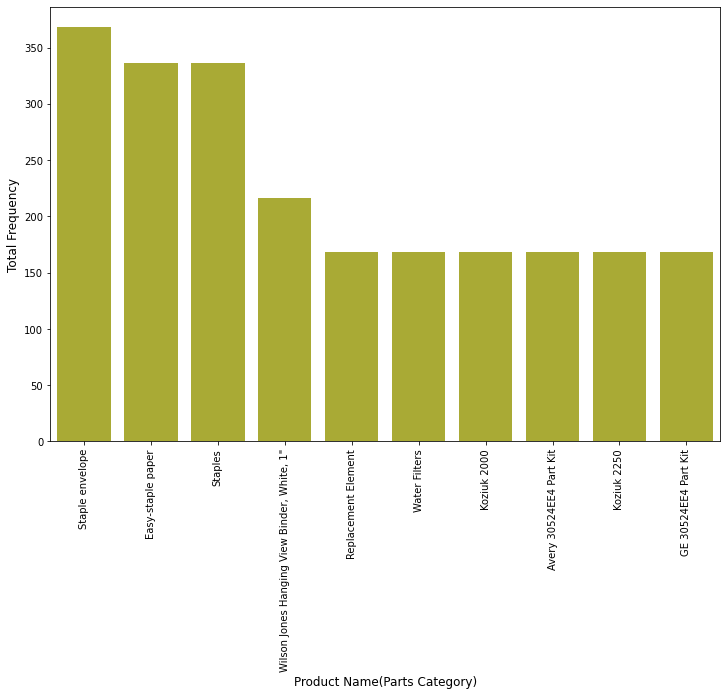

In [65]:
# finding top 10 products with high number of frequency

Top_10_pro_cat_parts = mba_titan_sales_cat_parts['Product Name'].value_counts().head(10)
plt.figure(figsize=(12,8))
sns.barplot(Top_10_pro_cat_parts.index, Top_10_pro_cat_parts.values, alpha=1.0, color=color[8])
plt.ylabel('Total Frequency', fontsize=12)
plt.xlabel('Product Name(Parts Category)', fontsize=12)
plt.xticks(rotation='vertical')
plt.show()

**From the above plot we can see that highest number of total frequency Product for Office Supplies category is 'Staple Envelope'.**

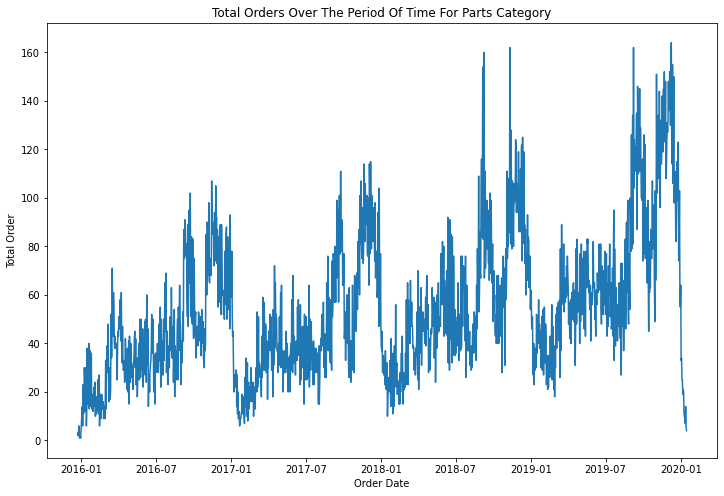

In [66]:
# Finding total number of orders frequency over the period of time

import datetime as dt

tot_daily_ord_cat_parts =  mba_titan_sales_cat_parts['Order Date'].groupby(mba_titan_sales_cat_parts['Order Date'].dt.date).agg('count').reset_index(name ='Total Order')

plt.figure(figsize=(12,8))
plt.plot(tot_daily_ord_cat_parts['Order Date'], tot_daily_ord_cat_parts['Total Order'])
plt.title('Total Orders Over The Period Of Time For Parts Category')
plt.xlabel('Order Date')
plt.ylabel('Total Order')
plt.show()

**From the above plot we can see that over the four years daily orders for Parts category is following similar pattern every year. Every year in the end it goes down before starting of new year. Highest number of orders spikes can be seen in the mid of year 2018 and 2019.**

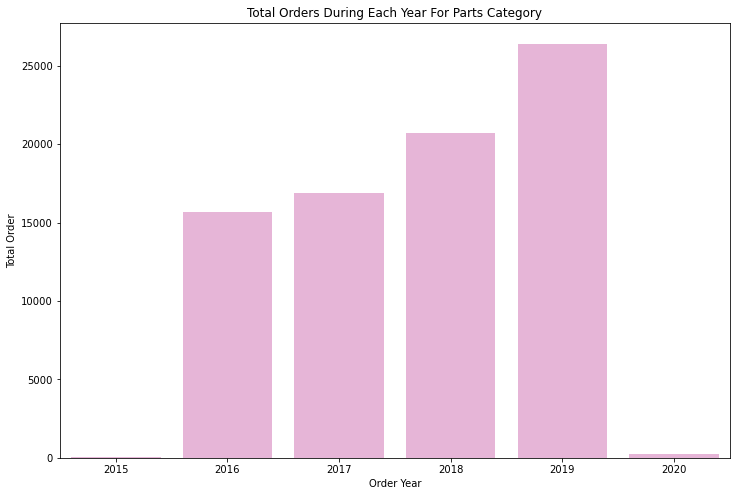

In [67]:
# Finding total number of orders Yearly for Office Supply category

tot_year_ord_cat_parts =  mba_titan_sales_cat_parts['Order Date'].groupby(mba_titan_sales_cat_parts['Order Date'].dt.year).agg('count').reset_index(name ='Total Order')


plt.figure(figsize=(12,8))
sns.barplot(tot_year_ord_cat_parts['Order Date'], tot_year_ord_cat_parts['Total Order'],alpha=0.6, color=color[6])
plt.title('Total Orders During Each Year For Parts Category')
plt.xlabel('Order Year')
plt.ylabel('Total Order')
plt.show()

**From the above bar plot we can see that highest number of order is placed in year 2019 and lowest in year 2015. In the year 2016 and 2017 there are nearly same number of orders are placed.**

In [68]:
# Converting columns for market basket analysis for Parts category

basket_cat_parts = (mba_titan_sales_cat_parts.groupby(['Order ID', 'Product Name'])['Quantity'].sum().unstack().reset_index().fillna(0).set_index('Order ID'))

basket_cat_parts.head()

Product Name  "While you Were Out" Message Book, One Form per Page  #10 Gummed Flap White Envelopes, 100/Box  #10 Self-Seal White Envelopes  #10 White Business Envelopes,4 1/8 x 9 1/2  #10- 4 1/8" x 9 1/2" Recycled Envelopes  #10- 4 1/8" x 9 1/2" Security-Tint Envelopes  #10-4 1/8" x 9 1/2" Premium Diagonal Seam Envelopes  #6 3/4 Gummed Flap White Envelopes  1.7 Cubic Foot Compact "Cube" Office Refrigerators  \
Order ID                                                                                                                                                                                                                                                                                                                                                                                                                      
9995          0.0                                                   0.0                                       0.0                            0.0                                         0.0                                      0.0                                           0.0                                                  0.0                                 0.0                                                  
9996          0.0                                                   0.0                                       0.0                            0.0                                         0.0                                      0.0                                           0.0                                                  0.0                                 0.0                                                  
9997          0.0                                                   0.0                                       0.0                            0.0                                         0.0                                      0.0                                           0.0                                                  0.0                                 0.0                                                  
9998          0.0                                                   0.0                                       0.0                            0.0                                         0.0                                      0.0                                           0.0                                                  0.0                                 0.0                                                  
9999          0.0                                                   0.0                                       0.0                            0.0                                         0.0                                      0.0                                           0.0                                                  0.0                                 0.0                                                  

Product Name  1/4 Fold Party Design Invitations & White Envelopes, 24 8-1/2" X 11" Cards, 25 Env./Pack  12 Colored Short Pencils  12-1/2 Diameter Round Wall Clock  14-7/8 x 11 Blue Bar Computer Printout Paper  2300 Heavy-Duty Transfer File Systems by Perma  24 Capacity Maxi Data Binder Racks, Pearl  24-Hour Round Wall Clock  3-ring staple pack  3.6 Cubic Foot Counter Height Office Refrigerator  36X48 HARDFLOOR CHAIRMAT  3M Hangers With Command Adhesive  3M Office Air Cleaner  \
Order ID                                                                                                                                                                                                                                                                                                                                                                                                                                                                                          
9995          0.0                                                                                       0.0                     

In [69]:
# Applying Fucntion for conveting postive values to 1 and less than zeros to 0 On Parts Category

basket_sets_cat_parts = basket_cat_parts.applymap(encode_units)

In [70]:
# Applying market basket analysis on the Parts data

frequent_itemsets_cat_parts = fpgrowth(basket_sets_cat_parts, min_support=0.001, use_colnames=True)

In [71]:
# Creating association rules based upon applied algorithm

rules_cat_parts = association_rules(frequent_itemsets_cat_parts, metric="lift",min_threshold=1)
rules_cat_parts.head(10)

,antecedents,consequents,antecedent support,consequent support,support,confidence,lift,leverage,conviction
0,(Pierce Parts - Replacement Kit 1),(Pierce Parts - Replacement Kit 2),0.002484,0.002484,0.001242,0.500,201.316964,0.001236,1.995033
1,(Pierce Parts - Replacement Kit 2),(Pierce Parts - Replacement Kit 1),0.002484,0.002484,0.001242,0.500,201.316964,0.001236,1.995033
2,(Pierce Parts - Replacement Kit 3),(Pierce Parts - Replacement Kit 2),0.002484,0.002484,0.001242,0.500,201.316964,0.001236,1.995033
3,(Pierce Parts - Replacement Kit 2),(Pierce Parts - Replacement Kit 3),0.002484,0.002484,0.001242,0.500,201.316964,0.001236,1.995033
4,(Pierce Parts - Replacement Kit 4),(Pierce Parts - Replacement Kit 3),0.002484,0.002484,0.001552,0.625,251.646205,0.001546,2.660044
5,(Pierce Parts - Replacement Kit 3),(Pierce Parts - Replacement Kit 4),0.002484,0.002484,0.001552,0.625,251.646205,0.001546,2.660044
6,(Pierce Parts - Replacement Kit 4),(Pierce Parts - Replacement Kit 5),0.002484,0.002484,0.001552,0.625,251.646205,0.001546,2.660044
7,(Pierce Parts - Replacement Kit 5),(Pierce Parts - Replacement Kit 4),0.002484,0.002484,0.001552,0.625,251.646205,0.001546,2.660044
8,(Pierce Parts - Replacement Kit 5),(Pierce Parts - Replacement Kit 3),0.002484,0.002484,0.001242,0.500,201.316964,0.001236,1.995033
9,(Pierce Parts - Replacement Kit 3),(Pierce Parts - Replacement Kit 5),0.002484,0.002484,0.001242,0.500,201.316964,0.001236,1.995033


In [72]:
# Finding total rules generated by algorithm
len(rules_cat_parts)

78

In [73]:
# filtering rules as per given criteria
pd.set_option("display.max_colwidth", -1) # To show full column value

rules_cat_parts_filter = rules_cat_parts [ (rules_cat_parts['lift'] >= 6) &
                   (rules_cat_parts['confidence'] >= 0.6) ]
rules_cat_parts_filter.head()

,antecedents,consequents,antecedent support,consequent support,support,confidence,lift,leverage,conviction
4,(Pierce Parts - Replacement Kit 4),(Pierce Parts - Replacement Kit 3),0.002484,0.002484,0.001552,0.625,251.646205,0.001546,2.660044
5,(Pierce Parts - Replacement Kit 3),(Pierce Parts - Replacement Kit 4),0.002484,0.002484,0.001552,0.625,251.646205,0.001546,2.660044
6,(Pierce Parts - Replacement Kit 4),(Pierce Parts - Replacement Kit 5),0.002484,0.002484,0.001552,0.625,251.646205,0.001546,2.660044
7,(Pierce Parts - Replacement Kit 5),(Pierce Parts - Replacement Kit 4),0.002484,0.002484,0.001552,0.625,251.646205,0.001546,2.660044
12,"(Pierce Parts - Replacement Kit 4, Pierce Parts - Replacement Kit 3)",(Pierce Parts - Replacement Kit 5),0.001552,0.002484,0.001242,0.800,322.107143,0.001238,4.987582


In [74]:
# Finding total rules generated by algorithm after filter
len(rules_cat_parts_filter)

19

<p style="font-size:25px;">Technology Category</p>

In [75]:
# filtering out Technology category data and store into variable

mba_titan_sales_cat_tech = (mba_titan_sales_cat[mba_titan_sales_cat['Category'] == "Technology"])

mba_titan_sales_cat_tech.head()

,Category,Order Date,Order ID,Product Name,Product ID,Quantity
1128,Technology,2019-12-11,CA-2019-168389,Motorola HK250 Universal Bluetooth Headset,P01092,4
1130,Technology,2019-12-14,7346,Motorola HK250 Universal Bluetooth Headset,P01092,160
1132,Technology,2018-05-21,US-2018-139486,Motorola HK250 Universal Bluetooth Headset,P01092,3
1133,Technology,2018-05-24,524,Motorola HK250 Universal Bluetooth Headset,P01092,240
1134,Technology,2019-10-07,CA-2019-108574,Motorola HK250 Universal Bluetooth Headset,P01092,7


In [76]:
# Looking at the shape of the data
mba_titan_sales_cat_tech.shape

(14776, 6)

In [77]:
# finding Total number of Unique products with their Total frequency in data for Technology category

pd.set_option('display.max_rows',None)
pd.set_option('display.width', 500)

uni_pro_cat_tech = mba_titan_sales_cat_tech.groupby(['Product ID','Product Name']).size().reset_index(name ='Total Frequency')

print(uni_pro_cat_tech)

    Product ID                                                                                                                     Product Name  Total Frequency
0    P00031     Aastra 57i VoIP phone                                                                                                            56             
1    P00032     Aastra 6757i CT Wireless VoIP phone                                                                                              48             
2    P00100     Adtran 1202752G1                                                                                                                 40             
3    P00123     AmazonBasics 3-Button USB Wired Mouse                                                                                            40             
4    P00134     Anker 24W Portable Micro USB Car Charger                                                                                         16             
5    P00135     Anker 36W 4-Port U

**From the above output we can see that their total 412 unique products in Technology Category.**

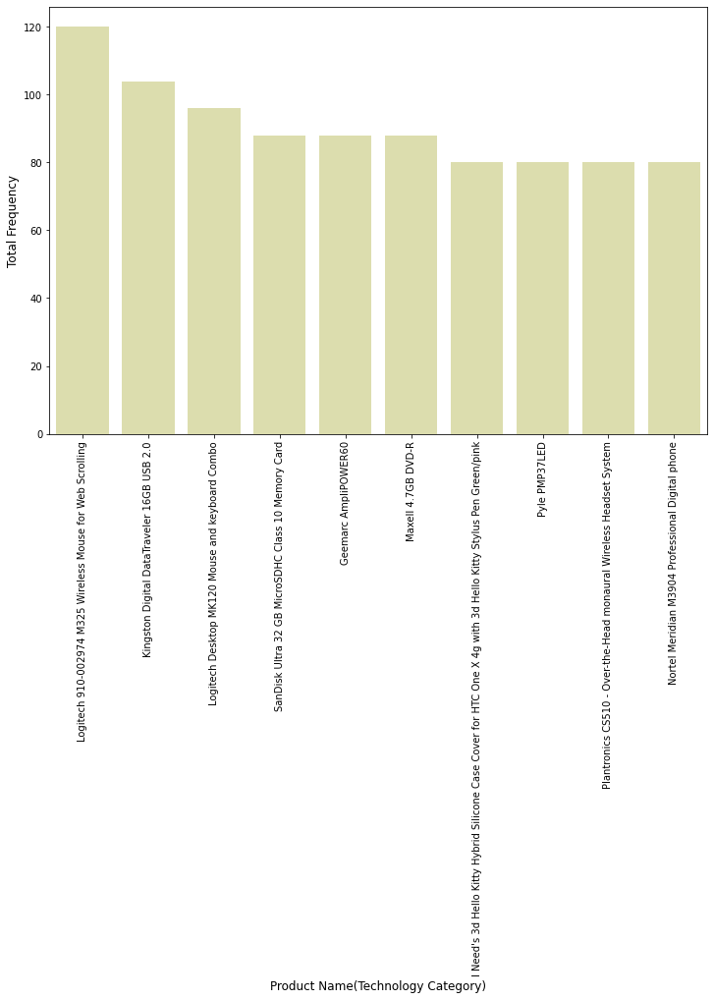

In [78]:
# finding top 10 products with high number of frequency

Top_10_pro_cat_tech = mba_titan_sales_cat_tech['Product Name'].value_counts().head(10)
plt.figure(figsize=(12,8))
sns.barplot(Top_10_pro_cat_tech.index, Top_10_pro_cat_tech.values, alpha=0.4, color=color[8])
plt.ylabel('Total Frequency', fontsize=12)
plt.xlabel('Product Name(Technology Category)', fontsize=12)
plt.xticks(rotation='vertical')
plt.show()

**From the above plot we can see that highest number of total frequency Product for Office Supplies category is 'Logitech 910-002974 M325 Wirelsess Mouse For Web Scrolling'.**

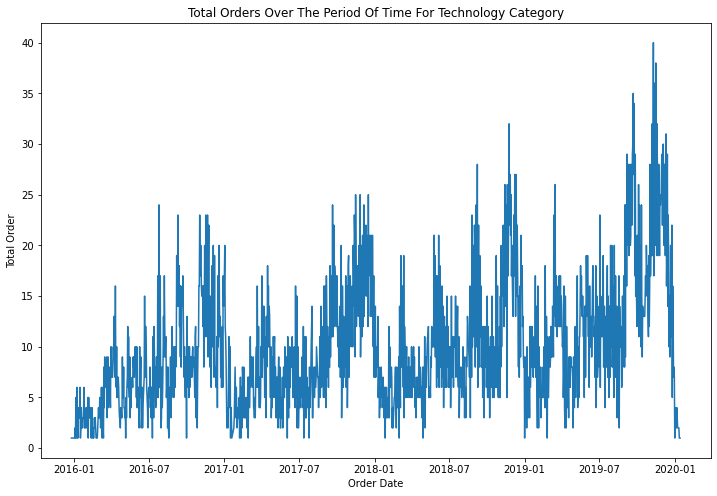

In [79]:
# Finding total number of orders frequency over the period of time

import datetime as dt

tot_daily_ord_cat_tech =  mba_titan_sales_cat_tech['Order Date'].groupby(mba_titan_sales_cat_tech['Order Date'].dt.date).agg('count').reset_index(name ='Total Order')

plt.figure(figsize=(12,8))
plt.plot(tot_daily_ord_cat_tech['Order Date'], tot_daily_ord_cat_tech['Total Order'])
plt.title('Total Orders Over The Period Of Time For Technology Category')
plt.xlabel('Order Date')
plt.ylabel('Total Order')
plt.show()

**From the above plot we can see that over the four years daily orders for Techonolgy category is very fluctuating. Highest spike for number of orders is seen in the mid of year 2019..**

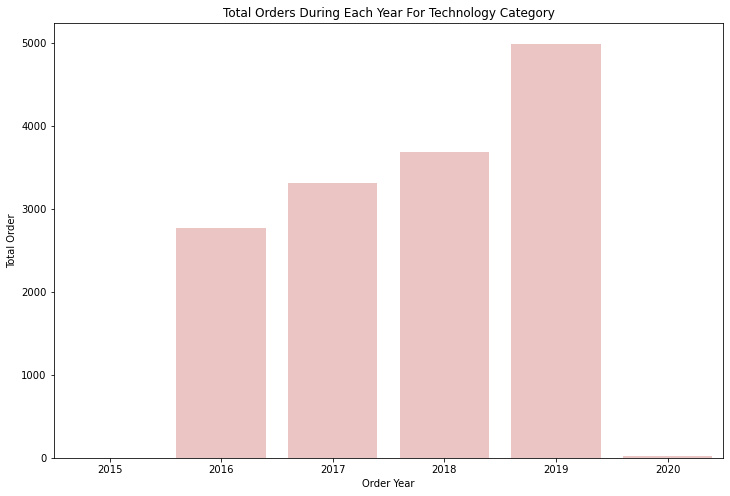

In [80]:
# Finding total number of orders Yearly for Technology category

tot_year_ord_cat_tech =  mba_titan_sales_cat_tech['Order Date'].groupby(mba_titan_sales_cat_tech['Order Date'].dt.year).agg('count').reset_index(name ='Total Order')


plt.figure(figsize=(12,8))
sns.barplot(tot_year_ord_cat_tech['Order Date'], tot_year_ord_cat_tech['Total Order'],alpha=0.3, color=color[3])
plt.title('Total Orders During Each Year For Technology Category')
plt.xlabel('Order Year')
plt.ylabel('Total Order')
plt.show()

**From the above bar plot we can see that highest number of order is placed in year 2019 and lowest in year 2015.From the year 2016 to 2018 number of orders is increasing at same rate but after 2018 number of orders jumped drastically.**

In [81]:
# Converting columns for market basket analysis for Technology category

basket_cat_tech = (mba_titan_sales_cat_tech.groupby(['Order ID', 'Product Name'])['Quantity'].sum().unstack().reset_index().fillna(0).set_index('Order ID'))

basket_cat_tech.head()

Product Name,ARKON Windshield Dashboard Air Vent Car Mount Holder,AT&T 1070 Corded Phone,AT&T 1080 Corded phone,AT&T 1080 Phone,AT&T 17929 Lendline Telephone,AT&T 841000 Phone,AT&T CL2909,AT&T CL82213,AT&T CL83451 4-Handset Telephone,AT&T EL51110 DECT,AT&T SB67148 SynJ,AT&T TR1909W,Aastra 57i VoIP phone,Aastra 6757i CT Wireless VoIP phone,Adtran 1202752G1,AmazonBasics 3-Button USB Wired Mouse,Anker 24W Portable Micro USB Car Charger,Anker 36W 4-Port USB Wall Charger Travel Power Adapter for iPhone 5s 5c 5,Anker Astro 15000mAh USB Portable Charger,Anker Astro Mini 3000mAh Ultra-Compact Portable Charger,Anker Ultra-Slim Mini Bluetooth 3.0 Wireless Keyboard,Anker Ultrathin Bluetooth Wireless Keyboard Aluminum Cover with Stand,Apple EarPods with Remote and Mic,Apple iPhone 5,Apple iPhone 5C,Apple iPhone 5S,"Ativa D5772 2-Line 5.8GHz Digital Expandable Corded/Cordless Phone System with Answering & Caller ID/Call Waiting, Black/Silver",Ativa MDM8000 8-Sheet Micro-Cut Shredder,Ativa V4110MDD Micro-Cut Shredder,Avaya 4621SW VoIP phone,Avaya 5410 Digital phone,Avaya 5420 Digital phone,Avaya IP Phone 1140E VoIP phone,Bady BDG101FRU Card Printer,Belkin F8E887 USB Wired Ergonomic Keyboard,Belkin Grip Candy Sheer Case / Cover for iPhone 5 and 5S,Belkin QODE FastFit Bluetooth Keyboard,"Belkin SportFit Armband For iPhone 5s/5c, Fuchsia",Belkin Standard 104 key USB Keyboard,Belkin iPhone and iPad Lightning Cable,BlackBerry Q10,Blue Parrot B250XT Professional Grade Wireless Bluetooth Headset with,"BlueLounge Milo Smartphone Stand, White/Metallic",Bose SoundLink Bluetooth Speaker,Brother DCP1000 Digital 3 in 1 Multifunction Machine,"Brother MFC-9340CDW LED All-In-One Printer, Copier Scanner",Case Logic 2.4GHz Wireless Keyboard,Cherry 142-key Programmable Keyboard,Cisco 8961 IP Phone Charcoal,Cisco 8x8 Inc. 6753i IP Business Phone System,Cisco 9971 IP Video Phone Charcoal,Cisco CP-7937G Unified IP Conference Station Phone,Cisco Desktop Collaboration Experience DX650 IP Video Phone,Cisco IP Phone 7961G-GE VoIP phone,Cisco IP Phone 7961G VoIP phone - Dark gray,Cisco SPA 501G IP Phone,Cisco SPA 502G IP Phone,Cisco SPA112 2 Port Phone Adapter,Cisco SPA301,Cisco SPA508G,Cisco SPA525G2 5-Line IP Phone,Cisco SPA525G2 IP Phone - Wireless,Cisco Small Business SPA 502G VoIP phone,Cisco TelePresence System EX90 Videoconferencing Unit,Cisco Unified IP Phone 7945G VoIP phone,Clarity 53712,Classic Ivory Antique Telephone ZL1810,ClearOne CHATAttach 160 - speaker phone,ClearOne Communications CHAT 70 OC Speaker Phone,ClearSounds CSC500 Amplified Spirit Phone Corded phone,Clearsounds A400,Cubify CubeX 3D Printer Double Head Print,Cubify CubeX 3D Printer Triple Head Print,Cush Cases Heavy Duty Rugged Cover Case for Samsung Galaxy S5 - Purple,Cyber Acoustics AC-202b Speech Recognition Stereo Headset,DYMO CardScan Personal V9 Business Card Scanner,Dell Slim USB Multimedia Keyboard,Dexim XPower Skin Super-Thin Power Case for iPhone 5 - Black,Digium D40 VoIP phone,Enermax Acrylux Wireless Keyboard,Enermax Aurora Lite Keyboard,Enermax Briskie RF Wireless Keyboard and Mouse Combo,Epson Perfection V600 Photo Scanner,Epson TM-T88V Direct Thermal Printer - Monochrome - Desktop,"Epson WorkForce WF-2530 All-in-One Printer, Copier Scanner",First Data FD10 PIN Pad,First Data TMFD35 PIN Pad,GE 2-Jack Phone Line Splitter,GE 30522EE2,GE 30524EE4,GE DSL Phone Line Filter,Gear Head AU3700S Headset,Geemarc AmpliPOWER60,Google Nexus 5,Grandstream GXP1160 VoIP phone,Grandstream GXP2100 Mainstream Business Phone,Griffin GC17055 Auxiliary Audio Cable,Griffin GC36547 PowerJolt SE Lightning Charger,"HP Designjet T520 Inkjet Large Format Printer - 24"" Color","HP Officejet Pro 8600 e-All-In-One Printer, Copier, Scanner, Fax",HP Standard 104 key PS/2 Keyboard,HTC One,HTC One Mini,Hewlett Packard 310 Color Digital Copier,Hewlett Packard 610 Color Digital Copier / Printer,Hewlett Packard LaserJet 3310 Copier,Hewlett-Packard 300S Scientific Calculator,Hewlett-Packard Deskjet 3050a All-in-One 

In [82]:
# Applying Fucntion for conveting postive values to 1 and less than zeros to 0 On Technology Category

basket_sets_cat_tech = basket_cat_tech.applymap(encode_units)

In [83]:
# Applying market basket analysis on the Parts data

frequent_itemsets_cat_tech = fpgrowth(basket_sets_cat_tech, min_support=0.0005, use_colnames=True)

In [84]:
# Creating association rules based upon applied algorithm

rules_cat_tech = association_rules(frequent_itemsets_cat_tech, metric="lift",min_threshold=1)
rules_cat_tech.head(10)

,antecedents,consequents,antecedent support,consequent support,support,confidence,lift,leverage,conviction
0,(Konftel 250 Conference phone - Charcoal black),(Mitel 5320 IP Phone VoIP phone),0.002528,0.002528,0.000553,0.218750,86.529297,0.000547,1.276764
1,(Mitel 5320 IP Phone VoIP phone),(Konftel 250 Conference phone - Charcoal black),0.002528,0.002528,0.000553,0.218750,86.529297,0.000547,1.276764
2,(Logitech Wireless Performance Mouse MX for PC and Mac),(Plantronics HL10 Handset Lifter),0.004424,0.001896,0.000553,0.125000,65.927083,0.000545,1.140690
3,(Plantronics HL10 Handset Lifter),(Logitech Wireless Performance Mouse MX for PC and Mac),0.001896,0.004424,0.000553,0.291667,65.927083,0.000545,1.405519
4,"(Verbatim 25 GB 6x Blu-ray Single Layer Recordable Disc, 25/Pack)",(Panasonic Kx-TS550),0.003160,0.004424,0.000553,0.175000,39.556250,0.000539,1.206759
5,(Panasonic Kx-TS550),"(Verbatim 25 GB 6x Blu-ray Single Layer Recordable Disc, 25/Pack)",0.004424,0.003160,0.000553,0.125000,39.556250,0.000539,1.139246
6,(Imation 8gb Micro Traveldrive Usb 2.0 Flash Drive),"(LF Elite 3D Dazzle Designer Hard Case Cover, Lf Stylus Pen and Wiper For Apple Iphone 5c Mini Lite)",0.005056,0.005056,0.000553,0.109375,21.632324,0.000527,1.117130
7,"(LF Elite 3D Dazzle Designer Hard Case Cover, Lf Stylus Pen and Wiper For Apple Iphone 5c Mini Lite)",(Imation 8gb Micro Traveldrive Usb 2.0 Flash Drive),0.005056,0.005056,0.000553,0.109375,21.632324,0.000527,1.117130
8,(Imation 8gb Micro Traveldrive Usb 2.0 Flash Drive),(Logitech Desktop MK120 Mouse and keyboard Combo),0.005056,0.007584,0.000553,0.109375,14.421549,0.000515,1.114291
9,(Logitech Desktop MK120 Mouse and keyboard Combo),(Imation 8gb Micro Traveldrive Usb 2.0 Flash Drive),0.007584,0.005056,0.000553,0.072917,14.421549,0.000515,1.073198


In [85]:
# Finding total rules generated by algorithm
len(rules_cat_tech)

1216

In [86]:
# filtering rules as per given criteria
pd.set_option("display.max_colwidth", -1) # To show full column value

rules_cat_tech_filter = rules_cat_tech [ (rules_cat_tech['lift'] >= 8) &
            (rules_cat_tech['confidence'] >= 0.8) ]

rules_cat_tech_filter.head()

,antecedents,consequents,antecedent support,consequent support,support,confidence,lift,leverage,conviction
20,"(SanDisk Cruzer 64 GB USB Flash Drive, Apple iPhone 5)",(Logitech LS21 Speaker System - PC Multimedia - 2.1-CH - Wired),0.000553,0.003792,0.000553,1.0,263.708333,0.000551,inf
21,"(SanDisk Cruzer 64 GB USB Flash Drive, Logitech LS21 Speaker System - PC Multimedia - 2.1-CH - Wired)",(Apple iPhone 5),0.000553,0.003792,0.000553,1.0,263.708333,0.000551,inf
22,"(Apple iPhone 5, Logitech LS21 Speaker System - PC Multimedia - 2.1-CH - Wired)",(SanDisk Cruzer 64 GB USB Flash Drive),0.000553,0.005688,0.000553,1.0,175.805556,0.000550,inf
50,"(Plantronics Cordless Phone Headset with In-line Volume - M214C, Apple iPhone 5)",(Logitech LS21 Speaker System - PC Multimedia - 2.1-CH - Wired),0.000553,0.003792,0.000553,1.0,263.708333,0.000551,inf
51,"(Plantronics Cordless Phone Headset with In-line Volume - M214C, Logitech LS21 Speaker System - PC Multimedia - 2.1-CH - Wired)",(Apple iPhone 5),0.000553,0.003792,0.000553,1.0,263.708333,0.000551,inf


In [87]:
# Finding total rules generated by algorithm after filter
len(rules_cat_tech_filter)

304

<p style="font-size:30px;">Market Basket Analysis Channel Wise</p>

In [88]:
# creating a new varible for market basket analysis Channel wise

mba_titan_sales_cha = titan_sales[[ 'Channel','Order Date','Order ID','Product Name','Product ID','Quantity']]

mba_titan_sales_cha.head()

,Channel,Order Date,Order ID,Product Name,Product ID,Quantity
0,Retail,2018-11-08,CA-2018-152156,Bush Somerset Collection Bookcase,P00402,2
1,Retail,2018-11-11,1,Bush Somerset Collection Bookcase,P00402,120
2,Retail,2019-05-01,CA-2019-110198,Bush Somerset Collection Bookcase,P00402,3
3,Retail,2019-05-01,CA-2019-110198,Bush Somerset Collection Bookcase,P00402,4
4,Retail,2019-05-04,9335,Bush Somerset Collection Bookcase,P00402,240


<p style="font-size:25px;">Retail Channel</p>

In [89]:
# filtering out Retail Channel data and store into variable

mba_titan_sales_cha_ret = (mba_titan_sales_cha[mba_titan_sales_cha['Channel'] == "Retail"])

mba_titan_sales_cha_ret.head()

,Channel,Order Date,Order ID,Product Name,Product ID,Quantity
0,Retail,2018-11-08,CA-2018-152156,Bush Somerset Collection Bookcase,P00402,2
1,Retail,2018-11-11,1,Bush Somerset Collection Bookcase,P00402,120
2,Retail,2019-05-01,CA-2019-110198,Bush Somerset Collection Bookcase,P00402,3
3,Retail,2019-05-01,CA-2019-110198,Bush Somerset Collection Bookcase,P00402,4
4,Retail,2019-05-04,9335,Bush Somerset Collection Bookcase,P00402,240


In [90]:
# Looking at the shape of the data
mba_titan_sales_cha_ret.shape

(99930, 6)

In [91]:
# finding Total number of Unique products with their Total frequency in data for Retail Channel

pd.set_option('display.max_rows',None)
pd.set_option('display.width', 500)

uni_pro_cha_ret = mba_titan_sales_cha_ret.groupby(['Product ID','Product Name']).size().reset_index(name ='Total Frequency')

print(uni_pro_cha_ret)

     Product ID                                                                                                                     Product Name  Total Frequency
0     P00001     "While you Were Out" Message Book, One Form per Page                                                                             30             
1     P00002     #10- 4 1/8" x 9 1/2" Recycled Envelopes                                                                                          100            
2     P00003     #10- 4 1/8" x 9 1/2" Security-Tint Envelopes                                                                                     75             
3     P00004     #10 Gummed Flap White Envelopes, 100/Box                                                                                         35             
4     P00005     #10 Self-Seal White Envelopes                                                                                                    40             
5     P00006     #10 White B

**From the above output we can see that their total 1919 unique products same as in overall data which means all products are  in Retail Channel.**

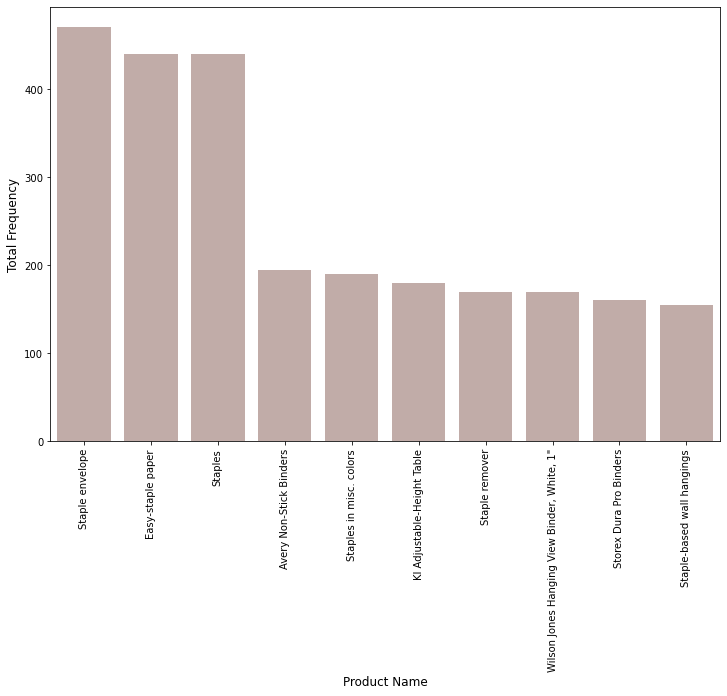

In [92]:
# finding top 10 products with high number of frequency

Top_10_pro_cha_ret = mba_titan_sales_cha_ret['Product Name'].value_counts().head(10)
plt.figure(figsize=(12,8))
sns.barplot(Top_10_pro_cha_ret.index, Top_10_pro_cha_ret.values, alpha=0.5, color=color[5])
plt.ylabel('Total Frequency', fontsize=12)
plt.xlabel('Product Name', fontsize=12)
plt.xticks(rotation='vertical')
plt.show()

**From the above plot we can see that highest number of total frequency Product for Retail Channel is 'Staple Envelope'.**

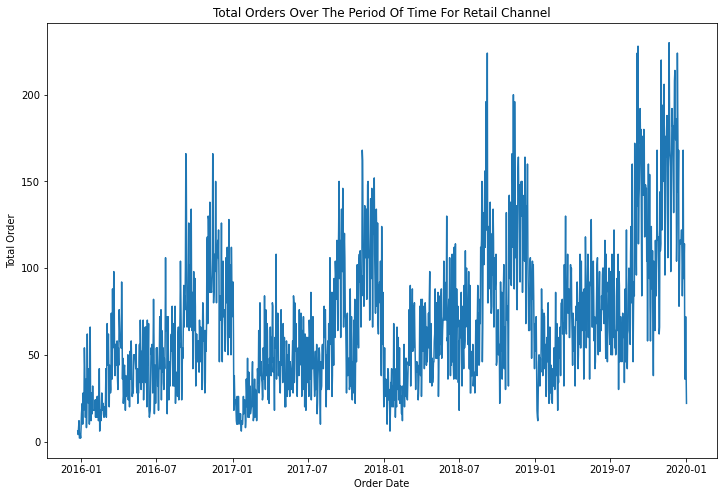

In [93]:
# Finding total number of orders frequency over the period of time

import datetime as dt

tot_daily_ord_cha_ret =  mba_titan_sales_cha_ret['Order Date'].groupby(mba_titan_sales_cha_ret['Order Date'].dt.date).agg('count').reset_index(name ='Total Order')

plt.figure(figsize=(12,8))
plt.plot(tot_daily_ord_cha_ret['Order Date'], tot_daily_ord_cha_ret['Total Order'])
plt.title('Total Orders Over The Period Of Time For Retail Channel')
plt.xlabel('Order Date')
plt.ylabel('Total Order')
plt.show()

**From the above plot we can see that over the period of time total number of order placed by customer is very fluctuating. we can see the highet spike during the mid of year 2018 and same for the mid of year 2019. Lowest trend at starting of the year 2016.**

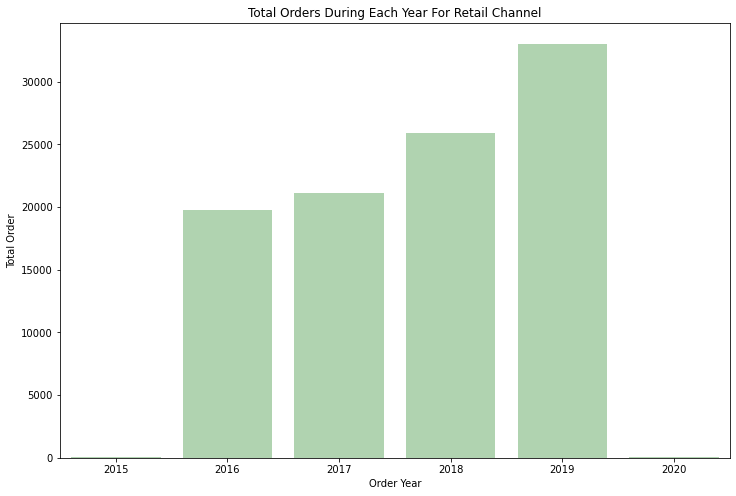

In [94]:
# Finding total number of orders Yearly for Retail Channel

tot_year_ord_cha_ret =  mba_titan_sales_cha_ret['Order Date'].groupby(mba_titan_sales_cha_ret['Order Date'].dt.year).agg('count').reset_index(name ='Total Order')


plt.figure(figsize=(12,8))
sns.barplot(tot_year_ord_cha_ret['Order Date'], tot_year_ord_cha_ret['Total Order'],alpha=0.4, color=color[2])
plt.title('Total Orders During Each Year For Retail Channel')
plt.xlabel('Order Year')
plt.ylabel('Total Order')
plt.show()

**From the above bar plot we can see that highest number of order is placed in year 2019 and lowest in year 2015.From the year 2016 to 2018 number of orders is increasing at same rate but after 2018 number of orders jumped drastically.**

In [95]:
# Converting columns for market basket analysis for Retail Channel

basket_cha_ret = (mba_titan_sales_cha_ret.groupby(['Order ID', 'Product Name'])['Quantity'].sum().unstack().reset_index().fillna(0).set_index('Order ID'))

basket_cha_ret.head()

Product Name  "While you Were Out" Message Book, One Form per Page  #10 Gummed Flap White Envelopes, 100/Box  #10 Self-Seal White Envelopes  #10 White Business Envelopes,4 1/8 x 9 1/2  #10- 4 1/8" x 9 1/2" Recycled Envelopes  #10- 4 1/8" x 9 1/2" Security-Tint Envelopes  #10-4 1/8" x 9 1/2" Premium Diagonal Seam Envelopes  #6 3/4 Gummed Flap White Envelopes  1.7 Cubic Foot Compact "Cube" Office Refrigerators  \
Order ID                                                                                                                                                                                                                                                                                                                                                                                                                      
1             0.0                                                   0.0                                       0.0                            0.0                                         0.0                                      0.0                                           0.0                                                  0.0                                 0.0                                                  
2             0.0                                                   0.0                                       0.0                            0.0                                         0.0                                      0.0                                           0.0                                                  0.0                                 0.0                                                  
3             0.0                                                   0.0                                       0.0                            0.0                                         0.0                                      0.0                                           0.0                                                  0.0                                 0.0                                                  
4             0.0                                                   0.0                                       0.0                            0.0                                         0.0                                      0.0                                           0.0                                                  0.0                                 0.0                                                  
5             0.0                                                   0.0                                       0.0                            0.0                                         0.0                                      0.0                                           0.0                                                  0.0                                 0.0                                                  

Product Name  1/4 Fold Party Design Invitations & White Envelopes, 24 8-1/2" X 11" Cards, 25 Env./Pack  12 Colored Short Pencils  12-1/2 Diameter Round Wall Clock  14-7/8 x 11 Blue Bar Computer Printout Paper  2300 Heavy-Duty Transfer File Systems by Perma  24 Capacity Maxi Data Binder Racks, Pearl  24-Hour Round Wall Clock  3-ring staple pack  3.6 Cubic Foot Counter Height Office Refrigerator  36X48 HARDFLOOR CHAIRMAT  3M Hangers With Command Adhesive  3M Office Air Cleaner  \
Order ID                                                                                                                                                                                                                                                                                                                                                                                                                                                                                          
1             0.0                                                                                       0.0                     

In [96]:
# Applying Fucntion for conveting postive values to 1 and less than zeros to 0 On Retail Channel

basket_sets_cha_ret = basket_cha_ret.applymap(encode_units)

In [97]:
# Applying market basket analysis on the Parts data

frequent_itemsets_cha_ret = fpgrowth(basket_sets_cha_ret, min_support=0.0009, use_colnames=True)

In [98]:
# Creating association rules based upon applied algorithm

rules_cha_ret = association_rules(frequent_itemsets_cha_ret, metric="lift",min_threshold=1)
rules_cha_ret.head(10)

,antecedents,consequents,antecedent support,consequent support,support,confidence,lift,leverage,conviction
0,(Pierce Parts - Replacement Kit 4),(Pierce Parts - Replacement Kit 3),0.001748,0.001748,0.000999,0.571429,326.840816,0.000996,2.329254
1,(Pierce Parts - Replacement Kit 3),(Pierce Parts - Replacement Kit 4),0.001748,0.001748,0.000999,0.571429,326.840816,0.000996,2.329254
2,(Pierce Parts - Replacement Kit 4),(Pierce Parts - Replacement Kit 5),0.001748,0.001748,0.000999,0.571429,326.840816,0.000996,2.329254
3,(Pierce Parts - Replacement Kit 5),(Pierce Parts - Replacement Kit 4),0.001748,0.001748,0.000999,0.571429,326.840816,0.000996,2.329254
4,(Koziuk 2050),(Koziuk 2000),0.002623,0.002623,0.001099,0.419048,159.788844,0.001092,1.716797
5,(Koziuk 2000),(Koziuk 2050),0.002623,0.002623,0.001099,0.419048,159.788844,0.001092,1.716797
6,(Koziuk 2050),(Koziuk 3000),0.002623,0.002623,0.001399,0.533333,203.367619,0.001392,2.137237
7,(Koziuk 3000),(Koziuk 2050),0.002623,0.002623,0.001399,0.533333,203.367619,0.001392,2.137237
8,(Koziuk 2500),(Koziuk 3000),0.002623,0.002623,0.001199,0.457143,174.315102,0.001192,1.837274
9,(Koziuk 3000),(Koziuk 2500),0.002623,0.002623,0.001199,0.457143,174.315102,0.001192,1.837274


In [99]:
# Finding total rules generated by algorithm 
len(rules_cha_ret)

28

In [100]:
# filtering rules as per given criteria
pd.set_option("display.max_colwidth", -1) # To show full column value

rules_cha_ret_filter = rules_cha_ret [ (rules_cha_ret['lift'] >= 6) &
               (rules_cha_ret['confidence'] >= 0.8) ]
rules_cha_ret_filter.head()

,antecedents,consequents,antecedent support,consequent support,support,confidence,lift,leverage,conviction
18,"(Hoses, Water Filters)",(Replacement Element),0.000999,0.002623,0.000999,1.0,381.314286,0.000996,inf
20,"(Water Filters, Replacement Element)",(Hoses),0.000999,0.002623,0.000999,1.0,381.314286,0.000996,inf


In [101]:
# Finding total rules generated by algorithm after filter
len(rules_cha_ret_filter)

2

<p style="font-size:25px;">E-Commerce Channel</p>

In [102]:
# filtering out E-commerce Channel data and store into variable

mba_titan_sales_cha_ecom = (mba_titan_sales_cha[mba_titan_sales_cha['Channel'] == "E-Commerce"])

mba_titan_sales_cha_ecom.head()

,Channel,Order Date,Order ID,Product Name,Product ID,Quantity
35,E-Commerce,2018-11-13,ET-2018-152181,Bush Somerset Collection Bookcase,P00402,6
36,E-Commerce,2018-04-15,ET-2018-117706,Bush Somerset Collection Bookcase,P00402,15
37,E-Commerce,2019-08-30,ET-2019-159818,Bush Somerset Collection Bookcase,P00402,6
38,E-Commerce,2019-05-06,ET-2019-110223,Bush Somerset Collection Bookcase,P00402,9
39,E-Commerce,2018-04-15,ET-2018-117706,Bush Somerset Collection Bookcase,P00402,18


In [103]:
# Looking at the shape of the data
mba_titan_sales_cha_ecom.shape

(19986, 6)

In [104]:
# finding Total number of Unique products with their Total frequency in data for E-Commerce Channel

pd.set_option('display.max_rows',None)
pd.set_option('display.width', 500)

uni_pro_cha_ecom = mba_titan_sales_cha_ecom.groupby(['Product ID','Product Name']).size().reset_index(name ='Total Frequency')

print(uni_pro_cha_ecom)

     Product ID                                                                                                                     Product Name  Total Frequency
0     P00001     "While you Were Out" Message Book, One Form per Page                                                                             6              
1     P00002     #10- 4 1/8" x 9 1/2" Recycled Envelopes                                                                                          20             
2     P00003     #10- 4 1/8" x 9 1/2" Security-Tint Envelopes                                                                                     15             
3     P00004     #10 Gummed Flap White Envelopes, 100/Box                                                                                         7              
4     P00005     #10 Self-Seal White Envelopes                                                                                                    8              
5     P00006     #10 White B

**From the above output we can see that their total 1919 unique products same as in overall data which means all products are  in E-Commerce Channel.**

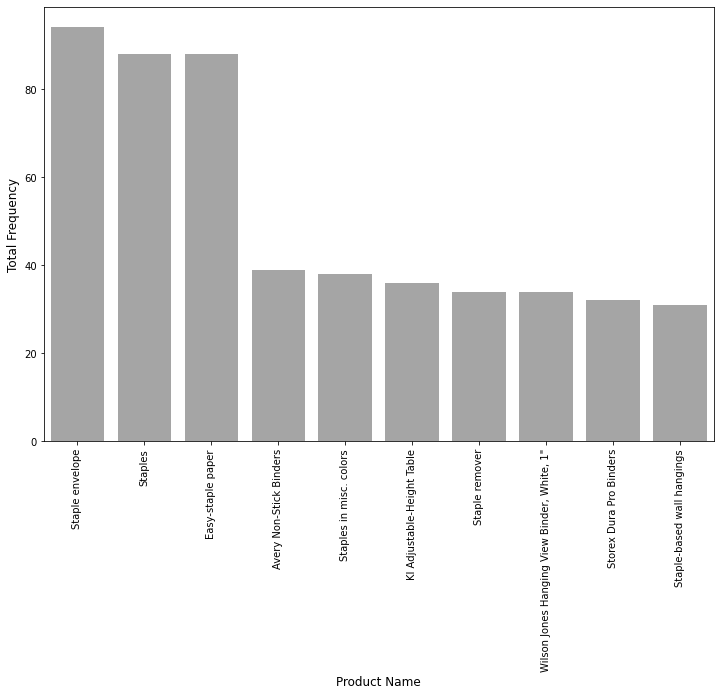

In [105]:
# finding top 10 products with high number of frequency

Top_10_pro_cha_ecom = mba_titan_sales_cha_ecom['Product Name'].value_counts().head(10)
plt.figure(figsize=(12,8))
sns.barplot(Top_10_pro_cha_ecom.index, Top_10_pro_cha_ecom.values, alpha=0.7, color=color[7])
plt.ylabel('Total Frequency', fontsize=12)
plt.xlabel('Product Name', fontsize=12)
plt.xticks(rotation='vertical')
plt.show()

**From the above plot we can see that highest number of total frequency Product for E-Commerce Channel is 'Staple Envelope'.**

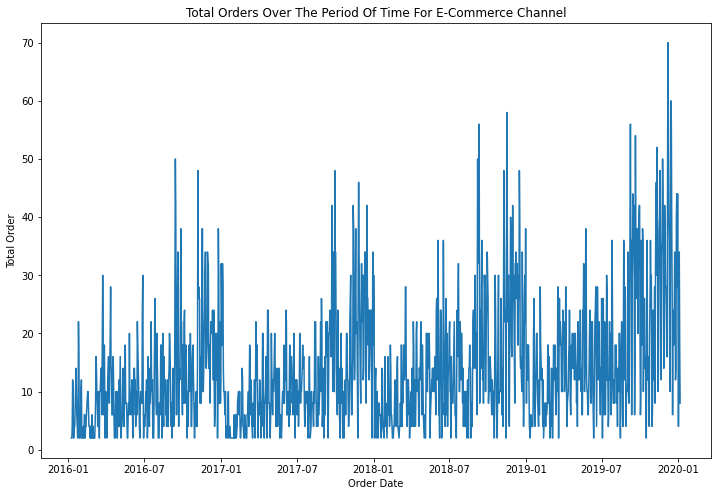

In [106]:
# Finding total number of orders frequency over the period of time

import datetime as dt

tot_daily_ord_cha_ecom =  mba_titan_sales_cha_ecom['Order Date'].groupby(mba_titan_sales_cha_ecom['Order Date'].dt.date).agg('count').reset_index(name ='Total Order')

plt.figure(figsize=(12,8))
plt.plot(tot_daily_ord_cha_ecom['Order Date'], tot_daily_ord_cha_ecom['Total Order'])
plt.title('Total Orders Over The Period Of Time For E-Commerce Channel')
plt.xlabel('Order Date')
plt.ylabel('Total Order')
plt.show()

**From the above plot we can see that over the period of time total number of order placed by customer is very fluctuating.**

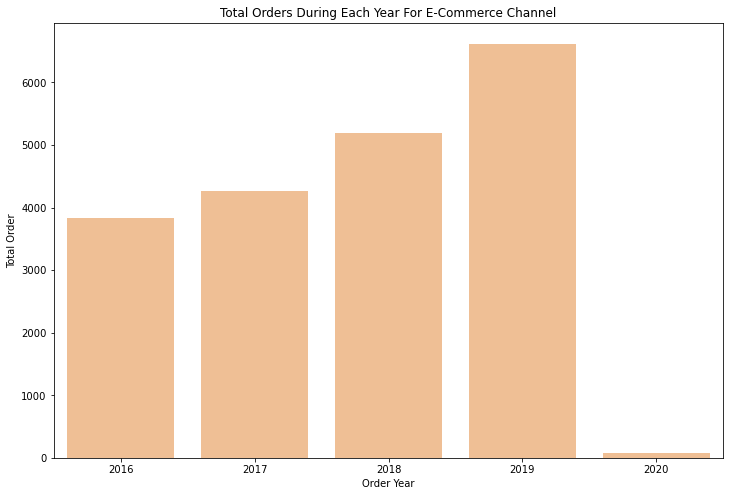

In [107]:
# Finding total number of orders Yearly for E-Commerce Channel

tot_year_ord_cha_ecom =  mba_titan_sales_cha_ecom['Order Date'].groupby(mba_titan_sales_cha_ecom['Order Date'].dt.year).agg('count').reset_index(name ='Total Order')


plt.figure(figsize=(12,8))
sns.barplot(tot_year_ord_cha_ecom['Order Date'], tot_year_ord_cha_ecom['Total Order'],alpha=0.5, color=color[1])
plt.title('Total Orders During Each Year For E-Commerce Channel')
plt.xlabel('Order Year')
plt.ylabel('Total Order')
plt.show()

**From the above bar plot we can see the totally different trend compared to retail channel.Here highest number of order is placed in year 2019 and lowest is in year 2020. From year 2016 to year 2019 order has increased nearly at same rate.**



In [108]:
# Converting columns for market basket analysis for E-Commerce Channel

basket_cha_ecom = (mba_titan_sales_cha_ecom.groupby(['Order ID', 'Product Name'])['Quantity'].sum().unstack().reset_index().fillna(0).set_index('Order ID'))

basket_cha_ecom.head()

Product Name    "While you Were Out" Message Book, One Form per Page  #10 Gummed Flap White Envelopes, 100/Box  #10 Self-Seal White Envelopes  #10 White Business Envelopes,4 1/8 x 9 1/2  #10- 4 1/8" x 9 1/2" Recycled Envelopes  #10- 4 1/8" x 9 1/2" Security-Tint Envelopes  #10-4 1/8" x 9 1/2" Premium Diagonal Seam Envelopes  #6 3/4 Gummed Flap White Envelopes  1.7 Cubic Foot Compact "Cube" Office Refrigerators  \
Order ID                                                                                                                                                                                                                                                                                                                                                                                                                        
ET-2016-100031  0.0                                                   0.0                                       0.0                            0.0                                         0.0                                      0.0                                           0.0                                                  0.0                                 0.0                                                  
ET-2016-100115  0.0                                                   0.0                                       0.0                            0.0                                         0.0                                      0.0                                           0.0                                                  0.0                                 0.0                                                  
ET-2016-100304  0.0                                                   0.0                                       0.0                            0.0                                         0.0                                      0.0                                           0.0                                                  0.0                                 0.0                                                  
ET-2016-100318  0.0                                                   0.0                                       0.0                            0.0                                         0.0                                      0.0                                           0.0                                                  0.0                                 0.0                                                  
ET-2016-100353  0.0                                                   0.0                                       0.0                            0.0                                         0.0                                      0.0                                           0.0                                                  0.0                                 0.0                                                  

Product Name    1/4 Fold Party Design Invitations & White Envelopes, 24 8-1/2" X 11" Cards, 25 Env./Pack  12 Colored Short Pencils  12-1/2 Diameter Round Wall Clock  14-7/8 x 11 Blue Bar Computer Printout Paper  2300 Heavy-Duty Transfer File Systems by Perma  24 Capacity Maxi Data Binder Racks, Pearl  24-Hour Round Wall Clock  3-ring staple pack  3.6 Cubic Foot Counter Height Office Refrigerator  36X48 HARDFLOOR CHAIRMAT  3M Hangers With Command Adhesive  3M Office Air Cleaner  \
Order ID                                                                                                                                                                                                                                                                                                                                                                                                                                                                                            
ET-2016-100031  0.0                                                                                       0.0 

In [109]:
# Applying Fucntion for conveting postive values to 1 and less than zeros to 0 On E-commerce Channel

basket_sets_cha_ecom = basket_cha_ecom.applymap(encode_units)

In [110]:
# Applying market basket analysis on the Parts data

frequent_itemsets_cha_ecom = fpgrowth(basket_sets_cha_ecom, min_support=0.002, use_colnames=True)

In [111]:
# Creating association rules based upon applied algorithm

rules_cha_ecom = association_rules(frequent_itemsets_cha_ecom, metric="lift",min_threshold=1)
rules_cha_ecom.head(10)

,antecedents,consequents,antecedent support,consequent support,support,confidence,lift,leverage,conviction
0,(Car Light),(Replacement Element),0.004188,0.004188,0.002792,0.666667,159.174603,0.002775,2.987435
1,(Replacement Element),(Car Light),0.004188,0.004188,0.002792,0.666667,159.174603,0.002775,2.987435
2,(Koziuk 2050),(Koziuk 2000),0.004188,0.004188,0.002194,0.523810,125.065760,0.002176,2.091205
3,(Koziuk 2000),(Koziuk 2050),0.004188,0.004188,0.002194,0.523810,125.065760,0.002176,2.091205
4,(Koziuk 2050),(Koziuk 3000),0.004188,0.004188,0.002792,0.666667,159.174603,0.002775,2.987435
5,(Koziuk 3000),(Koziuk 2050),0.004188,0.004188,0.002792,0.666667,159.174603,0.002775,2.987435
6,(Bolt Buster Kit),(Water Filters),0.004188,0.004188,0.002792,0.666667,159.174603,0.002775,2.987435
7,(Water Filters),(Bolt Buster Kit),0.004188,0.004188,0.002792,0.666667,159.174603,0.002775,2.987435
8,(Hoses),(Replacement Element),0.004188,0.004188,0.002992,0.714286,170.544218,0.002974,3.485341
9,(Replacement Element),(Hoses),0.004188,0.004188,0.002992,0.714286,170.544218,0.002974,3.485341


In [112]:
# Finding total rules generated by algorithm 
len(rules_cha_ecom)

14

In [113]:
# filtering rules as per given criteria
pd.set_option("display.max_colwidth", -1) # To show full column value

rules_cha_ecom_filter = rules_cha_ecom [ (rules_cha_ecom['lift'] >= 6) &
                   (rules_cha_ecom['confidence'] >= 0.6) ]

rules_cha_ecom_filter.head()

,antecedents,consequents,antecedent support,consequent support,support,confidence,lift,leverage,conviction
0,(Car Light),(Replacement Element),0.004188,0.004188,0.002792,0.666667,159.174603,0.002775,2.987435
1,(Replacement Element),(Car Light),0.004188,0.004188,0.002792,0.666667,159.174603,0.002775,2.987435
4,(Koziuk 2050),(Koziuk 3000),0.004188,0.004188,0.002792,0.666667,159.174603,0.002775,2.987435
5,(Koziuk 3000),(Koziuk 2050),0.004188,0.004188,0.002792,0.666667,159.174603,0.002775,2.987435
6,(Bolt Buster Kit),(Water Filters),0.004188,0.004188,0.002792,0.666667,159.174603,0.002775,2.987435


In [114]:
# Finding total rules generated by algorithm after filter
len(rules_cha_ecom_filter)

10

## Conclusion:

<p>After applying associtation rule mining on different sets of dataset we understood that choosing the value of support,confidecne and lift is very important for generating rules. In our case, we have tried to take strong value of support,confidence and lift to generat more strict rules. Although, to achieve the desired output one shoulf have a good knowledge of products and end goal must need to be clear before applying association rule mining.</p>

# Customer Segmentation Using RFM Analysis

In [115]:
# Removing duplicates
filtered_data = titan_sales[['Customer ID', 'Customer Name']].drop_duplicates()
filtered_data.head 

<bound method NDFrame.head of        Customer ID           Customer Name
0       C00167      Claire Gute           
2       C00060      Arthur Gainer         
6       C00696      Seth Vernon           
10      C00334      Herbert Flentye       
14      C00631      Retail Titan          
21      C00629      Regional Titan        
28      C00585      Outlet Titan          
35      C00247      E-Commerce Titan      
42      C00233      Distribution Titan    
49      C00543      Midwest Titan         
58      C00636      Rick Bensley          
62      C00412      Justin Ellison        
64      C00743      Ted Trevino           
68      C00240      Dorris liebe          
72      C00107      Brian Dahlen          
76      C00289      Frank Preis           
80      C00486      Marc Crier            
84      C00750      Thomas Boland         
88      C00420      Karen Ferguson        
92      C00733      Susan Pistek          
96      C00043      Anna Andreadi         
236     C00441      Ken 

In [116]:
filtered_data.info()

<class 'pandas.core.frame.DataFrame'>
Int64Index: 799 entries, 0 to 147608
Data columns (total 2 columns):
 #   Column         Non-Null Count  Dtype 
---  ------         --------------  ----- 
 0   Customer ID    799 non-null    object
 1   Customer Name  799 non-null    object
dtypes: object(2)
memory usage: 18.7+ KB


#### By Filtering the Customer Name and Customer ID we understand that we have 799 customers in our data.

In [117]:
# Selecting the data for the RFM Analysis and Customer Segmentation
rfm_titan_sales = titan_sales[['Customer ID','Order ID','Order Date','Sales']]

In [118]:
rfm_titan_sales.describe()

,Sales
count,1.598880e+05
mean,3.193026e+03
std,1.881989e+04
min,1.000000e+00
25%,8.800000e+01
50%,3.400000e+02
75%,1.480000e+03
max,1.960000e+06


In [119]:
rfm_titan_sales.info()

<class 'pandas.core.frame.DataFrame'>
Int64Index: 159888 entries, 0 to 159887
Data columns (total 4 columns):
 #   Column       Non-Null Count   Dtype         
---  ------       --------------   -----         
 0   Customer ID  159888 non-null  object        
 1   Order ID     159888 non-null  object        
 2   Order Date   159888 non-null  datetime64[ns]
 3   Sales        159888 non-null  int64         
dtypes: datetime64[ns](1), int64(1), object(2)
memory usage: 11.1+ MB


In [120]:
# Check Min and Max dates
print(rfm_titan_sales['Order Date'].min())
print(rfm_titan_sales['Order Date'].max())

2015-12-24 00:00:00
2020-01-14 00:00:00


#### Our data is the between 2015-12-24 to 2020-01-14, So it's a 4 years and 1 month long time frame.

In [121]:
print('Orders from {} to {}'.format(rfm_titan_sales['Order Date'].min(),
                                    rfm_titan_sales['Order Date'].max()))

Orders from 2015-12-24 00:00:00 to 2020-01-14 00:00:00


# Perform RFM Analysis

- For Recency, Calculate the number of days between present date and date of last purchase for each customer.
- For Frequency, Calculate the number of orders for each customer.
- For Monetary, Calculate sum of purchase price for each customer.

In [122]:
# Store a date as a reference point for recency calculations
PRESENT = dt.datetime(2020, 1, 15)
PRESENT

datetime.datetime(2020, 1, 15, 0, 0)

In [123]:
rfm_titan_sales['Order ID'].value_counts().head()

RE-2019-100126    28
CA-2019-100111    28
RT-2019-100121    28
ET-2019-100136    28
DT-2019-100141    28
Name: Order ID, dtype: int64

#### The above output shows us that the numbers products associated with a specific Order ID. Example: Order Number RE-2019-100126 has 28 products associated with it.

In [124]:
orders = rfm_titan_sales.groupby(['Order ID', 'Order Date', 'Customer ID']).agg({'Sales': lambda x: x.sum()}).reset_index()
orders.head()

,Order ID,Order Date,Customer ID,Sales
0,1,2018-11-11,C00167,15720
1,2,2018-11-11,C00167,43920
2,3,2018-06-15,C00202,600
3,4,2017-10-14,C00694,57480
4,5,2017-10-14,C00694,1320


In [125]:
rfm = rfm_titan_sales.groupby('Customer ID').agg({'Order Date': lambda date: (PRESENT - date.max()).days,
                                        'Order ID': lambda num: len(num),
                                        'Sales': lambda price: price.sum()})

In [126]:
rfm

,Order Date,Order ID,Sales
Customer ID,,,
C00001,428,24,129869
C00002,25,44,171626
C00003,101,40,446520
C00004,67,72,1507977
C00005,47,80,631881
C00006,41,100,476593
C00007,54,80,2814183
C00008,73,64,254187
C00009,54,12,2919


In [127]:
# Change the column names
rfm.columns=['recency','frequency','monetary']

In [128]:
rfm['recency'] = rfm['recency'].astype(int)

In [129]:
rfm['monetary'] = rfm['monetary'].astype(int)

In [130]:
# Filtering the data for 365 days
rfm_365 = rfm[rfm['recency'] <= 365]

#### Filtering Data based on recency as we can considering only last 365 days of data for our RFM analysis.

In [131]:
# Showing the filtered data of last 365 days for our RFM
sorted_rfm_365 = rfm_365.sort_values(by = ['recency'], ascending = False)
sorted_rfm_365

,recency,frequency,monetary
Customer ID,,,
C00229,365,32,22936
C00775,363,40,376569
C00755,362,76,234789
C00678,362,88,2070828
C00628,358,36,212707
C00745,357,28,238415
C00167,351,20,168055
C00759,350,36,594621
C00087,349,36,375943


In [132]:
rfm_365

,recency,frequency,monetary
Customer ID,,,
C00002,25,44,171626
C00003,101,40,446520
C00004,67,72,1507977
C00005,47,80,631881
C00006,41,100,476593
C00007,54,80,2814183
C00008,73,64,254187
C00009,54,12,2919
C00010,54,48,95366


In [133]:
rfm_365.describe()

,recency,frequency,monetary
count,696.000000,696.000000,6.960000e+02
mean,98.426724,224.701149,6.831819e+05
std,79.732739,1844.237817,2.877976e+06
min,1.000000,4.000000,1.113000e+03
25%,40.000000,36.000000,1.528525e+05
50%,70.000000,52.000000,3.182320e+05
75%,130.000000,68.000000,5.747842e+05
max,365.000000,19986.000000,5.513650e+07


array([[<AxesSubplot:title={'center':'recency'}>]], dtype=object)

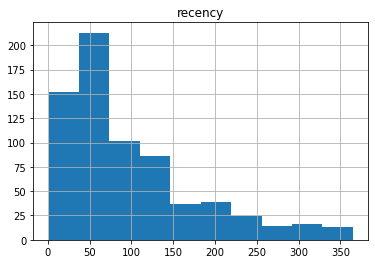

In [134]:
# Histogram for Recency Data
rfm_365.hist(column='recency')

#### Most of the customers lies in 0 to 150 days in the recency which indicate a that most of the customers are not ghosting the company.

array([[<AxesSubplot:title={'center':'frequency'}>]], dtype=object)

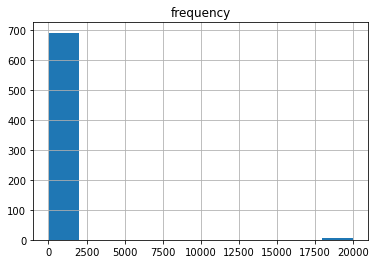

In [135]:
# Histogram for Frequency Data

rfm_365.hist(column='frequency')

#### The chart tells us that it is right skewed chart and hence by looking at it we can say there are outliers present in the data. We can also say that most of the frequency lies between 1 to 20000.

array([[<AxesSubplot:title={'center':'monetary'}>]], dtype=object)

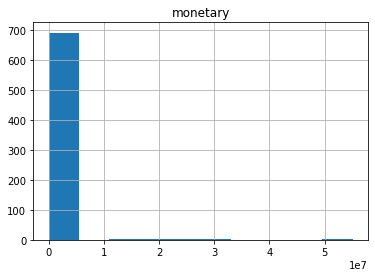

In [136]:
# Histogram for Monetary Data
rfm_365.hist(column='monetary')

#### The chart tells us that it is right skewed chart and hence by looking at it we can say there are outliers present in the data. We can also say that most of the monetary lies between 1 to 5513650 or (o to 5.513650e* 10^7).

## Calcualte the RFM Score

In [137]:
quintiles = rfm_365[['recency', 'frequency', 'monetary']].quantile([.2, .4, .6, .8]).to_dict()
quintiles

{'recency': {0.2: 35.0, 0.4: 55.0, 0.6: 92.0, 0.8: 150.0},
 'frequency': {0.2: 32.0, 0.4: 44.0, 0.6: 56.0, 0.8: 72.0},
 'monetary': {0.2: 123891.0, 0.4: 245385.0, 0.6: 413813.0, 0.8: 671409.0}}

In [138]:
rfm_segment = rfm_365.copy()

In [139]:
def r_score(x):
    if x <= quintiles['recency'][.2]:
        return 5
    elif x <= quintiles['recency'][.4]:
        return 4
    elif x <= quintiles['recency'][.6]:
        return 3
    elif x <= quintiles['recency'][.8]:
        return 2
    else:
        return 1
    
def fm_score(x, c):
    if x <= quintiles[c][.2]:
        return 1
    elif x <= quintiles[c][.4]:
        return 2
    elif x <= quintiles[c][.6]:
        return 3
    elif x <= quintiles[c][.8]:
        return 4
    else:
        return 5  

In [140]:
rfm_365['R'] = rfm['recency'].apply(lambda x: r_score(x))
rfm_365['F'] = rfm['frequency'].apply(lambda x: fm_score(x, 'frequency'))
rfm_365['M'] = rfm['monetary'].apply(lambda x: fm_score(x, 'monetary'))

In [141]:
rfm_365['RFM Score'] = rfm_365['R'].map(str) + rfm_365['F'].map(str) + rfm_365['M'].map(str)
rfm_365.head()

,recency,frequency,monetary,R,F,M,RFM Score
Customer ID,,,,,,,
C00002,25,44,171626,5,2,2,522
C00003,101,40,446520,2,2,4,224
C00004,67,72,1507977,3,4,5,345
C00005,47,80,631881,4,5,4,454
C00006,41,100,476593,4,5,4,454


In [142]:
segt_map = {
    r'[1-2][1-2]': 'at risk',
    r'[1-2][3-4]': 'at risk',
    r'[1-2]5': 'can\'t loose',
    r'3[1-2]': 'need attention',
    
    r'33': 'need attention',
    r'[3-4][4-5]': 'loyal customers',
    r'41': 'new customers',
    r'51': 'new customers',
    r'[4-5][2-3]': 'champions',
    r'5[4-5]': 'champions'
}

rfm_365['Segment'] = rfm_365['R'].map(str) + rfm_365['F'].map(str)
rfm_365['Segment'] = rfm_365['Segment'].replace(segt_map, regex=True)
rfm_365.head()

,recency,frequency,monetary,R,F,M,RFM Score,Segment
Customer ID,,,,,,,,
C00002,25,44,171626,5,2,2,522,champions
C00003,101,40,446520,2,2,4,224,at risk
C00004,67,72,1507977,3,4,5,345,loyal customers
C00005,47,80,631881,4,5,4,454,loyal customers
C00006,41,100,476593,4,5,4,454,loyal customers


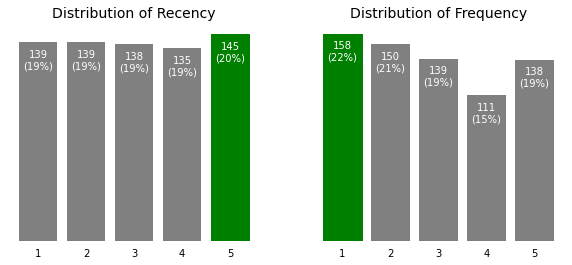

In [143]:
# plot the distribution of customers over R and F
fig, axes = plt.subplots(nrows=1, ncols=2, figsize=(10, 4))

for i, p in enumerate(['R', 'F']):
    parameters = {'R':'Recency', 'F':'Frequency'}
    y = rfm_365[p].value_counts().sort_index()
    x = y.index
    ax = axes[i]
    bars = ax.bar(x, y, color='gray')
    ax.set_frame_on(False)
    ax.tick_params(left=False, labelleft=False, bottom=False)
    ax.set_title('Distribution of {}'.format(parameters[p]),
                fontsize=14)
    for bar in bars:
        value = bar.get_height()
        if value == y.max():
            bar.set_color('green')
        ax.text(bar.get_x() + bar.get_width() / 2,
                value - 5,
                '{}\n({}%)'.format(int(value), int(value * 100 / y.sum())),
               ha='center',
               va='top',
               color='w')
        
plt.show()

#### Above chart of Distribution of Recency defines that in 145 customers that is 20% of the customer lies in the most recent purchase and they are the most among all other distribution. They lies in 5th quantile.

#### On the other hand, if we talk about Distribution of Frequency then most of the customers lies in 1st quantile according to our distribution but if we check that 1st quantile, that is not good for our sales and the marketing team should focus to increase the frequency of this group of customers to increase the sales as this group consists of the most customers i.e. 158 customers belong from 1st quantile.

In [144]:
# count the number of customers in each segment
segments_counts = rfm_365['Segment'].value_counts().sort_values(ascending=True)

segments_counts

can't loose        42 
new customers      43 
need attention     86 
loyal customers    106
champions          183
at risk            236
Name: Segment, dtype: int64

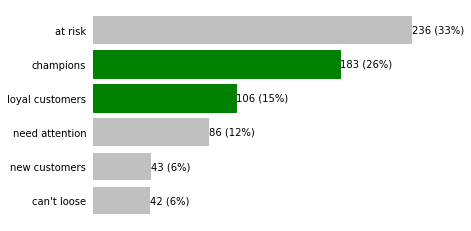

In [145]:
fig, ax = plt.subplots()

bars = ax.barh(range(len(segments_counts)),
              segments_counts,
              color='silver')
ax.set_frame_on(False)
ax.tick_params(left=False,
               bottom=False,
               labelbottom=False)
ax.set_yticks(range(len(segments_counts)))
ax.set_yticklabels(segments_counts.index)

for i, bar in enumerate(bars):
        value = bar.get_width()
        if segments_counts.index[i] in ['champions', 'loyal customers']:
            bar.set_color('green')
        ax.text(value,
                bar.get_y() + bar.get_height()/2,
                '{:,} ({:}%)'.format(int(value),
                                   int(value*100/segments_counts.sum())),
                va='center',
                ha='left'
               )

plt.show()

#### The above chart discribes us that this company has an alarming situation as maximum of their customer does not belong from "champions" and "loyal customers" as they are less then 50% among all customers, and if we talk about "at risk" customers they are maximum in proportion that is 33% among all. Their "need attention" group of customers are just 12% less then loyal customers which does not sound great for the company.

#### The best customers are the "champion" group of customers as there RFM score is always 555 and we can cosider "loyal" group of customers as the good customers as well as they are loyal and buys from us only.

In [146]:
# Customer with RFM Score 555
rfm_365[rfm_365['RFM Score']=='555'].sort_values('monetary', ascending=False).head()

,recency,frequency,monetary,R,F,M,RFM Score,Segment
Customer ID,,,,,,,,
C00543,16,19986,55136496,5,5,5,555,champions
C00629,18,19986,30327758,5,5,5,555,champions
C00233,1,19986,24814222,5,5,5,555,champions
C00247,10,19986,24814222,5,5,5,555,champions
C00585,26,19986,20678790,5,5,5,555,champions


#### The customers with low RFM score are likely to churn we can say that the at risk customers are likely to churn as their recency is high, frequency is low, and monetary is also low.

In [147]:
#Customers who's recency value is low

rfm_365[rfm_365['R'] <= 1 ].sort_values('monetary', ascending=False).head()

,recency,frequency,monetary,R,F,M,RFM Score,Segment
Customer ID,,,,,,,,
C00133,202,80,2170476,1,5,5,155,can't loose
C00170,297,112,2115153,1,5,5,155,can't loose
C00678,362,88,2070828,1,5,5,155,can't loose
C00076,320,64,1726178,1,4,5,145,at risk
C00453,167,104,1686420,1,5,5,155,can't loose


#### As mentioned earlier the "at risk" customers we are going to loose as their RFM score is low and not in our favour.

In [148]:
#Customers who's recency, frequency and monetary values are low 

rfm_365[rfm_365['RFM Score']=='111'].sort_values('recency',ascending=False).head()

,recency,frequency,monetary,R,F,M,RFM Score,Segment
Customer ID,,,,,,,,
C00229,365,32,22936,1,1,1,111,at risk
C00405,313,24,101870,1,1,1,111,at risk
C00655,312,8,14335,1,1,1,111,at risk
C00421,308,16,13054,1,1,1,111,at risk
C00356,300,16,37761,1,1,1,111,at risk


#### The customers belonging from the groups "champions" and "loyal customers" are the loyal customers as they are the one who gives us the most sales and if we analyze RFM score that is also the best which in our favour in all aspects.

In [149]:
#Customers with high frequency value

rfm_365[rfm_365['F'] >= 3 ].sort_values('monetary', ascending=False).head()

,recency,frequency,monetary,R,F,M,RFM Score,Segment
Customer ID,,,,,,,,
C00543,16,19986,55136496,5,5,5,555,champions
C00629,18,19986,30327758,5,5,5,555,champions
C00233,1,19986,24814222,5,5,5,555,champions
C00247,10,19986,24814222,5,5,5,555,champions
C00585,26,19986,20678790,5,5,5,555,champions


# Customer Segmentation Using Cluster Analysis

In [150]:
# Exporting rfm_356 data to csv this code is for Google Colab
#rfm_365.to_csv(r'rfm_365.csv')

In [151]:
#Exporting rfm_356 data to csv this code is for local 
rfm_365.to_csv(r'rfm_365.csv')

In [152]:
# code for uploading csv file to Googel Colab

#uploaded = files.upload()
#rfm_365_clustring = pd.read_csv(io.BytesIO(uploaded['rfm_365.csv']))

In [153]:
# Reading the CSV file 
rfm_365_clustring = pd.read_csv('rfm_365.csv')

In [154]:
# Setting Customer ID as Index
rfm_365_clustring = rfm_365_clustring.set_index('Customer ID')

In [155]:
rfm_365_clustring.head()

,recency,frequency,monetary,R,F,M,RFM Score,Segment
Customer ID,,,,,,,,
C00002,25,44,171626,5,2,2,522,champions
C00003,101,40,446520,2,2,4,224,at risk
C00004,67,72,1507977,3,4,5,345,loyal customers
C00005,47,80,631881,4,5,4,454,loyal customers
C00006,41,100,476593,4,5,4,454,loyal customers


In [156]:
rfm_365_clustring.info()

<class 'pandas.core.frame.DataFrame'>
Index: 696 entries, C00002 to C00799
Data columns (total 8 columns):
 #   Column     Non-Null Count  Dtype 
---  ------     --------------  ----- 
 0   recency    696 non-null    int64 
 1   frequency  696 non-null    int64 
 2   monetary   696 non-null    int64 
 3   R          696 non-null    int64 
 4   F          696 non-null    int64 
 5   M          696 non-null    int64 
 6   RFM Score  696 non-null    int64 
 7   Segment    696 non-null    object
dtypes: int64(7), object(1)
memory usage: 48.9+ KB


In [157]:
# Droping Segment coloum as it is of no use in Clustring
rfm_365_clustring = rfm_365_clustring.drop(['Segment'], axis=1)

In [158]:
#Checking that Segment column is Droped or not?
rfm_365_clustring.info()

<class 'pandas.core.frame.DataFrame'>
Index: 696 entries, C00002 to C00799
Data columns (total 7 columns):
 #   Column     Non-Null Count  Dtype
---  ------     --------------  -----
 0   recency    696 non-null    int64
 1   frequency  696 non-null    int64
 2   monetary   696 non-null    int64
 3   R          696 non-null    int64
 4   F          696 non-null    int64
 5   M          696 non-null    int64
 6   RFM Score  696 non-null    int64
dtypes: int64(7)
memory usage: 43.5+ KB


<AxesSubplot:>

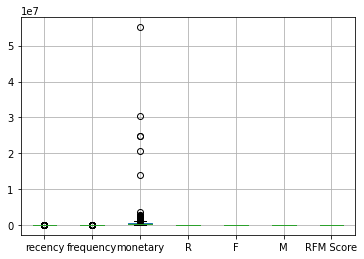

In [159]:
# Create box plots to check for outliers
rfm_365_clustring.boxplot()

In [160]:
# Calculate Z scores to normalize the data
from scipy import stats
import numpy as np
z = np.abs(stats.zscore(rfm_365_clustring))
print(z)

[[0.92157288 0.09805194 0.17787634 ... 0.61716079 0.70330471 1.29685517]
 [0.03229698 0.10022242 0.08229121 ... 0.61716079 0.70939392 0.74803058]
 [0.39443427 0.0828586  0.28679468 ... 0.77520197 1.41574324 0.08227538]
 ...
 [1.02198023 0.10456338 0.13118295 ... 1.31334217 1.41574324 1.24882094]
 [0.39443427 0.05681287 0.30510194 ... 1.47138335 1.41574324 0.15089571]
 [1.46310176 0.1023929  0.1365819  ... 0.61716079 0.00304461 1.44109589]]


In [161]:
rfm_clean = rfm_365_clustring[(z < 3).all(axis=1)]

In [162]:
print(rfm_clean)

             recency  frequency  monetary  R  F  M  RFM Score
Customer ID                                                  
C00002       25       44         171626    5  2  2  522      
C00003       101      40         446520    2  2  4  224      
C00004       67       72         1507977   3  4  5  345      
C00005       47       80         631881    4  5  4  454      
C00006       41       100        476593    4  5  4  454      
C00007       54       80         2814183   4  5  5  455      
C00008       73       64         254187    3  4  3  343      
C00009       54       12         2919      4  1  1  411      
C00010       54       48         95366     4  3  1  431      
C00011       38       56         163175    4  3  2  432      
C00012       42       48         893894    4  3  5  435      
C00013       68       32         308772    3  1  3  313      
C00014       19       52         472771    5  3  4  534      
C00015       35       52         419348    5  3  4  534      
C00016  

#### We have reduced the number of rows in this clean rfm as we took 3 standard deviations as a more than 99% of the population was covered by the z score. We can observe that rfm has 696 rows and rfm clean has 678 number of rows.

In [163]:
rfm_365_clustring.shape

(696, 7)

In [164]:
rfm_clean.shape

(678, 7)

<AxesSubplot:>

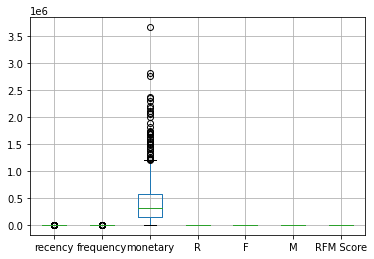

In [165]:
# Create box plots for cleqn data to check for outliers
rfm_clean.boxplot()

#### The above boxplot for clean dataset we can see outliers and mainly when we compare this boxplot with uncleanned data boxplot then in case of monetary most of the values considered as outlier for uncleanned data where after cleannig data we can clearly see first quartile,median and third quartile of monetary for cleanned data.

In [166]:
rfm_clean.describe()

,recency,frequency,monetary,R,F,M,RFM Score
count,678.000000,678.000000,6.780000e+02,678.000000,678.000000,678.000000,678.000000
mean,94.656342,53.020649,4.441902e+05,3.029499,2.877581,2.988201,334.713864
std,72.748945,24.605295,4.438134e+05,1.405523,1.430228,1.413119,143.626899
min,13.000000,4.000000,1.113000e+03,1.000000,1.000000,1.000000,111.000000
25%,40.250000,36.000000,1.505930e+05,2.000000,2.000000,2.000000,222.000000
50%,70.000000,52.000000,3.176575e+05,3.000000,3.000000,3.000000,334.000000
75%,127.000000,68.000000,5.715158e+05,4.000000,4.000000,4.000000,445.000000
max,333.000000,148.000000,3.666039e+06,5.000000,5.000000,5.000000,555.000000


array([[<AxesSubplot:title={'center':'recency'}>]], dtype=object)

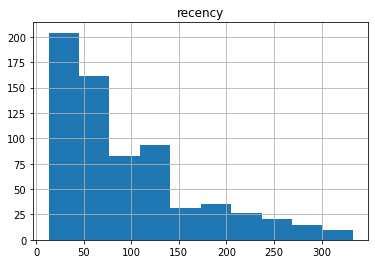

In [167]:
# Creating Histogram for clean rfm recency data
rfm_clean.hist(column='recency')

#### The above histogram of Recency for clean rfm shows us that most of the customers lies in 13 to 333 days which indicate that most of the customers are coming back to us to buy products and when we compare unclean data recency histogram as in visually we won't find any much difference but most customer was between 1 to 140 days. When we check the min and max value of the recency then we can realize that values are changed.

array([[<AxesSubplot:title={'center':'frequency'}>]], dtype=object)

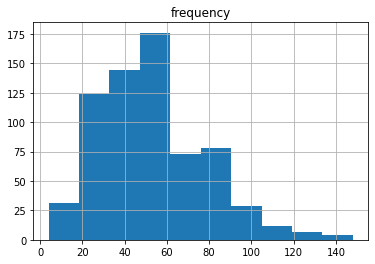

In [168]:
# Creating Histogram for clean rfm frequency data
rfm_clean.hist(column='frequency')

#### Answer: Here from above histogram of frequency of for clean rfm data most of customer lies in between 4 to 148 which is good. If we compare this histogram with unclean rfm data frequency histogram it was totally different because in unclean data customer's frequency a lot of outliers were their.But, now here in clean data we can see all outliers are removed also, min max values from 1 to 19986 changed to 4 to 148.

array([[<AxesSubplot:title={'center':'monetary'}>]], dtype=object)

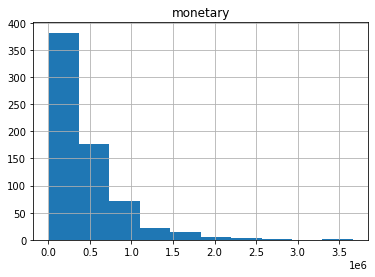

In [169]:
# Creating Histogram for clean rfm monetary data
rfm_clean.hist(column='monetary')

#### Histogram for clean rfm data is showing most of customer is between 0 to 3666039 approximately that is good for our busniess.While comparing this histogram with uncleanned rfm histogram it is totally different because their monetry min max value was between 1 to  approximately which says that a lot of outliers were their.Which is now removed in clean rfm data also min max value changes to between 0 to 5513650 approximately.

## Performing cluster analysis using K-means clustering with the original rfm dataframe

In [170]:
# Droping Segment coloum as it is of no use in Clustring
rfm_365 = rfm_365.drop(['Segment'], axis=1)

In [171]:
rfm_365.head()

,recency,frequency,monetary,R,F,M,RFM Score
Customer ID,,,,,,,
C00002,25,44,171626,5,2,2,522
C00003,101,40,446520,2,2,4,224
C00004,67,72,1507977,3,4,5,345
C00005,47,80,631881,4,5,4,454
C00006,41,100,476593,4,5,4,454


In [172]:
X = rfm_365

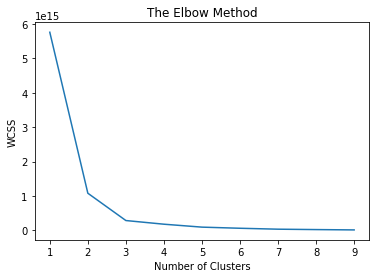

In [173]:
# Choose number of Clusters using the elbow method
# Within cluster sum of squares (wcss)
from sklearn.cluster import KMeans
# start with 10 number of clusters
wcss = []
for i in range(1,10):
    kmeans = KMeans(n_clusters =i, init = 'k-means++', max_iter =300, n_init =10, random_state =0)
    kmeans.fit(X)
    wcss.append(kmeans.inertia_)
plt.plot(range(1,10), wcss)
plt.title('The Elbow Method')
plt.xlabel('Number of Clusters')
plt.ylabel('WCSS')
plt.show()

In [174]:
# Fitting K Means to the Datatset using k = 3

kmeans = KMeans(n_clusters = 3)
y_kmeans = kmeans.fit_predict(X)

In [175]:
# Adding cluster ID to the dataframe
rfm_365['Cluster_ID'] = y_kmeans

In [176]:
rfm_365.head()

,recency,frequency,monetary,R,F,M,RFM Score,Cluster_ID
Customer ID,,,,,,,,
C00002,25,44,171626,5,2,2,522,0
C00003,101,40,446520,2,2,4,224,0
C00004,67,72,1507977,3,4,5,345,0
C00005,47,80,631881,4,5,4,454,0
C00006,41,100,476593,4,5,4,454,0


### Plot the graph

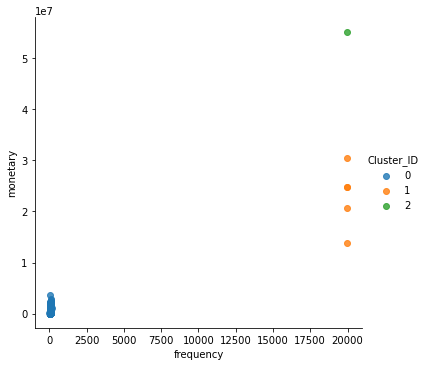

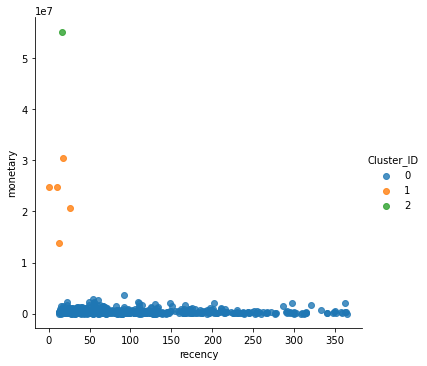

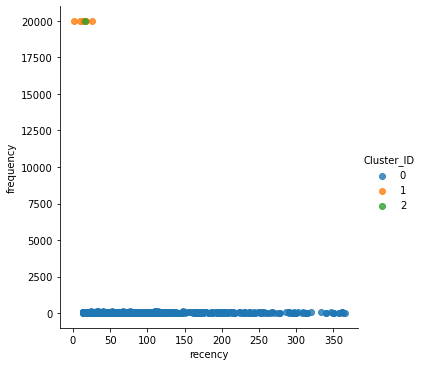

In [177]:
# Create a plot for frequency vs monetary 
facet = sns.lmplot(data=X, x='frequency', y='monetary', hue='Cluster_ID', 
                   fit_reg=False, legend=True, legend_out=True)
# Create a plot for recency vs monetary
facet2 = sns.lmplot(data=X, x='recency', y='monetary', hue='Cluster_ID', 
                   fit_reg=False, legend=True, legend_out=True)
# Create a plot for recency vs frequency
facet2 = sns.lmplot(data=X, x='recency', y='frequency', hue='Cluster_ID', 
                   fit_reg=False, legend=True, legend_out=True)

#### From the above plots we can say that with k=3 is able to create clusters for first two cases which is monetary & frequency and monetary & recency we can see proper segmentation of customers, where in the case of frequency & recency segmentation is not done properly we can not identity all three groups easily.

#### Performing Cluster Analysis with k=4

In [178]:
X = rfm_365

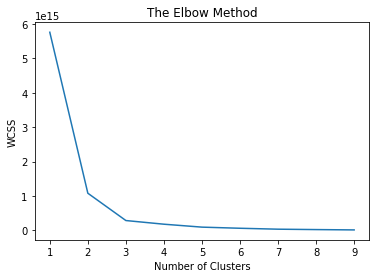

In [179]:
# Choose number of Clusters using the elbow method
# Within cluster sum of squares (wcss)
from sklearn.cluster import KMeans
# start with 10 number of clusters
wcss = []
for i in range(1,10):
    kmeans = KMeans(n_clusters =i, init = 'k-means++', max_iter =300, n_init =10, random_state =0)
    kmeans.fit(X)
    wcss.append(kmeans.inertia_)
plt.plot(range(1,10), wcss)
plt.title('The Elbow Method')
plt.xlabel('Number of Clusters')
plt.ylabel('WCSS')
plt.show()

In [180]:
# Fitting K Means to the Datatset using k = 4

kmeans = KMeans(n_clusters = 4)
y_kmeans = kmeans.fit_predict(X)

In [181]:
# Adding cluster ID to the dataframe
rfm_365['Cluster_ID'] = y_kmeans

In [182]:
rfm_365.head()

,recency,frequency,monetary,R,F,M,RFM Score,Cluster_ID
Customer ID,,,,,,,,
C00002,25,44,171626,5,2,2,522,1
C00003,101,40,446520,2,2,4,224,1
C00004,67,72,1507977,3,4,5,345,1
C00005,47,80,631881,4,5,4,454,1
C00006,41,100,476593,4,5,4,454,1


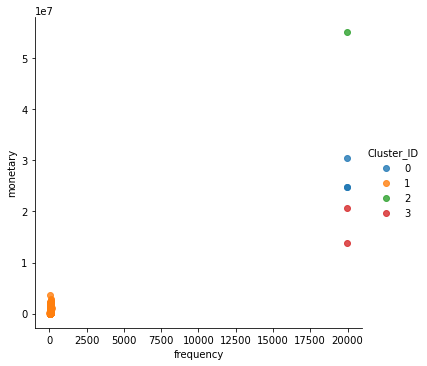

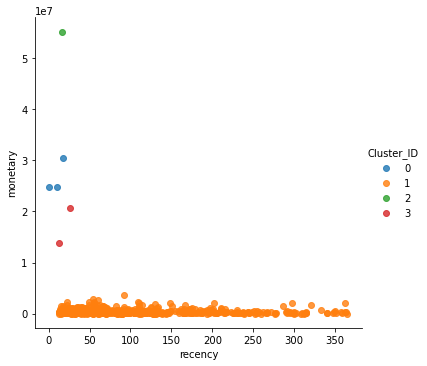

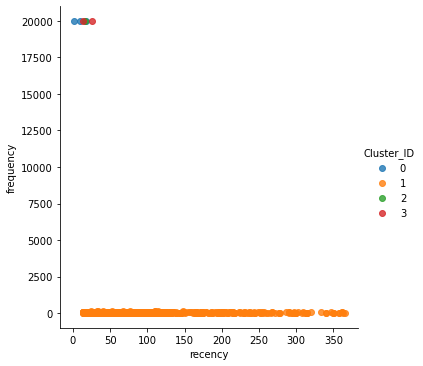

In [183]:
# Create a plot for frequency vs monetary 
facet = sns.lmplot(data=X, x='frequency', y='monetary', hue='Cluster_ID', 
                   fit_reg=False, legend=True, legend_out=True)
# Create a plot for recency vs monetary
facet2 = sns.lmplot(data=X, x='recency', y='monetary', hue='Cluster_ID', 
                   fit_reg=False, legend=True, legend_out=True)
# Create a plot for recency vs frequency
facet2 = sns.lmplot(data=X, x='recency', y='frequency', hue='Cluster_ID', 
                   fit_reg=False, legend=True, legend_out=True)

#### Compare to k=3 here alogorithm is able to create 4 different clusters easily for all three cases that is monetary & frequency, monetary & recency and frequncy & recency but since this data is not clear in sense outliers are not have been removed mean of each cluster is close to each other and because of that clusters are overlapping on each other.

### Performing cluster analysis with the outliers removed i.e. clean rfm dataframe

In [184]:
X1 = rfm_clean

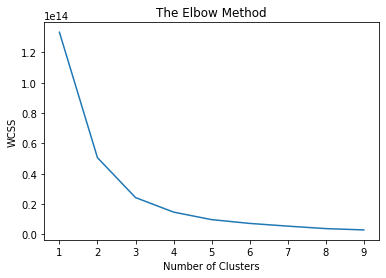

In [185]:
# Choose number of Clusters using the elbow method
# Within cluster sum of squares (wcss)
from sklearn.cluster import KMeans
# start with 10 number of clusters
wcss = []
for i in range(1,10):
    kmeans = KMeans(n_clusters =i, init = 'k-means++', max_iter =300, n_init =10, random_state =0)
    kmeans.fit(X1)
    wcss.append(kmeans.inertia_)
plt.plot(range(1,10), wcss)
plt.title('The Elbow Method')
plt.xlabel('Number of Clusters')
plt.ylabel('WCSS')
plt.show()

In [186]:
# Fitting K Means to the Datatset using k = 3

kmeans = KMeans(n_clusters = 3)
y_kmeans = kmeans.fit_predict(X1)

In [187]:
import warnings
warnings.filterwarnings("ignore")

# Adding cluster ID to the dataframe
rfm_clean['Cluster_ID'] = y_kmeans

In [188]:
rfm_clean.head()

,recency,frequency,monetary,R,F,M,RFM Score,Cluster_ID
Customer ID,,,,,,,,
C00002,25,44,171626,5,2,2,522,0
C00003,101,40,446520,2,2,4,224,0
C00004,67,72,1507977,3,4,5,345,2
C00005,47,80,631881,4,5,4,454,1
C00006,41,100,476593,4,5,4,454,0


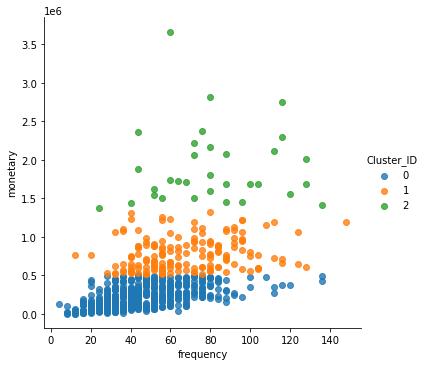

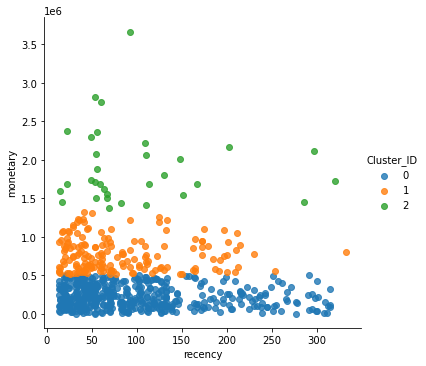

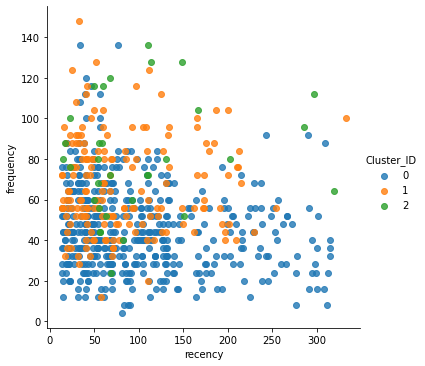

In [189]:
# Create a plot for frequency vs monetary 
facet = sns.lmplot(data=X1, x='frequency', y='monetary', hue='Cluster_ID', 
                   fit_reg=False, legend=True, legend_out=True)
# Create a plot for recency vs monetary
facet2 = sns.lmplot(data=X1, x='recency', y='monetary', hue='Cluster_ID', 
                   fit_reg=False, legend=True, legend_out=True)
# Create a plot for recency vs frequency
facet2 = sns.lmplot(data=X1, x='recency', y='frequency', hue='Cluster_ID', 
                   fit_reg=False, legend=True, legend_out=True)

#### If we compare the above plots with the unclean rfm data than, here in clean rfm data it is better than unclean data for monetary&recency and monetary&frequency we can clearly see all three clusters which was same for unclean data but here since outliers are not their center of cluster's are more precise.For frequqncy&recency comparatively it is better than unclean data but still here it is overlapping clusters which says that clusters are not clearly indentifiable.

### Cluster = 4 For Clean RFM

In [190]:
# Fitting K Means to the Datatset using k = 4

kmeans = KMeans(n_clusters = 4)
y_kmeans = kmeans.fit_predict(X1)

In [191]:
# Adding cluster ID to the dataframe
rfm_clean['Cluster_ID'] = y_kmeans

In [192]:
rfm_clean.head()

,recency,frequency,monetary,R,F,M,RFM Score,Cluster_ID
Customer ID,,,,,,,,
C00002,25,44,171626,5,2,2,522,1
C00003,101,40,446520,2,2,4,224,3
C00004,67,72,1507977,3,4,5,345,2
C00005,47,80,631881,4,5,4,454,3
C00006,41,100,476593,4,5,4,454,3


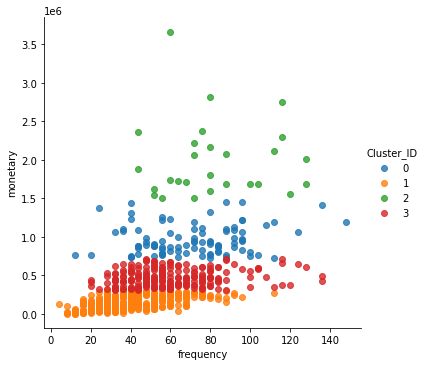

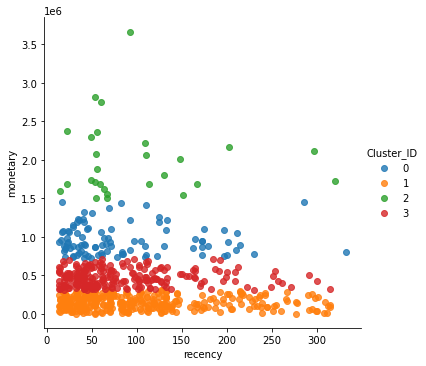

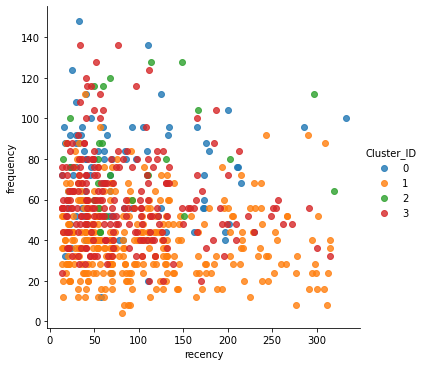

In [193]:
# Create a plot for frequency vs monetary 
facet = sns.lmplot(data=X1, x='frequency', y='monetary', hue='Cluster_ID', 
                   fit_reg=False, legend=True, legend_out=True)
# Create a plot for recency vs monetary
facet2 = sns.lmplot(data=X1, x='recency', y='monetary', hue='Cluster_ID', 
                   fit_reg=False, legend=True, legend_out=True)
# Create a plot for recency vs frequency
facet2 = sns.lmplot(data=X1, x='recency', y='frequency', hue='Cluster_ID', 
                   fit_reg=False, legend=True, legend_out=True)

#### If we compare the above plots with the unclean rfm data than, There is no doubt in clean rfm data's clusters are better than unclean rfm data.Now if we look into it individually again for monetary&recency and monetary&frequency cluster looks very appropriate since each group of segment is clearly visible.But again in the case of frequency&recency clusters are overlapping on each other which indicates that either we decrease or increase number of cluster in order to get better group of segmentation.

#### If we compare cluster 3 vs 4 than, after understanding all plots cluster size should be 4 though in case of frequency&recency we should try more options to get better clustering or group of segments.

### Calculating mean for every cluster

In [194]:
for i in range(4): 
    rfm_clean_mean = rfm_clean.groupby(['Cluster_ID']).mean()

print(rfm_clean_mean)

               recency  frequency      monetary         R         F         M   RFM Score
Cluster_ID                                                                               
0           83.778947   71.031579  9.604337e+05  3.242105  3.894737  5.000000  368.157895
1           104.519520  40.744745  1.526377e+05  2.891892  2.168168  1.768769  312.639640
2           97.888889   81.925926  1.994353e+06  2.888889  4.296296  5.000000  336.851852
3           84.170404   60.179372  4.719455e+05  3.161435  3.331839  3.708520  353.170404


### Performing cluster analysis using hierarchical clustering with the cleaned rfm dataframe

In [195]:
# Import the libraries
import scipy.cluster.hierarchy as sch

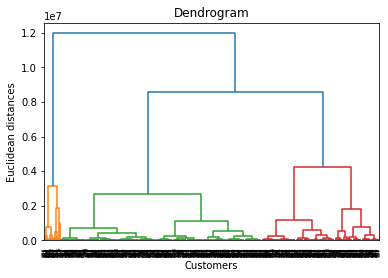

In [196]:
# Build a dendrogram using the minimum variance method
dendrogram = sch.dendrogram(sch.linkage(X1, method = 'ward'))
plt.title('Dendrogram')
plt.xlabel('Customers')
plt.ylabel('Euclidean distances')
plt.show()

#### So we identify the clusters based on dendrogram that are 2 clusters.

In [197]:
# Train the hierarchical clustering model on the dataset
from sklearn.cluster import AgglomerativeClustering
hc = AgglomerativeClustering(n_clusters = 2, affinity = 'euclidean', linkage = 'ward')
y_hc = hc.fit_predict(X1)

In [198]:
X1['Cluster_ID'] = y_hc

In [199]:
X1.head()

,recency,frequency,monetary,R,F,M,RFM Score,Cluster_ID
Customer ID,,,,,,,,
C00002,25,44,171626,5,2,2,522,0
C00003,101,40,446520,2,2,4,224,0
C00004,67,72,1507977,3,4,5,345,1
C00005,47,80,631881,4,5,4,454,0
C00006,41,100,476593,4,5,4,454,0


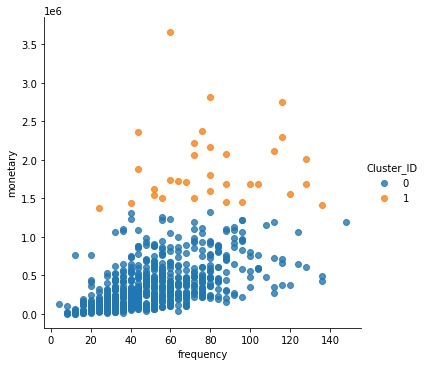

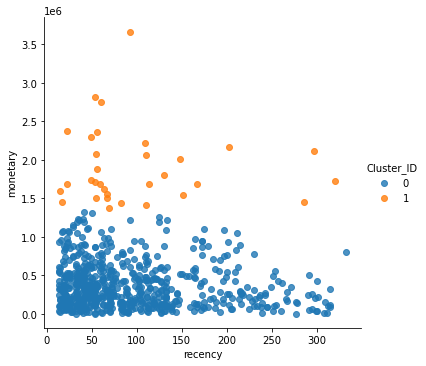

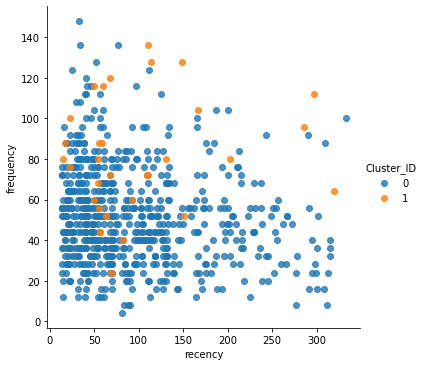

In [200]:
# Create a plot for frequency vs monetary 
facet = sns.lmplot(data=X1, x='frequency', y='monetary', hue='Cluster_ID', 
                   fit_reg=False, legend=True, legend_out=True)
# Create a plot for recency vs monetary
facet2 = sns.lmplot(data=X1, x='recency', y='monetary', hue='Cluster_ID', 
                   fit_reg=False, legend=True, legend_out=True)
# Create a plot for recency vs frequency
facet2 = sns.lmplot(data=X1, x='recency', y='frequency', hue='Cluster_ID', 
                   fit_reg=False, legend=True, legend_out=True)

#### We can say that there not a big differences in this base but we can say that hierarchical method gives us a better insights of the clusters by dendrogram and also we can say that while we take 2 clusters in the hierarchical method it gives the same results. Our evaluation from looking at dendrogram also indicates towards 2 clusters only.

### Evaluating Clustering

In [201]:
# Import libraries
from sklearn import cluster
from sklearn import metrics

In [202]:
# Calculate Silhouette score for different cluster values
krange = list(range(2,5))
avg_silhouettes = []
for n in krange:
  model = cluster.KMeans(n_clusters=n, random_state=10)
  cluster_assignments = model.fit_predict(X1)

  silhouette_avg = metrics.silhouette_score(X1, cluster_assignments)
  avg_silhouettes.append(silhouette_avg)

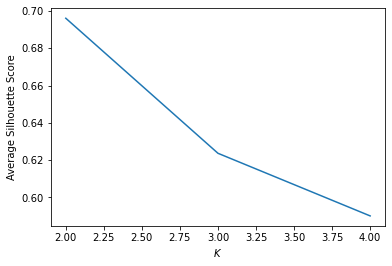

In [203]:
# PLot the score
plt.plot(krange, avg_silhouettes)
plt.xlabel("$K$")
plt.ylabel("Average Silhouette Score")
plt.show()

**The evaluation of cluster also shows us that best value for K that is number of clusters should be 3 only.**

## Conclusion:

<p>Concluding the RFM Analysis we understand that number of Clusters that we have to consider is <b>K=3</b> which is giving us appropiate results, If we talk about the Recency and Frequency then we have to dig more for it as the there is really very less distance between the data points hence this is one thing we need to dig upn more into the future.</p>

<p style="font-size:30px;">Sales Forecasting Using Time Series Analysis</p>

In [204]:
# Importing required libraries
from sklearn.metrics import mean_squared_error
from sklearn.metrics import mean_absolute_error
from math import sqrt
from statsmodels.tsa.api import ExponentialSmoothing, SimpleExpSmoothing, Holt
import sklearn.metrics as metrics
import statsmodels.api as sm
import itertools
from statsmodels.graphics.tsaplots import plot_pacf
from statsmodels.graphics.tsaplots import plot_acf
from statsmodels.tsa.statespace.sarimax import SARIMAX
from statsmodels.tsa.holtwinters import ExponentialSmoothing
from statsmodels.tsa.stattools import adfuller
from tqdm import tqdm_notebook
from itertools import product

In [205]:
sf_titan_sales = titan_sales[['Order Date','Sales']]

In [206]:
sf_titan_sales.info()

<class 'pandas.core.frame.DataFrame'>
Int64Index: 159888 entries, 0 to 159887
Data columns (total 2 columns):
 #   Column      Non-Null Count   Dtype         
---  ------      --------------   -----         
 0   Order Date  159888 non-null  datetime64[ns]
 1   Sales       159888 non-null  int64         
dtypes: datetime64[ns](1), int64(1)
memory usage: 8.7 MB


In [207]:
sf_titan_sales.describe()

,Sales
count,1.598880e+05
mean,3.193026e+03
std,1.881989e+04
min,1.000000e+00
25%,8.800000e+01
50%,3.400000e+02
75%,1.480000e+03
max,1.960000e+06


In [208]:
sf_titan_sales.head()

,Order Date,Sales
0,2018-11-08,262
1,2018-11-11,15720
2,2019-05-01,314
3,2019-05-01,440
4,2019-05-04,25120


In [209]:
sf_titan_sales.set_index('Order Date', inplace=True)

In [210]:
sf_titan_sales.head

<bound method NDFrame.head of               Sales
Order Date         
2018-11-08  262    
2018-11-11  15720  
2019-05-01  314    
2019-05-01  440    
2019-05-04  25120  
2019-05-04  35200  
2019-08-25  131    
2019-08-25  183    
2019-08-28  7860   
2019-08-28  10980  
2018-04-09  557    
2018-04-09  780    
2018-04-12  44560  
2018-04-12  62400  
2018-11-10  655    
2018-04-12  1393   
2019-08-27  328    
2019-05-03  785    
2018-04-12  1950   
2019-08-27  459    
2019-05-03  1099   
2018-11-06  1441   
2018-04-06  3064   
2019-08-23  721    
2019-04-29  1727   
2018-04-06  4289   
2019-08-23  1009   
2019-04-29  2418   
2018-10-29  983    
2018-03-29  2089   
2019-08-15  491    
2019-04-21  1178   
2018-03-29  2924   
2019-08-15  688    
2019-04-21  1649   
2018-11-13  1179   
2018-04-15  2507   
2019-08-30  590    
2019-05-06  1413   
2018-04-15  3509   
2019-08-30  825    
2019-05-06  1978   
2018-11-21  1179   
2018-04-24  2507   
2019-09-07  590    
2019-05-14  1413   
2018-04-24

In [211]:
# Calculate Z scores to normalize the data
from scipy import stats
import numpy as np
z = np.abs(stats.zscore(sf_titan_sales))
print(z)

[[0.15574135]
 [0.66562613]
 [0.15297831]
 ...
 [0.09431679]
 [0.05010812]
 [0.00228623]]


In [212]:
sf_titan_sales.shape

(159888, 1)

In [213]:
sf_titan_sales_clean = sf_titan_sales[(z < 3).all(axis=1)]

In [214]:
sf_titan_sales_clean.shape

(158556, 1)

<AxesSubplot:>

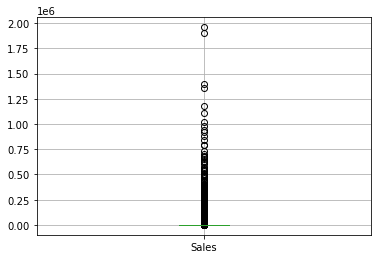

In [215]:
sf_titan_sales.boxplot()

<AxesSubplot:>

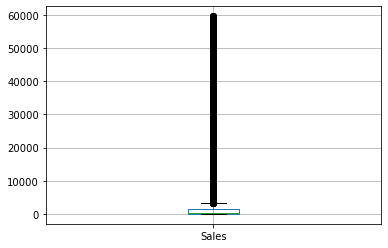

In [216]:
sf_titan_sales_clean.boxplot()

In [217]:
sf_titan_sales_clean_resampled_1 = sf_titan_sales_clean.resample('D').sum()

sf_titan_sales_clean_resampled = sf_titan_sales_clean_resampled_1.resample('W').mean()

In [218]:
sf_titan_sales_clean_resampled.head()

,Sales
Order Date,
2015-12-27,10670.250000
2016-01-03,7461.142857
2016-01-10,66752.285714
2016-01-17,69900.714286
2016-01-24,86994.142857


In [219]:
sf_titan_sales_clean_resampled.shape

(213, 1)

In [220]:
sf_titan_sales = sf_titan_sales_clean_resampled.copy()

### Simple Moving Average

In [221]:
# Moving Average Method
sf_titan_sales_MA = sf_titan_sales

**Here we have shown Moving Average over a period of 5**

In [222]:
sf_titan_sales_MA['SimMovingAvg_5'] = sf_titan_sales_MA.Sales.rolling(5, min_periods=1).mean()

In [223]:
sf_titan_sales_MA.head()

,Sales,SimMovingAvg_5
Order Date,,
2015-12-27,10670.250000,10670.250000
2016-01-03,7461.142857,9065.696429
2016-01-10,66752.285714,28294.559524
2016-01-17,69900.714286,38696.098214
2016-01-24,86994.142857,48355.707143


**Plotting the Trend of the Moving Average**

Text(0, 0.5, 'Sales')

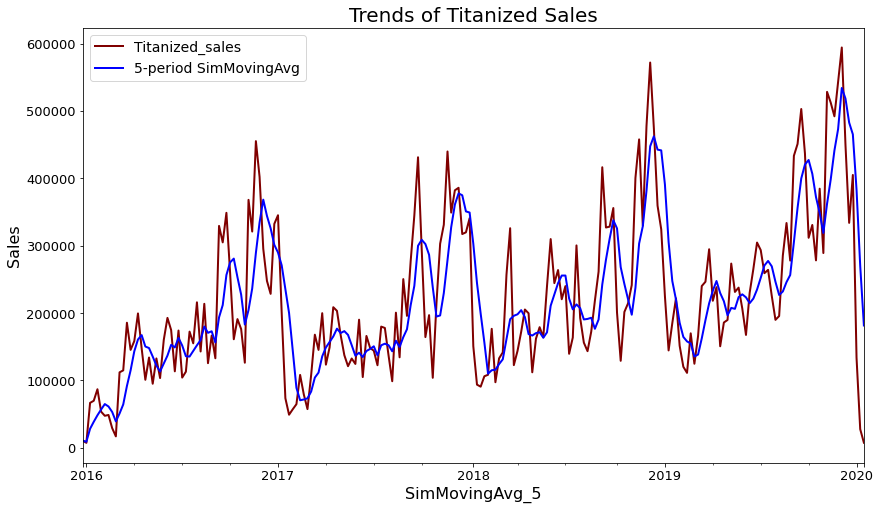

In [224]:
# colors for the line plot
colors = ['maroon', 'blue']

# line plot for demand
sf_titan_sales_MA.plot(color=colors, linewidth=2, figsize=(14,8))

# modify ticks size
plt.xticks(fontsize=13)
plt.yticks(fontsize=13)
plt.legend(labels =['Titanized_sales', '5-period SimMovingAvg'], fontsize=14)
plt.gcf().axes[0].yaxis.get_major_formatter().set_scientific(False)

# title and labels
plt.title('Trends of Titanized Sales', fontsize=20)
plt.xlabel('SimMovingAvg_5', fontsize=16)
plt.ylabel('Sales', fontsize=16)

In [225]:
sf_titan_sales_MA['Error']=sf_titan_sales_MA['Sales']-sf_titan_sales_MA['SimMovingAvg_5']

In [226]:
sf_titan_sales_MA.head()

,Sales,SimMovingAvg_5,Error
Order Date,,,
2015-12-27,10670.250000,10670.250000,0.000000
2016-01-03,7461.142857,9065.696429,-1604.553571
2016-01-10,66752.285714,28294.559524,38457.726190
2016-01-17,69900.714286,38696.098214,31204.616071
2016-01-24,86994.142857,48355.707143,38638.435714


**KPI Calculation for Moving Average**

In [227]:
MAE = sf_titan_sales_MA['Error'].abs().mean()
print("MAE:",round(MAE,2))

RMSE = np.sqrt((sf_titan_sales_MA['Error']**2).mean())
print("RMSE:",round(RMSE,2))

MSE = (sf_titan_sales_MA['Error']**2).mean()
print("MSE:",round(MSE,2))

MAE: 56091.44
RMSE: 74078.34
MSE: 5487601102.91


### Simple Exponential Smoothing

**As all the data is same, after calculating the Moving Average,
we need to drop the below columns and add the data into new dataframe as shown below.**

In [228]:
# Simple Exponential Smoothing Method 
sf_titan_sales_SES = sf_titan_sales_clean_resampled.copy()

In [229]:
sf_titan_sales_SES

,Sales
Order Date,
2015-12-27,10670.250000
2016-01-03,7461.142857
2016-01-10,66752.285714
2016-01-17,69900.714286
2016-01-24,86994.142857
2016-01-31,53664.571429
2016-02-07,47602.428571
2016-02-14,48799.285714
2016-02-21,29268.142857


**Here we will take a period of 5 and Alpha value 0.3**

In [230]:
# Define SES by the Excel Method of calculation:

def simple_exp_smooth(d,extra_periods,alpha):  

  d = np.array(d)  # Transform the input into a numpy array  
  cols = len(d)  # Historical period length  
  d = np.append(d,[np.nan]*extra_periods)  # Append np.nan into the demand array to cover future periods  
  
  f = np.full(cols+extra_periods,np.nan)  # Forecast array  
  f[0] = d[0]  # initialization of first forecast  


  # Create all the t+1 forecasts until end of historical period  
  for t in range(1,cols+1):  

    f[t] = alpha*d[t-1]+(1-alpha)*f[t-1]  
    f[cols+1:] = f[t]  # Forecast for all extra periods  

  sf_titan_sales_SES = pd.DataFrame.from_dict({"Sales":d,"Forecast":f,"SES_Error":(f-d)})

  return sf_titan_sales_SES

In [231]:
Titanized_sales_SES=simple_exp_smooth(sf_titan_sales_SES,5,alpha=0.3)

In [232]:
Titanized_sales_SES

,Sales,Forecast,SES_Error
0,10670.250000,10670.250000,0.000000
1,7461.142857,10670.250000,3209.107143
2,66752.285714,9707.517857,-57044.767857
3,69900.714286,26820.948214,-43079.766071
4,86994.142857,39744.878036,-47249.264821
5,53664.571429,53919.657482,255.086054
6,47602.428571,53843.131666,6240.703095
7,48799.285714,51970.920738,3171.635023
8,29268.142857,51019.430231,21751.287374
9,17019.285714,44494.044019,27474.758304


**KPI Calculation for Simple Exponential Smoothing**

In [233]:
MAE = Titanized_sales_SES['SES_Error'].abs().mean()
print("MAE:",round(MAE,2))

RMSE = np.sqrt((Titanized_sales_SES['SES_Error']**2).mean())
print("RMSE:",round(RMSE,2))

MSE = (Titanized_sales_SES['SES_Error']**2).mean()
print("MSE:",round(MSE,2))

MAE: 65446.89
RMSE: 87203.09
MSE: 7604379180.52


**Plotting Time Series for Simple Exponential Smoothing**

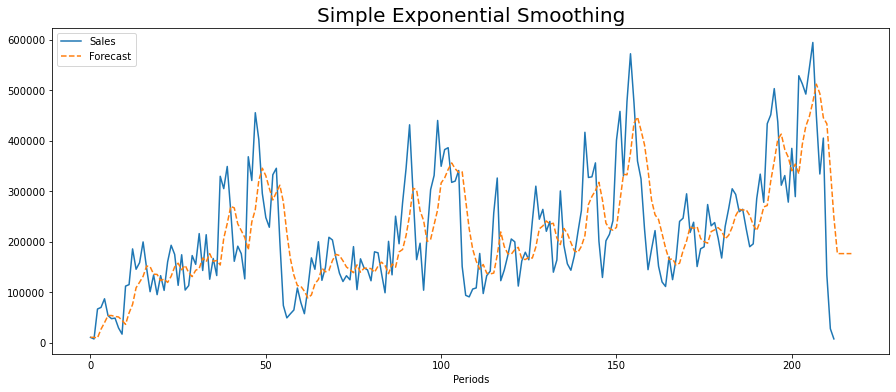

In [234]:
Titanized_sales_SES.index.name = "Periods"
Titanized_sales_SES[["Sales","Forecast"]].plot(figsize=(15,6),style=["-","--"]) 
plt.gcf().axes[0].yaxis.get_major_formatter().set_scientific(False) 
plt.title('Simple Exponential Smoothing',fontsize=20)
plt.show()

### Double Exponential Smoothing (Holt)

**Here we will take a period of 3, Alpha value 0.3 and Beta value 0.4**

In [235]:
# Double Exponential Smoothing Method 
sf_titan_sales_DES = sf_titan_sales_clean_resampled

In [236]:
def double_exp_smooth(d,extra_periods,alpha,beta):  

    d = np.array(d)  # Transform the input into a numpy array  
    cols = len(d)  # Historical period length  
    d = np.append(d,[np.nan]*extra_periods)  # Append np.nan into the demand array to cover future periods  

# Creation of the level, trend, and forecast arrays
    f= np.full(cols+extra_periods,np.nan)  # Forecast array  
    a = np.full(cols+extra_periods,np.nan)
    b = np.full(cols+extra_periods,np.nan)

# Level and trend initialization 
    a[0] = d[0]
    b[0] = d[0] -d[1]
  
# Create all the t+1 forecasts until end of historical period
    for t in range(1,cols):  
        f[t] = a[t-1]+ b[t-1]
        a[t] = alpha*d[t] + (1-alpha)*(a[t-1] + b[t-1])
        b[t] = beta*(a[t] - a[t-1]) + (1-beta)* b[t-1]

# Forecast for all extra periods  
    for t in range(cols, cols+extra_periods):
        f[t] = a[t-1] + b[t-1]
        a[t] = f[t]
        b[t] = b[t-1]
    sf_titan_sales_DES = pd.DataFrame.from_dict({"Sales":d,"Forecast":f,"Level": a, "Trend": b, "DES_Error":f-d}) 
    return sf_titan_sales_DES

In [237]:
Titanized_sales_DES=double_exp_smooth(sf_titan_sales_DES,5,alpha=0.3, beta=0.4)

In [238]:
Titanized_sales_DES

,Sales,Forecast,Level,Trend,DES_Error
0,10670.250000,NaN,10670.250000,3209.107143,NaN
1,7461.142857,13879.357143,11953.892857,2438.921429,6418.214286
2,66752.285714,14392.814286,30100.655714,8722.058000,-52359.471429
3,69900.714286,38822.713714,48146.113886,12451.418069,-31078.000571
4,86994.142857,60597.531954,68516.515225,15619.011377,-26396.610903
5,53664.571429,84135.526602,74994.240050,11962.496756,30470.955173
6,47602.428571,86956.736806,75150.444336,7239.979768,39354.308235
7,48799.285714,82390.424104,72313.082587,3209.043161,33591.138389
8,29268.142857,75522.125748,61645.930881,-2341.434786,46253.982891
9,17019.285714,59304.496095,46618.932981,-7415.660031,42285.210381


**KPI Calculation for Double Exponential Smoothing**

In [239]:
MAE = Titanized_sales_DES['DES_Error'].abs().mean()
print("MAE:",round(MAE,2))

RMSE = np.sqrt((Titanized_sales_DES['DES_Error']**2).mean())
print("RMSE:",round(RMSE,2))

MSE = (Titanized_sales_DES['DES_Error']**2).mean()
print("MSE:",round(MSE,2))

MAE: 81070.49
RMSE: 102494.12
MSE: 10505044725.85


**Plotting Time Series for Double Exponential Smoothing**

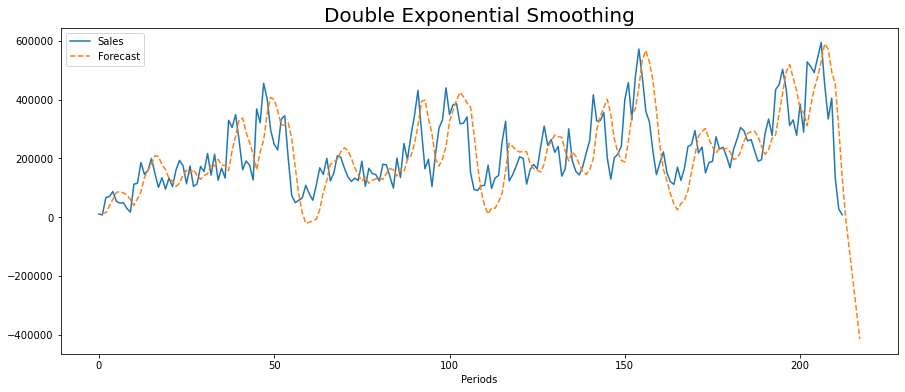

In [240]:
Titanized_sales_DES.index.name = "Periods"
Titanized_sales_DES[["Sales","Forecast"]].plot(figsize=(15,6),style=["-","--"]) 
plt.title('Double Exponential Smoothing', fontsize=20)
plt.show()

### Triple Exponential Smoothing

In [241]:
# Triple Exponential Smoothing Method 
sf_titan_sales_TES = sf_titan_sales_clean_resampled.copy()

In [242]:
#Check the Shape
sf_titan_sales_TES.shape

(213, 1)

In [243]:
#Check the Data partially by dividing it into Train and Test Data
Train_Data = sf_titan_sales_TES[0:-70]
Test_Data = sf_titan_sales_TES[-70:] 

print(Train_Data.shape)
print(Test_Data.shape)

(143, 1)
(70, 1)


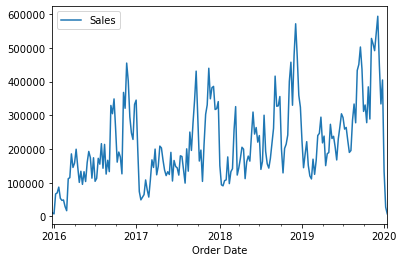

In [244]:
sf_titan_sales_TES.plot()
plt.show()

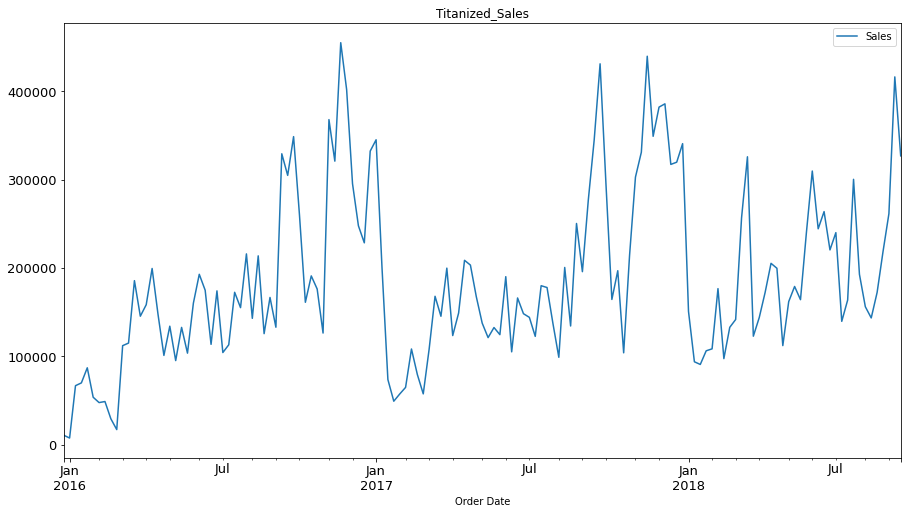

In [245]:
#Plotting Train data
Train_Data.plot(figsize=(15,8), title= 'Titanized_Sales', fontsize=13)
plt.show()

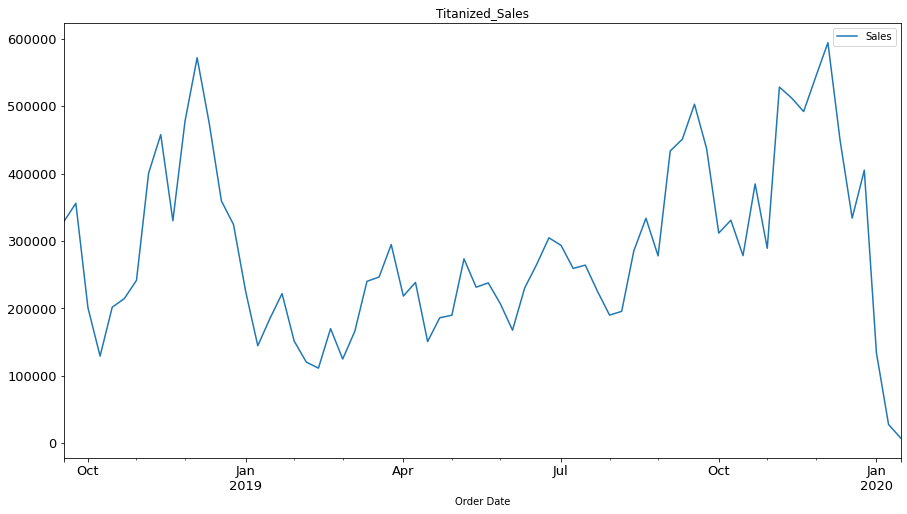

In [246]:
#Plotting Test data
Test_Data.plot(figsize=(15,8), title= 'Titanized_Sales', fontsize=13)
plt.show()

#### **Here we will take a period of 5, Alpha value 0.3, Beta value 0.4, and seasonal period as 12m**

C:\Users\modiv\Anaconda3_2019_10\envs\DAB402W21\lib\site-packages\statsmodels\tsa\holtwinters\model.py:922: ConvergenceWarning: Optimization failed to converge. Check mle_retvals.
  ConvergenceWarning,


MAE 362,597.82
MSE 160,396,023,232.82
RMSE 400,494.72


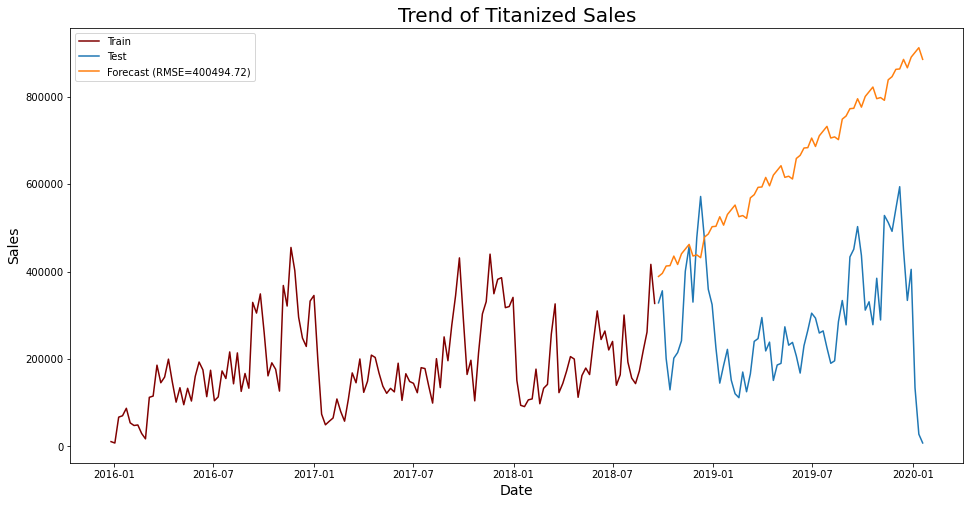

In [247]:
#Triple exponential smoothing
pred = Test_Data.copy()
fit1 = ExponentialSmoothing(np.asarray(Train_Data['Sales']) ,seasonal_periods=12 ,trend='add', seasonal='add').fit()
pred['forecast'] = fit1.forecast(len(Test_Data))

# Calculate KPI's
MAE = mean_absolute_error(Test_Data.Sales, pred.forecast)
MSE = mean_squared_error(Test_Data.Sales, pred.forecast)
RMSE = sqrt(mean_squared_error(Test_Data.Sales, pred.forecast))
print("MAE {:,.2f}".format(MAE))
print("MSE {:,.2f}".format(MSE))
print("RMSE {:,.2f}".format(RMSE))

# Plotting graph
plt.figure(figsize=(16,8))
plt.plot( Train_Data['Sales'], color='maroon', label='Train')
plt.plot(Test_Data['Sales'], label='Test')
plt.plot(pred['forecast'], label='Forecast (RMSE={:.2f})'.format(RMSE))

#set labels, title, legend and show plot
plt.xlabel('Date', fontsize=14)
plt.ylabel('Sales', fontsize=14)
plt.title('Trend of Titanized Sales', fontsize=20)
plt.legend()
plt.show()


#### When a comparison is made between all the three Exponential Smoothning Methods, we observed that the sales prediction for **Triple exponential smoothning** is a rising positive slope in an upward directions with a repeated pattern.

#### Whereas, the **Simple exponential smoothning** is showing that the predictions are increased compare to the actual data and are experiencing a stability.

#### However, for **Double exponential smoothning** The forecasted predictions of Sales are dropping darstically. 

#### So, we can **conclude** from the above comparision of all three methods that, **Triple Exponential Smoothning** is the **Best fitted Model** for our future Sales Forecasting. However, Double Exponential Smoothning has the worst performance.

In [248]:
# creating a dataframe for all resultsb

# Creating the list
data = {'Index':['Moving Average', 'Single Exponential Smoothing', 'Double Exponential Smoothing', 'Triple Exponential Smoothing'],
        'RMSE':[74078.34, 87203.09, 102494.12, 400494.72],
        'MAE':[56091.44,65446.89,81070.49,362597.82]}

# Create DataFrame
result = pd.DataFrame(data)

result

,Index,RMSE,MAE
0,Moving Average,74078.34,56091.44
1,Single Exponential Smoothing,87203.09,65446.89
2,Double Exponential Smoothing,102494.12,81070.49
3,Triple Exponential Smoothing,400494.72,362597.82


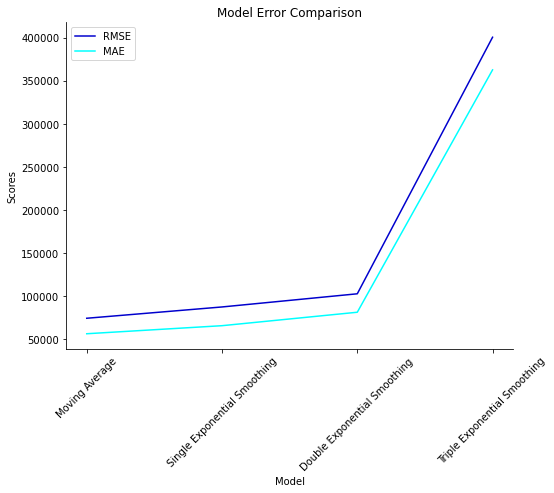

In [249]:
# plotting results to make comparison

fig, ax = plt.subplots(figsize=(8, 6))
sns.lineplot(np.arange(len(result)), 'RMSE', data=result, ax=ax,label='RMSE', color='mediumblue')
sns.lineplot(np.arange(len(result)), 'MAE', data=result, ax=ax,label='MAE', color='Cyan')
plt.xticks(np.arange(len(result)), rotation=45)
ax.set_xticklabels(result['Index'])
ax.set(xlabel="Model",ylabel="Scores",title="Model Error Comparison")
sns.despine()

### SARIMA Model

In [250]:
sf_titan_sales_SARIMA = sf_titan_sales_clean_resampled.copy()

In [251]:
#Head for the Dataset
sf_titan_sales_SARIMA.head()

,Sales
Order Date,
2015-12-27,10670.250000
2016-01-03,7461.142857
2016-01-10,66752.285714
2016-01-17,69900.714286
2016-01-24,86994.142857


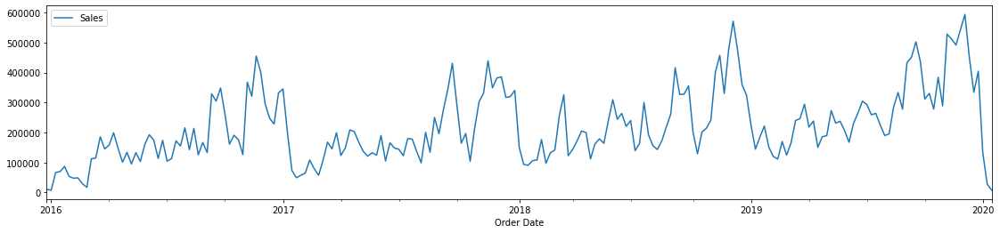

In [252]:
#Plot the Sales Data
sf_titan_sales_SARIMA.plot(figsize=(19, 4))
plt.show()

  - Analysing the chart, we observe that the Time-Series has Seasonality pattern. Moreover, an upward Trend is measured over the time.
  
  - Plotting the Diagnostics and Studying the Residuals:

  - By using the 'sm.tsa.seasonal_decompose' command we can decompose Time-Series into three distinct components: 
    -  **Trend**
    - **Seasonality**
    - **Noise**

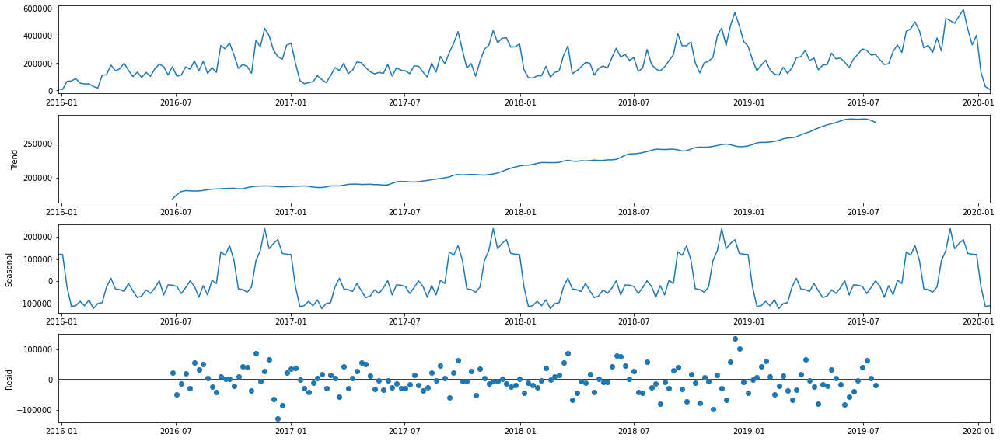

In [253]:
from pylab import rcParams
rcParams['figure.figsize'] = 18, 8
decomposition = sm.tsa.seasonal_decompose(sf_titan_sales_SARIMA, model='additive')
fig = decomposition.plot()
plt.show()

#### **Visualize the Data by checking the Stationarity and Seasonality of Data:**

In [254]:
#Ho: It is non stationary
#H1: It is station

def adfuller_test(sales):
    result=adfuller(sales)
    labels = ['ADF Test Statistic','p-value','#Lags Used','Number of Observations Used']
    for value,label in zip(result,labels):
        print(label+' : '+str(value) )
    
    if result[1] <= 0.05:
        print("Strong evidence against the Null Hypothesis(Ho), Time Series Data has no unit root.")
        print("Reject Null Hypothesis - Data is Stationary")

    else:
        print("Weak evidence against Null Hypothesis(H1), Time Series Data has a unit root.")
        print("Accept Null Hypothesis - Data is not Stationary")

In [255]:
adfuller_test(sf_titan_sales_SARIMA['Sales'])

ADF Test Statistic : -4.821610277597352
p-value : 4.9438778032119244e-05
#Lags Used : 0
Number of Observations Used : 212
Strong evidence against the Null Hypothesis(Ho), Time Series Data has no unit root.
Reject Null Hypothesis - Data is Stationary


#### **Checking the AIC Best fitting values for SARIMA Model**

In [256]:
#The samples of SARIMA AIC Combinations:

p = d = q = range(0, 2)
pdq = list(itertools.product(p, d, q))
seasonal_pdq = [(x[0], x[1], x[2], 12) for x in list(itertools.product(p, d, q))]

for param in pdq:
    for param_seasonal in seasonal_pdq:
        try:
            mod = sm.tsa.statespace.SARIMAX(sf_titan_sales_SARIMA['Sales'],order=param,seasonal_order=param_seasonal,enforce_stationarity=False,enforce_invertibility=False)
            results = mod.fit()
            print('ARIMA{}x{}12 - AIC:{}'.format(param,param_seasonal,results.aic))
        except: 
            continue

ARIMA(0, 0, 0)x(0, 0, 0, 12)12 - AIC:5873.761169960402
ARIMA(0, 0, 0)x(0, 0, 1, 12)12 - AIC:5474.393794719592
ARIMA(0, 0, 0)x(0, 1, 0, 12)12 - AIC:5306.881595759603
ARIMA(0, 0, 0)x(0, 1, 1, 12)12 - AIC:4956.039647675655


C:\Users\modiv\Anaconda3_2019_10\envs\DAB402W21\lib\site-packages\statsmodels\base\model.py:568: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  ConvergenceWarning)


ARIMA(0, 0, 0)x(1, 0, 0, 12)12 - AIC:5331.333917361068
ARIMA(0, 0, 0)x(1, 0, 1, 12)12 - AIC:5269.097026065612
ARIMA(0, 0, 0)x(1, 1, 0, 12)12 - AIC:4992.8603366228135
ARIMA(0, 0, 0)x(1, 1, 1, 12)12 - AIC:4956.71814222081
ARIMA(0, 0, 1)x(0, 0, 0, 12)12 - AIC:5711.961174188534
ARIMA(0, 0, 1)x(0, 0, 1, 12)12 - AIC:5366.05346313349
ARIMA(0, 0, 1)x(0, 1, 0, 12)12 - AIC:5190.107845620836
ARIMA(0, 0, 1)x(0, 1, 1, 12)12 - AIC:4848.177487961486
ARIMA(0, 0, 1)x(1, 0, 0, 12)12 - AIC:5399.925477399855
ARIMA(0, 0, 1)x(1, 0, 1, 12)12 - AIC:5340.998813644248
ARIMA(0, 0, 1)x(1, 1, 0, 12)12 - AIC:4908.745754129761
ARIMA(0, 0, 1)x(1, 1, 1, 12)12 - AIC:4850.173098949981
ARIMA(0, 1, 0)x(0, 0, 0, 12)12 - AIC:5336.82376525315
ARIMA(0, 1, 0)x(0, 0, 1, 12)12 - AIC:5043.6364702046485
ARIMA(0, 1, 0)x(0, 1, 0, 12)12 - AIC:5162.936086012332
ARIMA(0, 1, 0)x(0, 1, 1, 12)12 - AIC:4752.258458098078
ARIMA(0, 1, 0)x(1, 0, 0, 12)12 - AIC:5068.0601491164025
ARIMA(0, 1, 0)x(1, 0, 1, 12)12 - AIC:5045.534423436762
ARIMA(0, 1

#### **AIC value selection**

  - According to Peterson T.(2014) the AIC(Akaike information criterion) is an estimator of relative quality of Statistical Model for a given Dataset.

  - The Lower the value of AIC, the better the combination. So our above output suggests us the best value of:
**ARIMA(1, 1, 1)x(0, 1, 1, 12)12 - AIC:4740.841**, as our best combination amongst all in the listing.


  - As we checked before, the best fitted value for SARIMA Model is: 
**SARIMA(1, 1, 1)x(0, 1, 1, 12)**.

  - Now lets use SARIMA Model of Time Series Forecasting to see the best model summary below:



In [257]:
#SARIMA Model
mod = sm.tsa.statespace.SARIMAX(sf_titan_sales_SARIMA['Sales'],
                                order=(1, 1, 1),
                                seasonal_order=(0, 1, 1, 12),
                                enforce_stationarity=False,
                                enforce_invertibility=False)
best_model = mod.fit()
print(best_model.summary())


                                     SARIMAX Results                                      
Dep. Variable:                              Sales   No. Observations:                  213
Model:             SARIMAX(1, 1, 1)x(0, 1, 1, 12)   Log Likelihood               -2366.420
Date:                            Fri, 23 Apr 2021   AIC                           4740.841
Time:                                    00:41:59   BIC                           4753.744
Sample:                                12-27-2015   HQIC                          4746.069
                                     - 01-19-2020                                         
Covariance Type:                              opg                                         
                 coef    std err          z      P>|z|      [0.025      0.975]
------------------------------------------------------------------------------
ar.L1          0.7541      0.111      6.817      0.000       0.537       0.971
ma.L1         -0.9687      0.063   

#### Plotting the Diagnostics and studying the residuals:

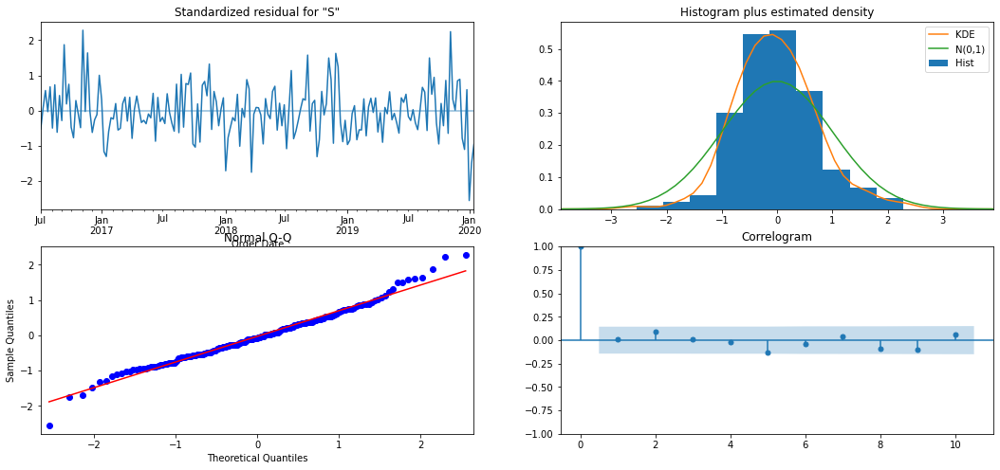

In [258]:
best_model.plot_diagnostics(figsize=(18, 8))
plt.show()

  - From the normal Q-Q plot, we can see that we almost have a straight line, which suggest no systematic departure from normality. Also, the correlogram on the bottom right suggests that there is no autocorrelation in the residuals, and so they are effectively white noise.

  - Value near to 1 demonstrate **Strongest Correlation**.

  - Here, we'll just have a look at one-step ahead forecasting graph for our Data:
  

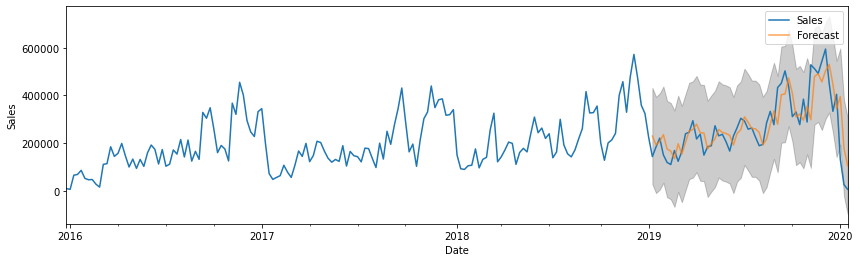

In [259]:
pred = best_model.get_prediction(start=pd.to_datetime('2019-01-13'), dynamic=False)
pred_ci = pred.conf_int()
ax = sf_titan_sales_SARIMA['2015':].plot(label='observed')
pred.predicted_mean.plot(ax=ax, label='Forecast', alpha=.7, figsize=(14, 4))
ax.fill_between(pred_ci.index,
                pred_ci.iloc[:, 0],
                pred_ci.iloc[:, 1], color='k', alpha=.2)
ax.set_xlabel('Date')
ax.set_ylabel('Sales')
plt.legend()
plt.show()

    - Now, further we will make future prediction of the Sales for 12 steps ahead the actual Data.

In [260]:
#Forecasting for 12 steps ahead
forecast_values =  best_model.get_forecast(steps=12)

#Confidence Intervals of the forecasted values
forecast_ci = forecast_values.conf_int()

#Prediction Summary for Forecasting
forecast_values.summary_frame()

Sales,mean,mean_se,mean_ci_lower,mean_ci_upper
2020-01-26,67272.195730,102645.936964,-133910.143880,268454.535339
2020-02-02,120285.785466,130946.352394,-136364.349133,376935.920065
2020-02-09,158622.860578,146289.756160,-128099.792803,445345.513959
2020-02-16,210090.098266,155629.631601,-94938.374598,515118.571130
2020-02-23,227544.702247,161764.754562,-89508.390661,544597.795156
2020-03-01,243982.343452,166008.759207,-81388.845713,569353.532616
2020-03-08,247481.532749,169089.456432,-83927.712023,578890.777521
2020-03-15,279864.310813,171429.204724,-56130.756344,615859.377970
2020-03-22,287238.703095,173283.933609,-52391.565878,626868.972069
2020-03-29,298947.829118,174814.223500,-43681.752928,641577.411164


 - In the above table, we can visualize the lower and upper values which the model indicate as boundaries for the forecasting.

#### Plot the forecasted values and confidence intervals data to observe the future predictions:

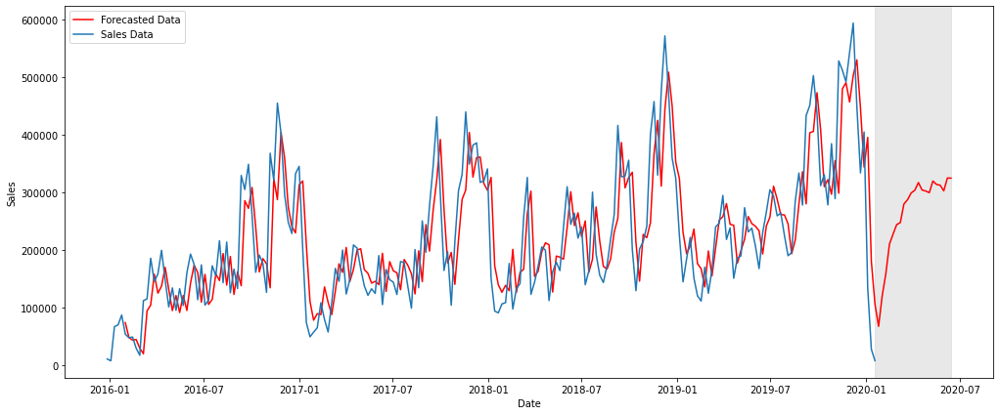

In [261]:
sf_titan_sales_SARIMA['arima_model'] = best_model.fittedvalues
sf_titan_sales_SARIMA['arima_model'][:4+1] = np.NaN
forecast = best_model.predict(start=sf_titan_sales_SARIMA.shape[0], end=sf_titan_sales_SARIMA.shape[0] + 20)
forecast = sf_titan_sales_SARIMA['arima_model'].append(forecast)
plt.figure(figsize=(17, 7))
plt.plot(forecast, color='r', label='Forecasted Data')
plt.axvspan(sf_titan_sales_SARIMA.index[-1], forecast.index[-1], alpha=0.5, color='lightgrey')
plt.plot(sf_titan_sales_SARIMA['Sales'], label='Sales Data')
plt.xlabel('Date')
plt.ylabel('Sales')
plt.legend()
plt.show()

## **Conclusion:**

For the above forecasted graph, there will be an increased seasonality of Sales for upcoming weeks. Here it is observed that, Forecasted Sales is increasing in a steady manner along with some fluctuation. 

# Facebook Prophet

In [262]:
# Importing Required Library

from pandas_datareader import data as wb
from fbprophet import Prophet
plt.style.use('fivethirtyeight')

In [263]:
# Prophet Method 
titan_sales_Prophet = sf_titan_sales_clean_resampled.copy()

In [264]:
# Add Two new columans ds & Y (closing price ( we will do forecasting on this price) for y and date for ds.)
Prophet_dataframe = titan_sales_Prophet.reset_index()
Prophet_dataframe[['ds', 'y']] = Prophet_dataframe[['Order Date','Sales']]
Prophet_dataframe

,Order Date,Sales,ds,y
0,2015-12-27,10670.250000,2015-12-27,10670.250000
1,2016-01-03,7461.142857,2016-01-03,7461.142857
2,2016-01-10,66752.285714,2016-01-10,66752.285714
3,2016-01-17,69900.714286,2016-01-17,69900.714286
4,2016-01-24,86994.142857,2016-01-24,86994.142857
5,2016-01-31,53664.571429,2016-01-31,53664.571429
6,2016-02-07,47602.428571,2016-02-07,47602.428571
7,2016-02-14,48799.285714,2016-02-14,48799.285714
8,2016-02-21,29268.142857,2016-02-21,29268.142857
9,2016-02-28,17019.285714,2016-02-28,17019.285714


In [265]:
model=Prophet()

In [266]:
# drop the columans
titan_sales_Prophet_dataframe = Prophet_dataframe.drop(['Order Date', 'Sales'], axis=1)

In [267]:
titan_sales_Prophet_dataframe

,ds,y
0,2015-12-27,10670.250000
1,2016-01-03,7461.142857
2,2016-01-10,66752.285714
3,2016-01-17,69900.714286
4,2016-01-24,86994.142857
5,2016-01-31,53664.571429
6,2016-02-07,47602.428571
7,2016-02-14,48799.285714
8,2016-02-21,29268.142857
9,2016-02-28,17019.285714


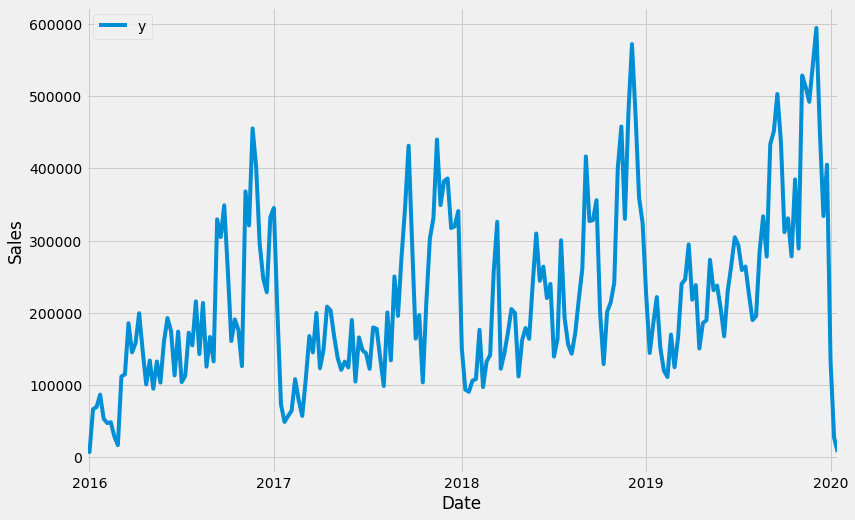

In [268]:
ax = titan_sales_Prophet_dataframe.set_index('ds').plot(figsize=(12, 8))
ax.set_ylabel('Sales')
ax.set_xlabel('Date')

plt.show()

In [269]:
model.fit(titan_sales_Prophet_dataframe)

INFO:fbprophet:Disabling weekly seasonality. Run prophet with weekly_seasonality=True to override this.
INFO:fbprophet:Disabling daily seasonality. Run prophet with daily_seasonality=True to override this.


In [270]:
future=model.make_future_dataframe(periods=165)

In [271]:
future.tail()

,ds
373,2020-06-28
374,2020-06-29
375,2020-06-30
376,2020-07-01
377,2020-07-02


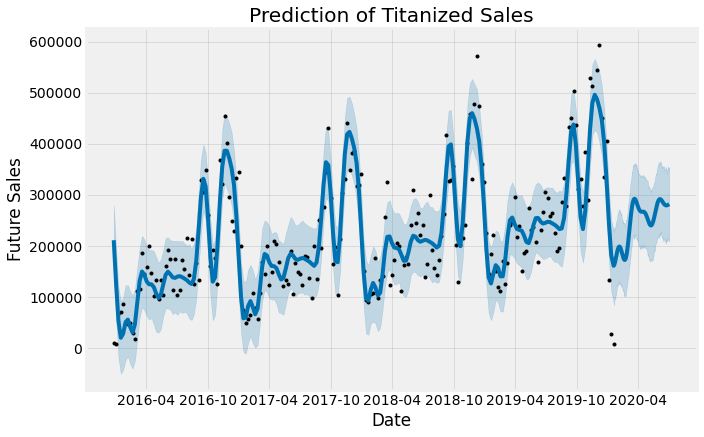

,ds,yhat,yhat_lower,yhat_upper
373,2020-06-28,280055.105810,215284.470664,355201.480975
374,2020-06-29,280421.211567,211029.658985,351282.215263
375,2020-06-30,280810.279286,210830.292907,348845.437069
376,2020-07-01,281204.731485,208595.802931,353992.047753
377,2020-07-02,281587.963445,211729.894720,351727.034632


In [272]:
predictions=model.predict(future)
model.plot(predictions)
plt.title("Prediction of Titanized Sales")
plt.xlabel("Date")
plt.ylabel("Future Sales")
plt.show()

predictions[['ds', 'yhat', 'yhat_lower', 'yhat_upper']].tail()

<Figure size 1152x1008 with 0 Axes>

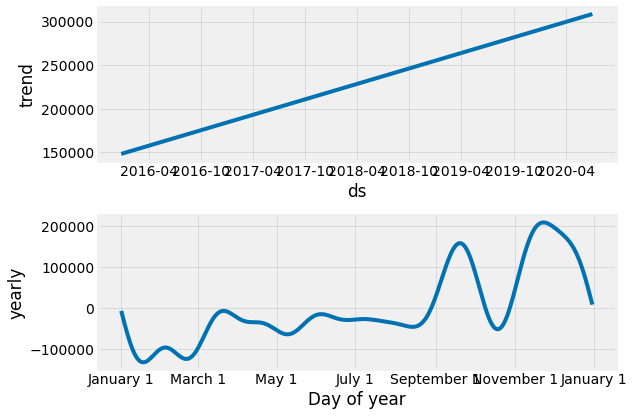

In [273]:
plt.figure(figsize=(16,14))
model.plot_components(predictions)
plt.show()

**From the above graph we can see that the data have no weekly seasonality. However, it have the Trend that shows the positively rising slope.**

In [275]:
predictions=model.predict(future)
predictions[['ds','yhat','yhat_lower','yhat_upper']]

,ds,yhat,yhat_lower,yhat_upper
0,2015-12-27,211103.779957,140054.064527,284773.952853
1,2016-01-03,127007.824241,59176.192122,204247.104974
2,2016-01-10,53588.654947,-18480.526144,124617.699614
3,2016-01-17,20121.983715,-47262.281125,92282.140604
4,2016-01-24,28197.185769,-39737.374788,100517.475275
5,2016-01-31,50085.934687,-18072.277357,121526.620426
6,2016-02-07,55674.249629,-19890.652688,119953.103168
7,2016-02-14,41198.871540,-30942.438222,109170.968469
8,2016-02-21,30309.902430,-41053.161746,103592.492736
9,2016-02-28,46981.294134,-18793.844383,118243.463809


In [276]:
# Calculating MSE and RMSE value of Facebook Prophet Model
fb_se = np.square(predictions.loc[:, 'yhat'] - titan_sales_Prophet_dataframe['y'])
fb_mae = np.mean(predictions.loc[:, 'yhat'])
fb_mse = np.mean(fb_se)
fb_rmse = np.sqrt(fb_mse)

In [277]:
# Printing RMSE and MSE Value of Facebook Prophet Model
print("MAE =", fb_mae)
print("RMSE =", fb_rmse)
print("MSE  =", fb_mse)

MAE = 231496.3947930612
RMSE = 54650.41341882418
MSE  = 2986667686.848398
